## Morphodynamic and signaling state analysis

##### Load h5 files with image, segmentation, and cell features, apply data-driven modeling and analysis tools

In [1]:
#%%capture
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
#sys.path.append('/home/groups/ZuckermanLab/copperma/cell/celltraj/celltraj')
import trajectory
import imageprep as imprep
import utilities
import features
import model
import h5py
import pickle
import os
import subprocess
import time
sys.path.append('/home/groups/ZuckermanLab/copperma/msmWE/BayesianBootstrap')
import bootstrap
import umap
import pyemma.coordinates as coor
import scipy
import csaps
import skimage
from IPython.display import clear_output
import os
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
np.float=np.dtype(float)
np.int=int
import msmtools
import pandas
import itertools
import sklearn

Solver suite is petsc
{'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.1', 'matplotlib': '3.9.0', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': '4.8.4', 'solver': 'petsc'}


##### Specify segmentation model files

In [2]:
date = '18jun24'
os.system(f'mkdir -p {date}')
modelNames = [f'20240516_bonemodel_OS17_MCL1i_pilot'] #results will be saved/named using this string
datapaths=['/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot']

In [3]:
#some convenience visualization functions here, eventually these will be incorporated into the packages....
def show_image_3channel(bf_img,nuc_img,rep_img,ax=None):
        if ax is None:
            ax=plt.gca()
        ax.imshow(imprep.znorm(bf_img),cmap=plt.cm.binary,clim=(-5,5))
        cs=ax.contour(imprep.znorm(nuc_img),cmap=plt.cm.BuPu,levels=np.linspace(0,np.percentile(imprep.znorm(nuc_img),99),7),alpha=.5,linewidths=.5)
        cs.cmap.set_over('purple')
        cs=ax.contour(imprep.znorm(rep_img),cmap=plt.cm.YlOrBr_r,levels=np.linspace(0,np.percentile(imprep.znorm(rep_img),99),7),alpha=.25,linewidths=.5)
        cs.cmap.set_over('yellow')
        return ax

def rescale_to_int(img,maxint=255,dtype=np.uint16):
    img=maxint*((img-np.min(img))/np.max(img-np.min(img)))
    return img.astype(dtype)

def show_3dseg_zproj(fig,im3d,labels,fmap=None,fmapscale=None,labels2=None,fmsk=None):
    zproj=np.sum(im3d,axis=0)
    labels_zproj=np.max(labels,axis=0)
    plt.imshow(zproj,cmap=plt.cm.gray_r)
    plt.contour(labels_zproj,levels=np.arange(np.max(labels_zproj)),colors='blue',linewidths=1)
    if fmap is not None:
        #plt.contour(np.max(fmap,axis=0),levels=np.linspace(np.min(fmap),np.max(fmap),21),cmap=plt.cm.PiYG_r)
        plt.imshow(np.max(fmap,axis=0),cmap=plt.cm.YlOrRd,alpha=.33,clim=fmapscale)
    if labels2 is not None:
        labels2_zproj=np.max(labels2,axis=0)
        plt.contour(labels2_zproj,levels=np.arange(np.max(labels2_zproj)),colors='green',linewidths=1)
    if fmsk is not None:
        fmsk_zproj=np.max(fmsk,axis=0)
        plt.contour(fmsk_zproj,levels=np.arange(np.max(fmsk_zproj)),colors='red',linewidths=1)    
    plt.axis('equal');plt.axis('off')

def log_ztransform(img):
    img=np.log(imprep.znorm(img)+1.-np.min(imprep.znorm(img)))
    return img

def nuc_viewtransform(im3d_nuc,zcut_nuc=2.0,rsmooth=1.0,zscale=5.0):
    im3d_nuc=skimage.filters.gaussian(im3d_nuc,sigma=[rsmooth/zscale,rsmooth,rsmooth])
    im3d_nuc=imprep.znorm(im3d_nuc)
    im3d_nuc[im3d_nuc<zcut_nuc]=0
    im3d_nuc=rescale_to_int(log_ztransform(im3d_nuc))
    return im3d_nuc

def bf_viewtransform(im3d_bf,rsmooth=10.0,zscale=5.0,zcut=2.0,remove_background=False):
    im3d_bf=skimage.filters.difference_of_gaussians(im3d_bf,.5,1.5)
    if remove_background:
        im3d_bf_smth=skimage.filters.gaussian(np.abs(im3d_bf),sigma=[rsmooth/zscale,rsmooth,rsmooth])
        msk_bf=imprep.znorm(im3d_bf_smth)>zcut
        msk_bf=binary_fill_holes_2dstack(msk_bf)
    im3d_bf=rescale_to_int(log_ztransform(im3d_bf))
    im3d_bf=np.max(im3d_bf)-im3d_bf
    if remove_background:
        im3d_bf[np.logical_not(msk_bf)]=0
    return im3d_bf

def rep_viewtransform(im3d_rep,rsmooth=1.0,zscale=5.0):
    im3d_rep=skimage.filters.gaussian(im3d_rep,sigma=[rsmooth/zscale,rsmooth,rsmooth])
    im3d_rep=rescale_to_int(log_ztransform(im3d_rep))
    return im3d_rep

def binary_fill_holes_2dstack(im3d):
    for iz in range(im3d.shape[0]):
        im3d[iz,...]=ndimage.binary_fill_holes(im3d[iz,...])
    return im3d

##### Loop through model files and load cell data

In [4]:
#02-14,04-08 day 0, 04-08 day 2 missing rn, 04-08 day 14
modelLists = [None]*len(modelNames)
inds_imagingSet=[]
for idataset in range(len(modelNames)):
    modelLists[idataset]=imprep.list_images(f'{datapaths[idataset]}/{modelNames[idataset]}_xy*_roi*.h5')
    inds_dataset=[idataset]*len(modelLists[idataset])
    inds_imagingSet.append(inds_dataset)

inds_imagingSet=list(itertools.chain(*inds_imagingSet))
#modelLists=list(itertools.chain(*modelLists))

In [5]:
print(f'movies: {modelLists[0]}')

movies: ['/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi1.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi3.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi4.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi5.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi6.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi7.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bon

In [6]:
#tmSet=['ctrl','AKTi','MEKi'] #,'ctrl2','IGF1','FGF2','AKTi+MEKi','MEKi','AKTi']
tmSet=['ctrl','MCL1i']
colorSet =np.array(['black','purple'])
nxySet=[20]
inds_tmSet=[0]*2+[1]*2+[0]*8+[1]*8
print(f'specified {np.sum(nxySet)} wells and {len(inds_tmSet)} treatments provided')
print(np.array(tmSet)[inds_tmSet])
#[1]*5+[2]*4+[0]*5+[1]*4+[2]*6 48hr

specified 20 wells and 20 treatments provided
['ctrl' 'ctrl' 'MCL1i' 'MCL1i' 'ctrl' 'ctrl' 'ctrl' 'ctrl' 'ctrl' 'ctrl'
 'ctrl' 'ctrl' 'MCL1i' 'MCL1i' 'MCL1i' 'MCL1i' 'MCL1i' 'MCL1i' 'MCL1i'
 'MCL1i']


In [7]:
nf=len(tmSet)
inds_imagingSet_models=[]
inds_tmSet_models=[]
modelList=[]
i_tm=0
for idataset in range(len(modelNames)):
    nxy=nxySet[idataset]
    ind_xy=np.arange(nxy).astype(int)
    for ii in range(nxy):
        ixy=ind_xy[ii]
        modelName=modelNames[idataset]
        datapath=datapaths[idataset]
        mlist = imprep.list_images(f'{datapath}/{modelName}_xy{ixy}_roi*.h5')
        for mstring in mlist:
            modelList.append(mstring)
            inds_imagingSet_models.append(inds_imagingSet[ii])
            inds_tmSet_models.append(inds_tmSet[i_tm])
            print(f'found model {mstring} cond: {tmSet[inds_tmSet[i_tm]]}')
        i_tm=i_tm+1
        print(i_tm)

inds_imagingSet_models=np.array(inds_imagingSet_models)
inds_tmSet_models=np.array(inds_tmSet_models)
nmodels=len(modelList)
print(f'{nmodels} models found')

found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi1.h5 cond: ctrl
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi3.h5 cond: ctrl
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi4.h5 cond: ctrl
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi5.h5 cond: ctrl
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi6.h5 cond: ctrl
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi7.h5 cond: ctr

ls: cannot access '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy9_roi*.h5': No such file or directory


In [8]:
modelSet=[None]*nmodels
indgood_models=np.array([]).astype(int)
for i in range(nmodels): #now go back through and try to load data
    try:
        modelSet[i]=trajectory.Trajectory(h5filename=modelList[i])
        sctm=modelSet[i]
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        cyto_rep_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        #bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        status=modelSet[i].load_from_h5(f'/cell_data_m{mskchannel}/')
        if status:
            print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        else:
            print(f'cell info on {mskchannel} not found') 
        if status and np.sum(np.logical_not(np.isfinite(modelSet[i].Xf)))==0:
            print(f'has features of shape {modelSet[i].Xf.shape}')
            if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'):
                print('has ERK features')
                if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{akt_img_channel}_crosscorr'):
                    print('has AKT features')
                    indgood_models=np.append(indgood_models,i)
                    if hasattr(modelSet[i],f'm{mskchannel}_comdx_feat'):
                        print('has motility features')
    except Exception as e:
        print(e)
        pass

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi1.h5
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi1.h5:/cell_data_m0/
loaded /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi1.h5 with [b'cyto'] mask channels, [b'CFP' b'YFP' b'TRITC' b'Cy5'] image channels, cell index on 0
has features of shape (1138, 17)
has ERK features
has AKT features
has motility features
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemodel_OS17_MCL1i_pilot/20240516_bonemodel_OS17_MCL1i_pilot_xy0_roi3.h5
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/bone_model/20240516_bonemode

In [10]:
#do a quick filtering on models on segmentation stability
nframes=modelSet[0].nt
cellnumber_stdSet=np.ones(nmodels)*np.inf
cellnumber_frames=np.arange(int(nframes/2),nframes).astype(int)
cellnumber_std_cut=100.
meancellSet=np.zeros(nmodels)
cellnumber_set=np.ones((nmodels,nframes))*np.nan
for i in indgood_models:
    ncells=np.zeros(nframes)
    ncells_smooth=np.zeros_like(ncells)
    for iS in range(nframes):
        ncells[iS]=np.sum(modelSet[i].cells_frameSet==iS)
    cellnumber_set[i,:]=ncells
    print(f'model {i} mean cellnumber {np.nanmean(ncells)}')
    meancellSet[i]=np.nanmean(ncells)
    splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
    ncells_smooth=splfov(np.arange(nframes))*ncells[0]
    cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])
    cellnumber_stdSet[i]=cellnumber_std

indhigh_std=np.where(cellnumber_stdSet>cellnumber_std_cut)[0]
ind_enoughcells=np.where(meancellSet>0.2)[0]
indgood_models=np.intersect1d(indgood_models,ind_enoughcells)

model 0 mean cellnumber 7.848275862068966
model 1 mean cellnumber 3.310344827586207
model 2 mean cellnumber 2.6206896551724137
model 3 mean cellnumber 0.7862068965517242
model 4 mean cellnumber 1.2689655172413794
model 5 mean cellnumber 0.32413793103448274
model 6 mean cellnumber 5.275862068965517
model 7 mean cellnumber 5.937931034482759
model 8 mean cellnumber 2.9448275862068964
model 9 mean cellnumber 0.3310344827586207
model 10 mean cellnumber 0.4
model 11 mean cellnumber 0.3310344827586207
model 12 mean cellnumber 0.296551724137931
model 13 mean cellnumber 2.6
model 14 mean cellnumber 1.5862068965517242
model 15 mean cellnumber 2.2758620689655173
model 16 mean cellnumber 0.5310344827586206
model 17 mean cellnumber 1.1793103448275861
model 18 mean cellnumber 2.2344827586206897
model 19 mean cellnumber 0.5172413793103449
model 20 mean cellnumber 0.36551724137931035
model 21 mean cellnumber 3.896551724137931
model 22 mean cellnumber 1.6
model 23 mean cellnumber 0.296551724137931
mode

/tmp/ipykernel_2075/2057198386.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])
/tmp/ipykernel_2075/2057198386.py:16: RuntimeWarning: divide by zero encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/tmp/ipykernel_2075/2057198386.py:16: RuntimeWarning: invalid value encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/home/copperma/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1452: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


model 68 mean cellnumber 0.9448275862068966
model 69 mean cellnumber 0.4827586206896552
model 70 mean cellnumber 0.8068965517241379
model 71 mean cellnumber 0.7586206896551724
model 72 mean cellnumber 1.2482758620689656
model 73 mean cellnumber 0.9379310344827586
model 74 mean cellnumber 1.7517241379310344
model 75 mean cellnumber 0.5862068965517241
model 76 mean cellnumber 0.5103448275862069
model 77 mean cellnumber 2.0965517241379312
model 78 mean cellnumber 1.2413793103448276
model 79 mean cellnumber 0.25517241379310346
model 80 mean cellnumber 5.551724137931035
model 81 mean cellnumber 18.358620689655172
model 82 mean cellnumber 2.0344827586206895
model 83 mean cellnumber 1.1724137931034482
model 84 mean cellnumber 1.5310344827586206
model 85 mean cellnumber 3.0206896551724136
model 86 mean cellnumber 0.6758620689655173
model 87 mean cellnumber 1.2413793103448276
model 88 mean cellnumber 1.1655172413793105
model 89 mean cellnumber 1.6689655172413793
model 90 mean cellnumber 2.35862

In [11]:
print(indgood_models);print(np.array(modelList)[np.setdiff1d(np.arange(nmodels).astype(int),indgood_models)])
indbad_models=np.setdiff1d(np.arange(nmodels).astype(int),indgood_models)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92]
[]


In [53]:
sctm.timestep

0.33333

/tmp/ipykernel_2075/603214844.py:5: RuntimeWarning: divide by zero encountered in divide
  cellnumber_set_norm[imodel,:]=np.divide(cellnumber_set[imodel,:],np.mean(cellnumber_set[imodel,0:3]))
/tmp/ipykernel_2075/603214844.py:5: RuntimeWarning: invalid value encountered in divide
  cellnumber_set_norm[imodel,:]=np.divide(cellnumber_set[imodel,:],np.mean(cellnumber_set[imodel,0:3]))


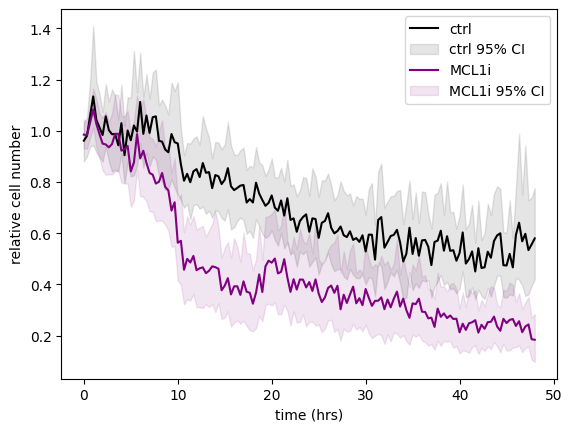

In [57]:
scipy.average=np.mean
scipy.percentile=np.percentile
cellnumber_set_norm=np.zeros_like(cellnumber_set)
for imodel in range(nmodels):
    cellnumber_set_norm[imodel,:]=np.divide(cellnumber_set[imodel,:],np.mean(cellnumber_set[imodel,0:3]))

cellnumber_set_norm[cellnumber_set_norm==np.inf]=np.nan
cellnumber_tmSet=np.zeros((nf,nframes))
cellnumber_bounds=np.zeros((nf,nframes,2))
plt.figure()
ax=plt.gca()
for i_tm in range(nf):
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    cellnumber_tmSet[i_tm,:]=np.nanmean(cellnumber_set_norm[indmodels,:],axis=0)
    for iframe in range(nframes):
        cns=cellnumber_set_norm[indmodels,iframe]
        cns=cns[np.isfinite(cns)]
        cellnumber_bounds[i_tm,iframe,:]=bootstrap.get_CI(cns,1000)
    ax.plot(np.arange(nframes)*sctm.timestep,cellnumber_tmSet[i_tm,:],'-',color=colorSet[i_tm],label=tmSet[i_tm])
    ax.fill_between(np.arange(nframes)*sctm.timestep,cellnumber_bounds[i_tm,:,0],cellnumber_bounds[i_tm,:,1],color=colorSet[i_tm],alpha=.1,label=f'{tmSet[i_tm]} 95% CI')

plt.ylabel('relative cell number')
plt.xlabel('time (hrs)')
plt.legend(loc='upper right')
plt.savefig(f'{date}_cellnumber.png')

In [17]:
#move bad models to their own folder-- can remove later if sure they aren't worth keeping --BE SURE YOU WANT TO DO THIS!!
badfolder='./bad_models'
os.system(f'mkdir {badfolder}')
for h5filename in np.array(modelList)[indbad_models]:
    cmd_str=f'mv {h5filename} {badfolder}/'
    os.system(cmd_str)

Examples of replacing missing features, or calculating new ones

In [ ]:
import ray; ray.init()

In [ ]:
@ray.remote
def get_cellfeatures_akt_distributed(h5filename): #this is recalculating akt cross-corr which had failed on many models
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m1/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        cyto_rep_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        sctm.load_from_h5('/cell_data_m1/')
        output_message=f'{output_message} loaded cell data...'
        corrc_akt=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=akt_img_channel,save_h5=True,overwrite=True)
        corrc_akt=1.-corrc_akt
        clear_output(wait=True)
        #cratio_akt=sctm.get_cell_compartment_ratio(imgchannel=akt_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        output_message=f'{output_message} signaling features...'
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [ ]:
@ray.remote
def get_cellfeatures_ccneighbors_distributed(h5filename): #this is replacing a feature which was calculated wrong
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m1/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        cyto_rep_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        sctm.load_from_h5('/cell_data_m1/')
        output_message=f'{output_message} loaded cell data...'
        Xf_cb,cb_feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,use_mask_for_intensity_image=True,apply_contact_transform=True,bordersize=int(bordersize/2),imgchannel=cyto_rep_msk_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        ind_cbc_start=np.where(sctm.Xf_feature_list==b'featBoundaryCB-0_msk1cmsk1')[0][0]
        nfeat_cbc=Xf_cb.shape[1]
        sctm.Xf[:,ind_cbc_start:ind_cbc_start+nfeat_cbc]=Xf_cb
        sctm.save_to_h5('/cell_data_m1/',['Xf'],overwrite=True)
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [ ]:
results = ray.get([get_cellfeatures_ccneighbors_distributed.remote(h5filename) for h5filename in np.array(modelList)[indgood_models]])

In [ ]:
results = ray.get([get_cellfeatures_akt_distributed.remote(h5filename) for h5filename in np.array(modelList)[indbad_models]])

In [ ]:
ray.shutdown()

In [11]:
modelSet[indgood_models[0]].Xf_feature_list

array([b'featBoundaryCB-0_msk0cmsk0', b'featBoundaryCB-1_msk0cmsk0',
       b'featBoundaryCB-2_msk0cmsk0', b'featBoundaryCB-3_msk0cmsk0',
       b'featBoundaryCB-4_msk0cmsk0', b'featBoundaryCB-5_msk0cmsk0',
       b'featBoundaryCB-6_msk0cmsk0', b'featBoundaryCB-7_msk0cmsk0',
       b'featBoundaryCB-8_msk0cmsk0', b'featBoundaryCB-9_msk0cmsk0',
       b'featBoundaryCB-10_msk0cmsk0', b'featBoundaryCB-11_msk0cmsk0',
       b'featBoundaryCB-12_msk0cmsk0', b'featBoundaryCB-13_msk0cmsk0',
       b'featBoundaryCB-14_msk0cmsk0', b'totalIntensity_msk0img0',
       b'meanIntensity_msk0img0'], dtype='|S32')

#### Select features and perform PCA

In [101]:
ilast=np.where(modelSet[indgood_models[0]].Xf_feature_list==b'featBoundaryCB-14_msk0cmsk0')[0][0];print(modelSet[indgood_models[0]].Xf_feature_list[0:ilast]);

[b'featBoundaryCB-0_msk0cmsk0' b'featBoundaryCB-1_msk0cmsk0'
 b'featBoundaryCB-2_msk0cmsk0' b'featBoundaryCB-3_msk0cmsk0'
 b'featBoundaryCB-4_msk0cmsk0' b'featBoundaryCB-5_msk0cmsk0'
 b'featBoundaryCB-6_msk0cmsk0' b'featBoundaryCB-7_msk0cmsk0'
 b'featBoundaryCB-8_msk0cmsk0' b'featBoundaryCB-9_msk0cmsk0'
 b'featBoundaryCB-10_msk0cmsk0' b'featBoundaryCB-11_msk0cmsk0'
 b'featBoundaryCB-12_msk0cmsk0' b'featBoundaryCB-13_msk0cmsk0']


In [102]:
#image features stored in sctm.Xf, often Zernike polynomials, texture, shape, environment, etc
indkeep_features=np.arange(ilast) #modelSet[indgood_models[0]].Xf.shape[1]).astype(int)
Xf_feature_list=modelSet[indgood_models[0]].Xf_feature_list[indkeep_features]
nfeat=indkeep_features.size
Xf=np.zeros((0,nfeat))
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
for i in indgood_models:
    Xf=np.append(Xf,modelSet[i].Xf[:,indkeep_features],axis=0)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(modelSet[i].Xf.shape[0]).astype(int))

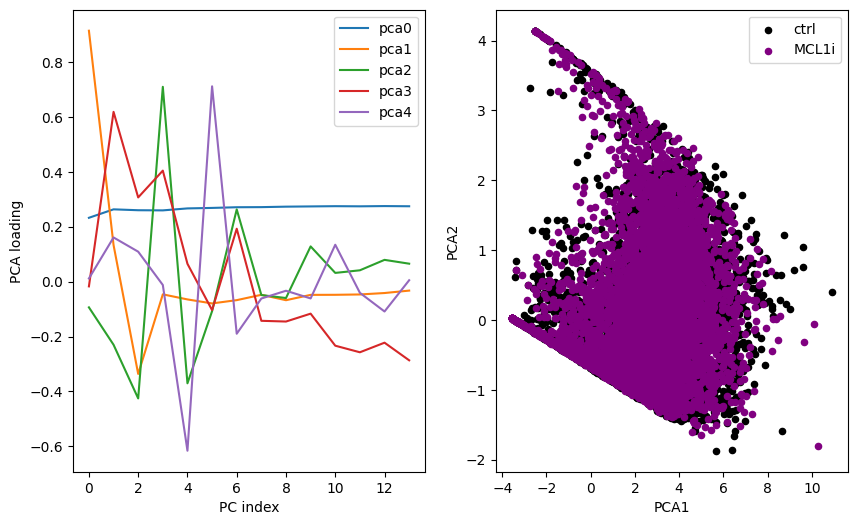

In [103]:
#PCA of image features
#z-norm features
for ifeat in range(Xf.shape[1]): #z-norm all of motility features
    Xf[:,ifeat]=imprep.znorm(Xf[:,ifeat])

Xpca,pca=features.get_pca_fromdata(Xf,var_cutoff=.9); pca.ndim=Xpca.shape[1]

plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
for ipca in range(pca.n_components_):
    plt.plot(pca.components_[ipca,:],label=f'pca{ipca}')

plt.ylabel('PCA loading')
plt.xlabel('PC index')
plt.legend(loc='upper right')

plt.subplot(1,2,2)
for i_tm in range(len(tmSet)):
    inds=np.where(indtreatment==i_tm)[0]
    plt.scatter(Xpca[inds,0],Xpca[inds,1],s=20,label=tmSet[i_tm],color=colorSet[i_tm])

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(loc='upper right')
plt.savefig(f'{date}/pca_plot.png')

In [104]:
#motility features
nfeat_com=3
com_feature_list=np.array(['speed','beta','alpha']).astype('S32')
Xf_com=np.zeros((0,nfeat_com))
for i in indgood_models:
    Xf_com=np.append(modelSet[i].m0_comdx_feat,Xf_com,axis=0)

for icom in range(Xf_com.shape[1]): #z-norm all of motility features
    Xf_com[:,icom]=imprep.znorm(Xf_com[:,icom])

In [105]:
#signaling features
corrc_erk=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{sctm.rep_channel}_crosscorr'
    cc=getattr(sctm,attr_str)
    corrc_erk=np.append(corrc_erk,1.-cc)

corrc_erk_std=np.std(corrc_erk);corrc_erk_mean=np.mean(corrc_erk);corrc_erk=imprep.znorm(corrc_erk)

for i in indgood_models:
    sctm=modelSet[i]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{sctm.rep_channel}_crosscorr'
    cc=getattr(sctm,attr_str)
    corrc_z_model=(np.array([1.-cc]).T-corrc_erk_mean)/corrc_erk_std
    modelSet[i].x_signal=corrc_z_model[:,0].copy()

In [ ]:
#signaling features
cratio_erk=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    attr_str=f'img{sctm.rep_channel}_m{sctm.mskchannel}mNone_ratio'
    cc=getattr(sctm,attr_str)
    cratio_erk=np.append(cratio_erk,cc)

cratio_erk_std=np.std(cratio_erk);cratio_erk_mean=np.mean(cratio_erk);#cratio_erk=imprep.znorm(cratio_erk)

In [106]:
#signaling features
corrc_akt=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    akt_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{akt_channel}_crosscorr'
    cc=getattr(sctm,attr_str)   
    corrc_akt=np.append(corrc_akt,1.-cc)

corrc_akt_std=np.std(corrc_akt);corrc_akt_mean=np.mean(corrc_akt);corrc_akt=imprep.znorm(corrc_akt)
for i in indgood_models:
    sctm=modelSet[i]
    akt_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{akt_channel}_crosscorr'
    cc=getattr(sctm,attr_str)   
    corrc_z_model=(np.array([1.-cc]).T-corrc_akt_mean)/corrc_akt_std
    modelSet[i].x_signal_akt=corrc_z_model[:,0].copy()

In [ ]:
#signaling features
cratio_akt=np.array([]).astype(float)
for i in indgood_models:
    cratio_akt=np.append(cratio_akt,modelSet[i].img2_m1mNone_ratio)

cratio_akt_std=np.std(cratio_akt);cratio_akt_mean=np.mean(cratio_akt);#cratio_akt=imprep.znorm(cratio_akt)

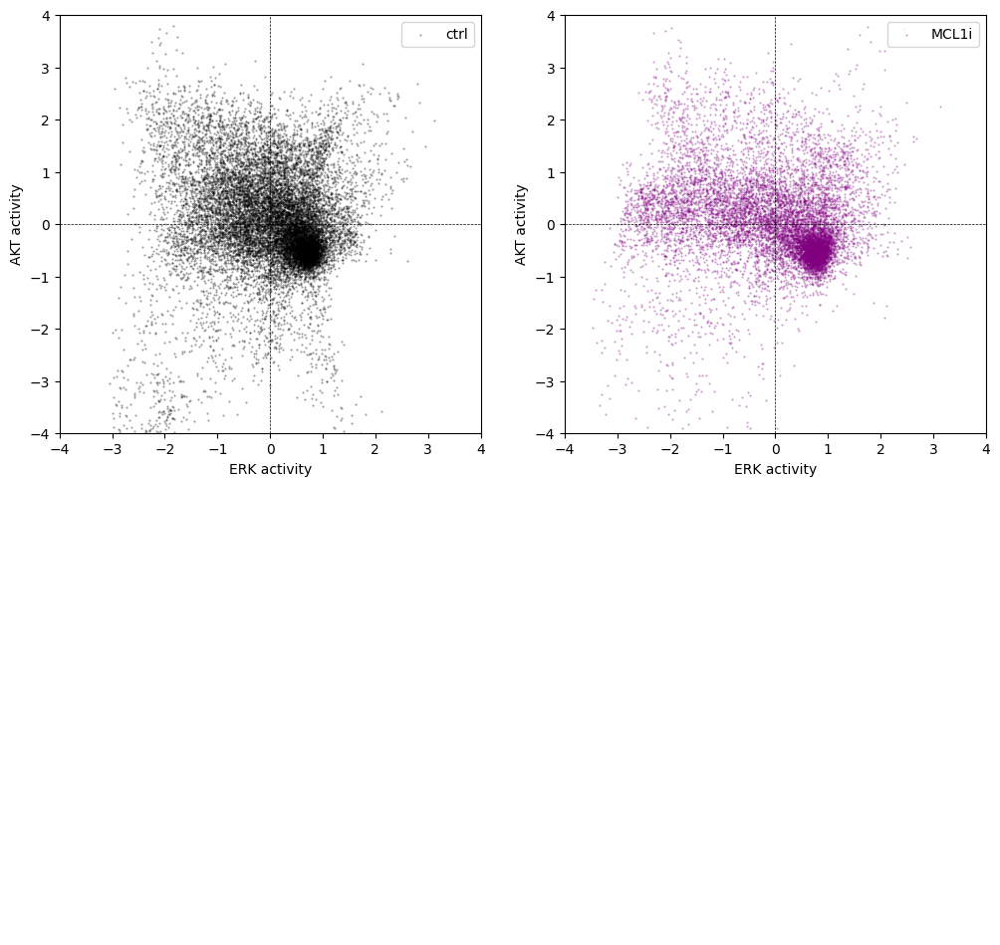

In [82]:
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,sharex=False,sharey=False,figsize=(12,12))
ax=ax.flatten()
for iax in range(nplots*nplots):
    ax[iax].axis('off')

xlow=-4;xhigh=4;ylow=-4;yhigh=4
for i_tm in range(len(tmSet)):
    ax[i_tm].axis('on')
    inds=np.where(indtreatment==i_tm)[0]
    ax[i_tm].scatter(corrc_erk[inds],corrc_akt[inds],s=1,marker='.',label=tmSet[i_tm],color=colorSet[i_tm],alpha=.4)
    ax[i_tm].plot([xlow,xhigh],[0,0],'k--',linewidth=.5)
    ax[i_tm].plot([0,0],[ylow,yhigh],'k--',linewidth=.5)
    ax[i_tm].set_xlim(xlow,xhigh)
    ax[i_tm].set_ylim(ylow,yhigh)
    ax[i_tm].legend(loc='upper right')
    ax[i_tm].set_xlabel('ERK activity')
    ax[i_tm].set_ylabel('AKT activity')

plt.savefig(f'{date}/signaling_plot.png')

In [107]:
#put the features for embedding into Xpca feature vector
feature_list=[]
Xpca=np.zeros((Xf.shape[0],0)) #use this if you want to leave out pca morphology features

#for i in range(pca.ndim):
#    feature_list.append(f'pca{i}')
#    Xpca[:,i]=imprep.znorm(Xpca[:,i]) #z-norm?
    
#Xpca=np.concatenate((Xpca,Xf_com),axis=1)
#for i in range(len(com_feature_list)):
#    feature_list.append(com_feature_list[i].decode())

Xpca=np.concatenate((Xpca,corrc_erk[:,np.newaxis]),axis=1)
feature_list.append('erk-nuc-corr')

Xpca=np.concatenate((Xpca,corrc_akt[:,np.newaxis]),axis=1)
feature_list.append('akt-nuc-corr')

print(feature_list)

for i in indgood_models:
   indsf=np.where(indcells_models==i)[0]
   modelSet[i].Xpca=Xpca[indsf,:]

['erk-nuc-corr', 'akt-nuc-corr']


#### Trajectory embedding

In [108]:
#Analysis identifiers
data_id=f'bonemodel_{date}'

In [ ]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

In [ ]:
##we are going to edit this to save data for analysis elsewhere
for i_tm in range(nf):
    cellindex=np.arange
    df=pandas.DataFrame(data=cellindex)
df['cellid']=cellids
df['frame']=frames
df['field']=fields
df['x']=xset
df['y']=yset
df['fb']=cbset
df.to_csv('CREBi_quantification_JC_31oct22.csv')
    

/tmp/ipykernel_2075/154713709.py:47: RuntimeWarning: Mean of empty slice
  meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
/tmp/ipykernel_2075/154713709.py:48: RuntimeWarning: Mean of empty slice
  meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)


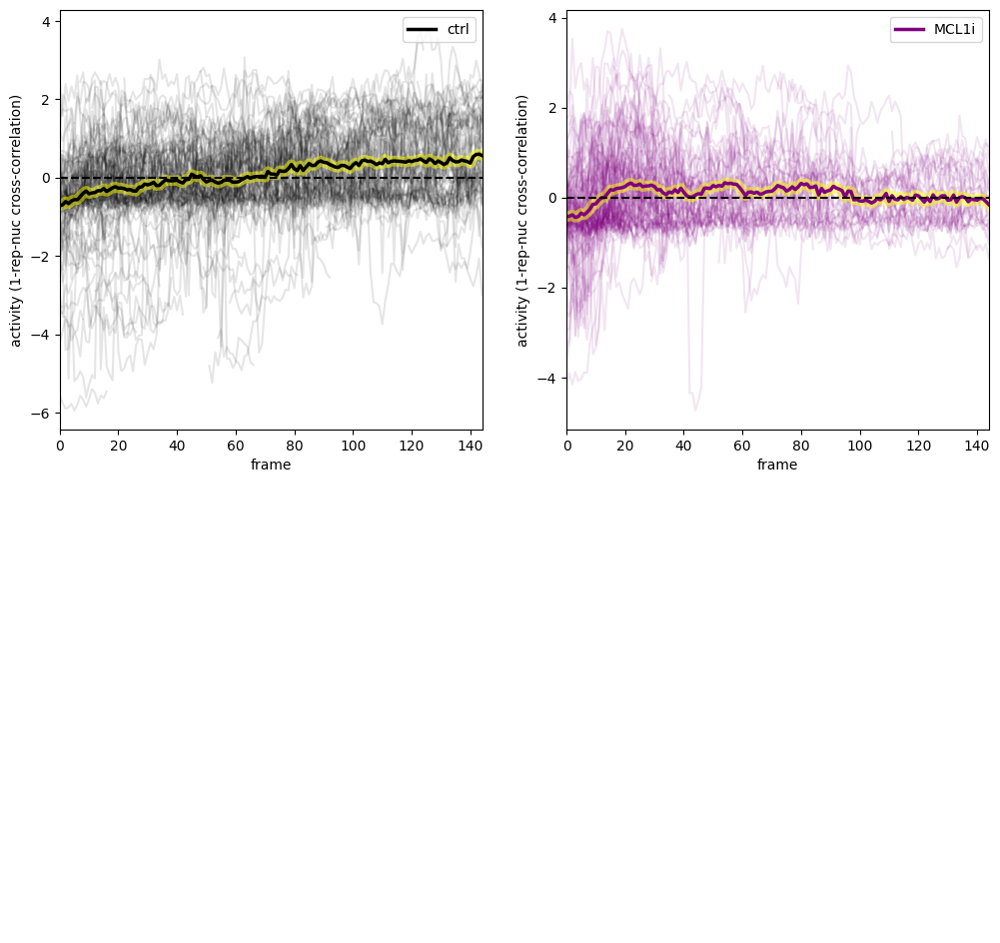

<Figure size 1000x1000 with 0 Axes>

In [85]:
#make a plot of single-cell trajectories, averages, and conditions by frame
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,figsize=(12,12))
ax=ax.flatten()
for iax in range(nplots*nplots):
    ax[iax].axis('off')
    
min_traj_len=10
fig=plt.figure(figsize=(10,10))
trajSet_erk=[None]*len(tmSet)
trajSet_akt=[None]*len(tmSet)
#trajSet_fra1=[None]*len(tmSet)
meanSet_erk=[None]*len(tmSet)
meanSet_akt=[None]*len(tmSet)
#meanSet_fra1=[None]*len(tmSet)
nt=200
for i_tm in range(len(tmSet)):
    ax[i_tm].axis('on')
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    trajs_erk=np.zeros((0,nt))
    trajs_akt=np.zeros((0,nt))
    #trajs_fra1=np.zeros((0,nt))
    frames=np.zeros((0,nt))
    for imodel in ind_models:
        for itraj in range(len(modelSet[imodel].trajectories)):
            trajlen=modelSet[imodel].trajectories[itraj].size
            if trajlen>min_traj_len:
                inds=modelSet[imodel].trajectories[itraj]
                frames=modelSet[imodel].cells_frameSet[inds]
                #cr_erk=modelSet[imodel].img3_m0m1_ratio[inds]
                #cr_akt=modelSet[imodel].img2_m0m1_ratio[inds]
                cr_erk=modelSet[imodel].x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                cr_akt=modelSet[imodel].x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                #cr_fra1=modelSet[imodel].Xf[inds,indfra1]
                tr_erk=np.ones(nt)*np.nan
                tr_akt=np.ones(nt)*np.nan
                #tr_fra1=np.ones(nt)*np.nan
                tr_erk[frames]=cr_erk
                tr_akt[frames]=cr_akt
                #tr_fra1[frames]=cr_fra1
                trajs_erk=np.append(trajs_erk,tr_erk[np.newaxis,:],axis=0)
                trajs_akt=np.append(trajs_akt,tr_akt[np.newaxis,:],axis=0)
                #trajs_fra1=np.append(trajs_fra1,tr_fra1[np.newaxis,:],axis=0)
                #ax[i_tm].plot(frames,cr_erk,'-',color=colorSet[i_tm],alpha=.3)
                ax[i_tm].plot(frames,cr_akt,'-',color=colorSet[i_tm],alpha=.1)
    meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
    meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)
    #meanSet_fra1[i_tm]=np.nanmean(trajs_fra1,axis=0)
    #ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    #ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    ax[i_tm].plot([0,nt],[0,0],'k--')
    ax[i_tm].set_xlim(0,np.max(np.where(np.isfinite(meanSet_erk[i_tm]))[0]))
    trajSet_erk[i_tm]=trajs_erk.copy()
    trajSet_akt[i_tm]=trajs_akt.copy()
    #trajSet_fra1[i_tm]=trajs_fra1.copy()
    ax[i_tm].set_xlabel('frame')
    ax[i_tm].set_ylabel('activity (1-rep-nuc cross-correlation)')
    ax[i_tm].legend(loc='upper right')
    
#plt.savefig(f'{date}/mean_erk_signalingvtime_{data_id}.png')
plt.savefig(f'{date}/mean_akt_signalingvtime_{data_id}.png')
        

/tmp/ipykernel_2075/3702539349.py:47: RuntimeWarning: Mean of empty slice
  meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
/tmp/ipykernel_2075/3702539349.py:48: RuntimeWarning: Mean of empty slice
  meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)


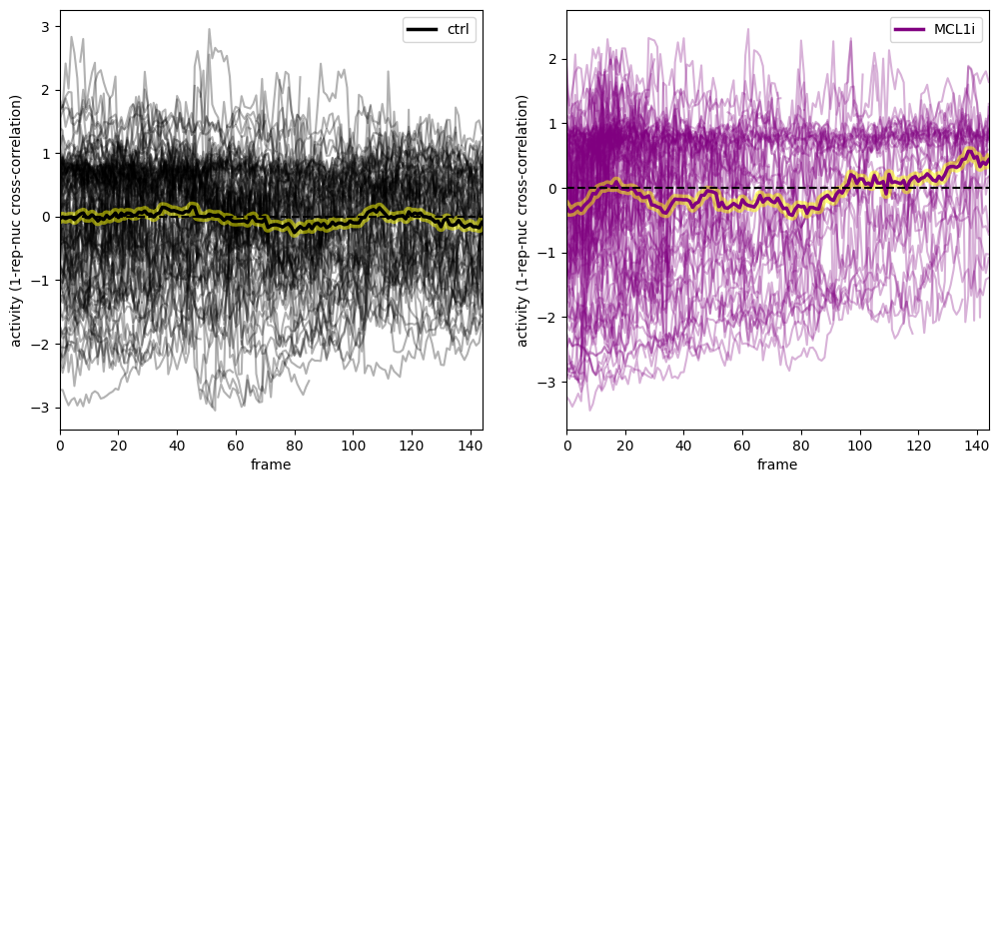

<Figure size 1000x1000 with 0 Axes>

In [86]:
#make a plot of single-cell trajectories, averages, and conditions by frame
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,figsize=(12,12))
ax=ax.flatten()
for iax in range(nplots*nplots):
    ax[iax].axis('off')
    
min_traj_len=10
fig=plt.figure(figsize=(10,10))
trajSet_erk=[None]*len(tmSet)
trajSet_akt=[None]*len(tmSet)
#trajSet_fra1=[None]*len(tmSet)
meanSet_erk=[None]*len(tmSet)
meanSet_akt=[None]*len(tmSet)
#meanSet_fra1=[None]*len(tmSet)
nt=200
for i_tm in range(len(tmSet)):
    ax[i_tm].axis('on')
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    trajs_erk=np.zeros((0,nt))
    trajs_akt=np.zeros((0,nt))
    #trajs_fra1=np.zeros((0,nt))
    frames=np.zeros((0,nt))
    for imodel in ind_models:
        for itraj in range(len(modelSet[imodel].trajectories)):
            trajlen=modelSet[imodel].trajectories[itraj].size
            if trajlen>min_traj_len:
                inds=modelSet[imodel].trajectories[itraj]
                frames=modelSet[imodel].cells_frameSet[inds]
                #cr_erk=modelSet[imodel].img3_m0m1_ratio[inds]
                #cr_akt=modelSet[imodel].img2_m0m1_ratio[inds]
                cr_erk=modelSet[imodel].x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                cr_akt=modelSet[imodel].x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                #cr_fra1=modelSet[imodel].Xf[inds,indfra1]
                tr_erk=np.ones(nt)*np.nan
                tr_akt=np.ones(nt)*np.nan
                #tr_fra1=np.ones(nt)*np.nan
                tr_erk[frames]=cr_erk
                tr_akt[frames]=cr_akt
                #tr_fra1[frames]=cr_fra1
                trajs_erk=np.append(trajs_erk,tr_erk[np.newaxis,:],axis=0)
                trajs_akt=np.append(trajs_akt,tr_akt[np.newaxis,:],axis=0)
                #trajs_fra1=np.append(trajs_fra1,tr_fra1[np.newaxis,:],axis=0)
                ax[i_tm].plot(frames,cr_erk,'-',color=colorSet[i_tm],alpha=.3)
                #ax[i_tm].plot(frames,cr_akt,'-',color=colorSet[i_tm],alpha=.1)
    meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
    meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)
    #meanSet_fra1[i_tm]=np.nanmean(trajs_fra1,axis=0)
    ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    #ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    #ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    ax[i_tm].plot([0,nt],[0,0],'k--')
    ax[i_tm].set_xlim(0,np.max(np.where(np.isfinite(meanSet_erk[i_tm]))[0]))
    trajSet_erk[i_tm]=trajs_erk.copy()
    trajSet_akt[i_tm]=trajs_akt.copy()
    #trajSet_fra1[i_tm]=trajs_fra1.copy()
    ax[i_tm].set_xlabel('frame')
    ax[i_tm].set_ylabel('activity (1-rep-nuc cross-correlation)')
    ax[i_tm].legend(loc='upper right')
    
plt.savefig(f'{date}/mean_erk_signalingvtime_{data_id}.png')
#plt.savefig(f'{date}/mean_akt_signalingvtime_{data_id}.png')
        

In [44]:
def show_cellsignal(self,ax,icell,cmap_nuc=plt.cm.Purples,cmap_rep=plt.cm.inferno,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=False,show_neighbor_signals=False,show_seg=True):
    #plt.figure(figsize=(6,6))
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
    if rep_img_channel is None:
        rep_img_channel=self.rep_channel
    if nuc_img_channel is None:
        nuc_img_channel=self.nuc_channel
    #if bf_img_channel is None:
    #    bf_img_channel=self.bf_channel
    imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0],boundary_expansion=[1,viewsize,viewsize])
    imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
    if not projection:
        mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
        hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
        islice=mslices[hslice]
        img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
        #img_rep=imprep.znorm(np.max(imgc[...,rep_img_channel],axis=0))
        img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
        #img_nuc=imprep.znorm(np.max(imgc[...,nuc_img_channel],axis=0))
        #img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
        #img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
        #img_bf=imprep.znorm(np.max(img_bf,axis=0))
        msk_cyto=mskc[islice,:,:,cyto_msk_channel]
        #msk_cyto=np.max(mskc[...,cyto_msk_channel],axis=0)
        msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
    else:
        img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
        img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
        #img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
        #img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
        msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
        msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
    if nuchigh is None:
        nuclow=np.percentile(img_nuc,90);nuchigh=np.percentile(img_nuc,99)
    #img_bf=np.abs(img_bf)
    img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
    img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
    img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
    img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
    #img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
    if rephigh is None:
        replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
    #if bfhigh is None:
    #    bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
    msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
    msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
    #ax.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
    if show_neighbor_signals:
        ax.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=cmap_rep,alpha=.7)
    else:
        ax.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=cmap_rep,alpha=.7)
    csn=ax.contour(img_nuc,levels=np.linspace(nuclow,nuchigh,4),cmap=cmap_nuc,alpha=0.6,linewidths=1)
    if show_seg:
        csn=ax.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
    csn.cmap.set_over('darkred')
    csn.cmap.set_under('white')
    ax.axis('off')
    return 0

In [26]:
tmSet

['ctrl', 'MCL1i']

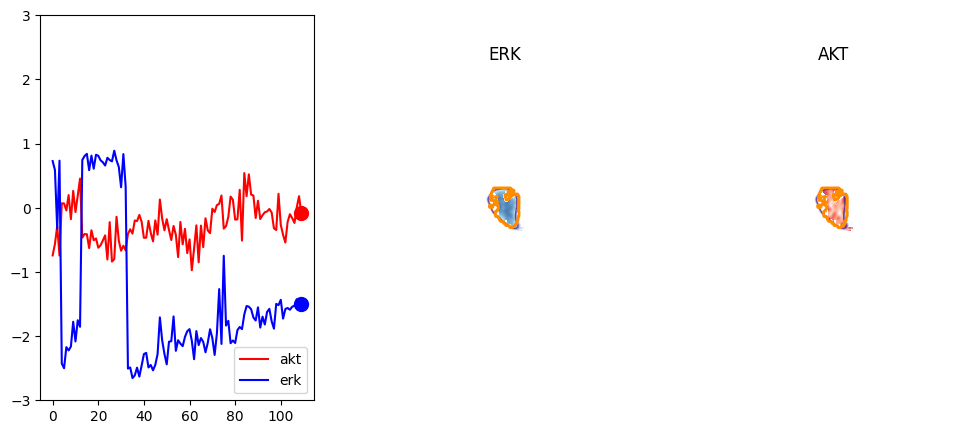

In [45]:
#explore some single-cell signaling trajectories
min_traj_len=50
ntraj_show=1
save_pic=True
pic_directory=f'{date}/signaltraj_{date}'
os.system(f'mkdir -p {pic_directory}')
for i_tm in range(len(tmSet)):
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    for imodel in ind_models:
        sctm=modelSet[imodel]
        itraj_show=0
        ntraj=len(modelSet[imodel].trajectories)
        trajlengths=np.zeros(ntraj)
        erk_means=np.zeros(ntraj)
        erk_stds=np.zeros(ntraj)
        for itraj in range(ntraj):
            trajlengths[itraj]=sctm.trajectories[itraj].size
            erk_stds[itraj]=np.std(sctm.x_signal[sctm.trajectories[itraj]])
            erk_means[itraj]=np.max(sctm.x_signal[sctm.trajectories[itraj]])
        indtrajs=np.flip(np.argsort(erk_stds))
        for itr in range(ntraj):
            itraj=indtrajs[itr]
            if trajlengths[itraj]>min_traj_len:
                if itraj_show<ntraj_show:
                    itraj_show=itraj_show+1
                    inds=sctm.trajectories[itraj]
                    frames=sctm.cells_frameSet[inds]
                    #cr_erk=sctm.img3_m0m1_ratio[inds]
                    #cr_akt=sctm.img2_m0m1_ratio[inds]
                    cr_erk=sctm.x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                    cr_akt=sctm.x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                    for itt in [inds.size-1]: #range(inds.size):
                        ic=inds[itt]
                        fig,ax=plt.subplots(1,3,figsize=(12,5))
                        ax[1].set_title('ERK')
                        show_cellsignal(sctm,ax[1],ic,projection=False,show_seg=True,cmap_rep=plt.cm.Blues,cyto_msk_channel=cyto_msk_channel,rep_img_channel=erk_img_channel,nuc_img_channel=nuc_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
                        ax[2].set_title('AKT')
                        show_cellsignal(sctm,ax[2],ic,projection=False,show_seg=True,cmap_rep=plt.cm.Reds,cyto_msk_channel=cyto_msk_channel,rep_img_channel=akt_img_channel,nuc_img_channel=nuc_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
                        ax[0].plot(frames,cr_akt,'-',color='red',alpha=1.,label='akt')
                        ax[0].plot(frames,cr_erk,'-',color='blue',alpha=1.,label='erk')
                        ax[0].set_ylim(-3,3)
                        ax[0].legend(loc='lower right')
                        ax[0].scatter([frames[itt]],[cr_erk[itt]],s=100,marker='o',c='blue')
                        ax[0].scatter([frames[itt]],[cr_akt[itt]],s=100,marker='o',c='red')
                        if save_pic:
                            plt.savefig(f'{pic_directory}/{tmSet[i_tm]}_m{imodel}traj{itraj}c{inds[-1]}_{itt:04d}.png')
                        plt.pause(1)
                        clear_output(wait=True)
                        

In [ ]:
i_tm=7
imodel=86
itraj=2
sctm=modelSet[imodel]
inds=sctm.trajectories[itraj]
frames=sctm.cells_frameSet[inds]
inds=sctm.trajectories[itraj]
frames=sctm.cells_frameSet[inds]
#cr_erk=sctm.img3_m0m1_ratio[inds]
#cr_akt=sctm.img2_m0m1_ratio[inds]
cr_erk=sctm.x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
cr_akt=sctm.x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
for itt in range(inds.size):
    ic=inds[itt]
    fig,ax=plt.subplots(1,3,figsize=(12,5))
    ax[1].set_title('ERK')
    show_cellsignal(sctm,ax[1],ic,projection=True,show_seg=False,cmap_rep=plt.cm.Blues,cyto_msk_channel=cyto_msk_channel,rep_img_channel=erk_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
    ax[2].set_title('AKT')
    show_cellsignal(sctm,ax[2],ic,projection=True,show_seg=False,cmap_rep=plt.cm.Reds,cyto_msk_channel=cyto_msk_channel,rep_img_channel=akt_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
    ax[0].plot(frames,cr_akt,'-',color='red',alpha=1.,label='akt')
    ax[0].plot(frames,cr_erk,'-',color='blue',alpha=1.,label='erk')
    ax[0].set_ylim(-3,3)
    ax[0].legend(loc='lower right')
    ax[0].scatter([frames[itt]],[cr_erk[itt]],s=100,marker='o',c='blue')
    ax[0].scatter([frames[itt]],[cr_akt[itt]],s=100,marker='o',c='red')
    if save_pic:
        plt.savefig(f'{pic_directory}/{tmSet[i_tm]}_slice_m{imodel}traj{itraj}c{inds[-1]}_{itt:04d}.png')
    plt.pause(.01)
    clear_output(wait=True)

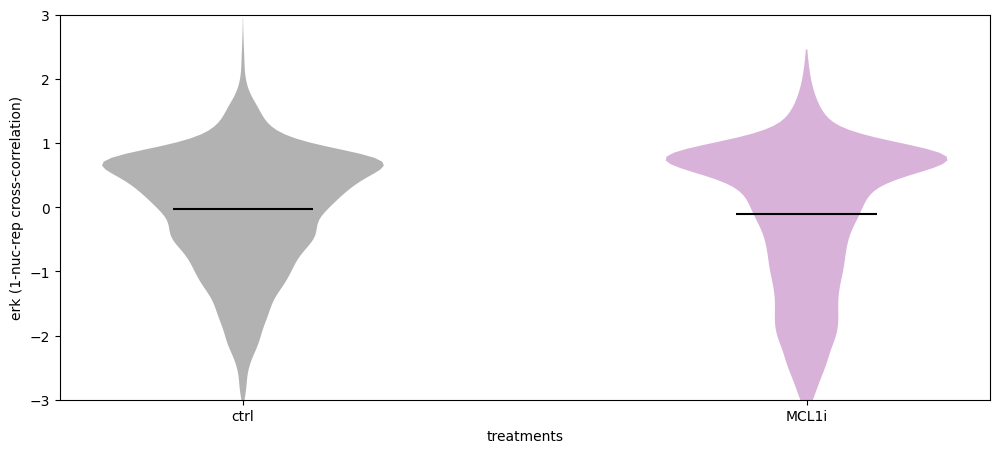

In [46]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_erk[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
ax.set_ylim(-3,3)
plt.ylabel('erk (1-nuc-rep cross-correlation)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_erk_tearplot_{data_id}.png')

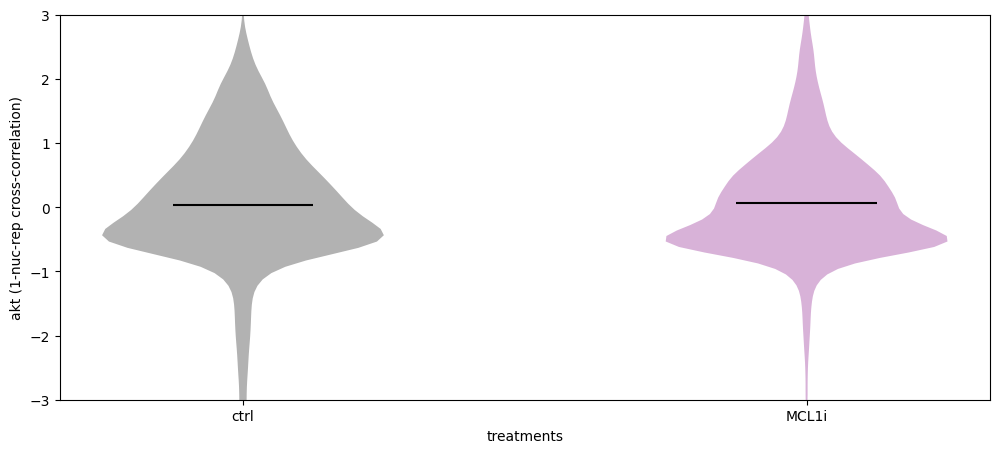

In [47]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_akt[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
ax.set_ylim(-3,3)
plt.ylabel('akt (1-nuc-rep cross-correlation)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_akt_tearplot_{data_id}.png')

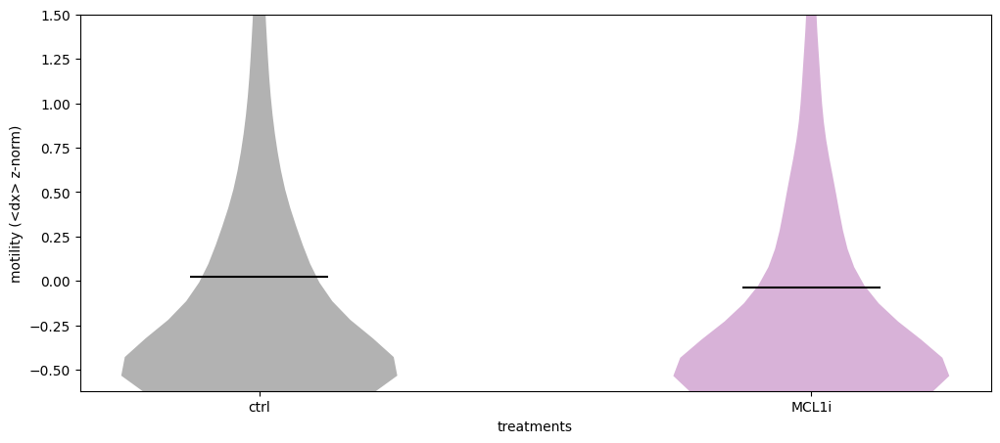

In [48]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
ifeat=0 #np.where(modelSet[0].Xf_feature_list==b'meanIntensity_msk0img1')[0][0]
for i_tm in range(n_tm):
    inds=indtreatment==i_tm
    setv=Xf_com[inds,ifeat]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
plt.ylabel('motility (<dx> z-norm)')
plt.xlabel('treatments')
plt.ylim(-.62,1.5)
plt.savefig(f'{date}/motility_tearplot_{data_id}.png')

Signaling state analysis

In [87]:
#signal environment feature
scut=0.
sigState=np.array([]).astype(int)
for i in indgood_models:
    sigState=np.append(sigState,modelSet[i].x_signal>scut)
    modelSet[i].sigState=modelSet[i].x_signal>scut

In [369]:
sigState

array([0, 1, 1, ..., 1, 1, 1])

In [ ]:
ray.shutdown()

In [88]:
import ray; ray.init()

2024-06-21 09:31:56,296	INFO worker.py:1740 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


Python version:,3.9.19
Ray version:,2.20.0
Dashboard:,http://127.0.0.1:8265


(raylet) [2024-06-21 09:32:05,237 E 206856 206897] (raylet) file_system_monitor.cc:111: /tmp/ray/session_2024-06-21_09-31-52_365123_2075 is over 95% full, available space: 17539084288; capacity: 3095205306368. Object creation will fail if spilling is required.
(raylet) [2024-06-21 09:32:15,250 E 206856 206897] (raylet) file_system_monitor.cc:111: /tmp/ray/session_2024-06-21_09-31-52_365123_2075 is over 95% full, available space: 17539072000; capacity: 3095205306368. Object creation will fail if spilling is required.
(raylet) [2024-06-21 09:32:25,263 E 206856 206897] (raylet) file_system_monitor.cc:111: /tmp/ray/session_2024-06-21_09-31-52_365123_2075 is over 95% full, available space: 17539067904; capacity: 3095205306368. Object creation will fail if spilling is required.
(raylet) [2024-06-21 09:32:35,276 E 206856 206897] (raylet) file_system_monitor.cc:111: /tmp/ray/session_2024-06-21_09-31-52_365123_2075 is over 95% full, available space: 17539063808; capacity: 3095205306368. Object 

(get_smean_csize_distributed pid=207008) Solver suite is petsc
(get_smean_csize_distributed pid=206986) {'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.1', 'matplotlib': '3.9.0', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': '4.8.4', 'solver': 'petsc'}
(get_smean_csize_distributed pid=206991) Solver suite is petsc [repeated 17x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options.)
(get_smean_csize_distributed pid=206988) {'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.1', 'matplotlib

In [89]:
@ray.remote
def get_smean_csize_distributed(imodel,db):
    print(f'?, {imodel}')
    sctm=db[imodel]
    print(sctm.h5filename)
    rsmooth=sctm.cellpose_diam/4.
    zcut=2.0
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    Smean_csize_akt=np.array([]).astype(float)
    for iframe in range(sctm.nt):
        print(f'extracting cluster data for model {imodel}, frame {iframe}')
        msk=sctm.get_mask_data(iframe);
        msk_cyto=msk[...,cyto_msk_channel];
        #msk_nuc=msk[...,nuc_msk_channel];
        img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
        img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
        fmsk=imprep.znorm(img_rep_smth)>zcut
        indframe=np.where(sctm.cells_frameSet==iframe)[0]
        sigS=sctm.x_signal[indframe]
        sigS_akt=sctm.x_signal_akt[indframe]
        fmap=imprep.get_feature_map(sigS,msk_cyto)
        msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
        for icluster in np.unique(msk_clusters)[1:]:
            #print(f'{iframe}, {icluster}')
            indc=np.unique(msk_cyto[msk_clusters==icluster])
            indc=indc[indc>0]-1 #indices one less than labeled mask, ignore 0
            if indc.size>0:
                Smean_csize=np.append(Smean_csize,np.mean(sigS[indc]))
                Smean_csize_akt=np.append(Smean_csize_akt,np.mean(sigS_akt[indc]))
                csize=np.append(csize,indc.size)
    sctm.Smean_csize=Smean_csize
    sctm.Smean_csize_akt=Smean_csize_akt
    sctm.csize=csize
    sctm.save_to_h5('/cell_data_m1/',['Smean_csize','Smean_csize_akt','csize'],overwrite=True)
    return Smean_csize,Smean_csize_akt,csize

In [ ]:
print(tmSet)
inds_tmSet_models

In [399]:
#result=get_smean_csize_distributed(indgood_models[0],modelSet)
len(indgood_models)

155

In [383]:
modelSet[indgood_models[0]].load_from_h5('/cell_data_m1/')

loading /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5:/cell_data_m1/


True

In [423]:
plt.scatter(modelSet[indgood_models[2]].csize,modelSet[indgood_models[2]].Smean_csize)

AttributeError: 'Trajectory' object has no attribute 'csize'

In [90]:
#get cluster size dependence with signaling
#db_object_ref = ray.put(modelSet)
#indmodels_ctrl=np.where(inds_tmSet_models==0)[0]
#indmodels=np.intersect1d(indmodels_ctrl,indgood_models)
results2 = ray.get([get_smean_csize_distributed.remote(imodel, modelSet) for imodel in list(indgood_models)])

In [420]:
len(results2[1])

2

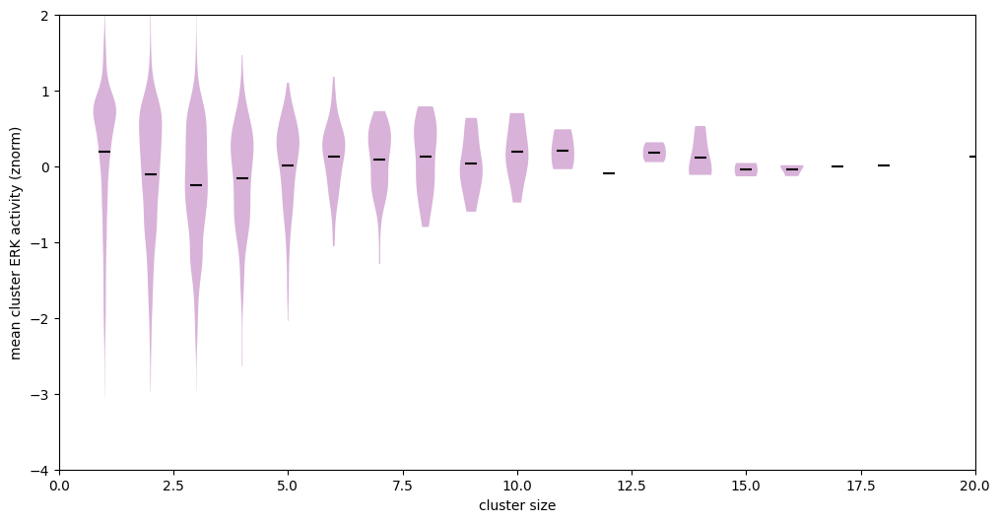

In [92]:
csize=np.array([]).astype(int)
Smean_csize=np.array([]).astype(float)
Smean_csize_akt=np.array([]).astype(float)
inds_csize_models=np.array([]).astype(int)
#indmodels=np.where(inds_tmSet_models==0)[0]
#indmodels=np.intersect1d(indmodels,indgood_models)
for imodel in indgood_models: #indmodels:
    iresult=np.where(indgood_models==imodel)[0][0]
    csize=np.append(csize,results2[iresult][2])
    Smean_csize=np.append(Smean_csize,results2[iresult][0])
    Smean_csize_akt=np.append(Smean_csize_akt,results2[iresult][1])
    inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)

plt.figure(figsize=(12,6))
ax=plt.gca()
for i_size in range(np.max(csize)):
    inds=csize==i_size
    setv=Smean_csize[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')    
plt.ylabel('mean cluster ERK activity (znorm)')
plt.xlabel('cluster size')
plt.ylim(-4,2)
plt.xlim(0,20)
plt.savefig(f'{date}/smeans_csize_ERK_{data_id}.png')
plt.pause(.1)

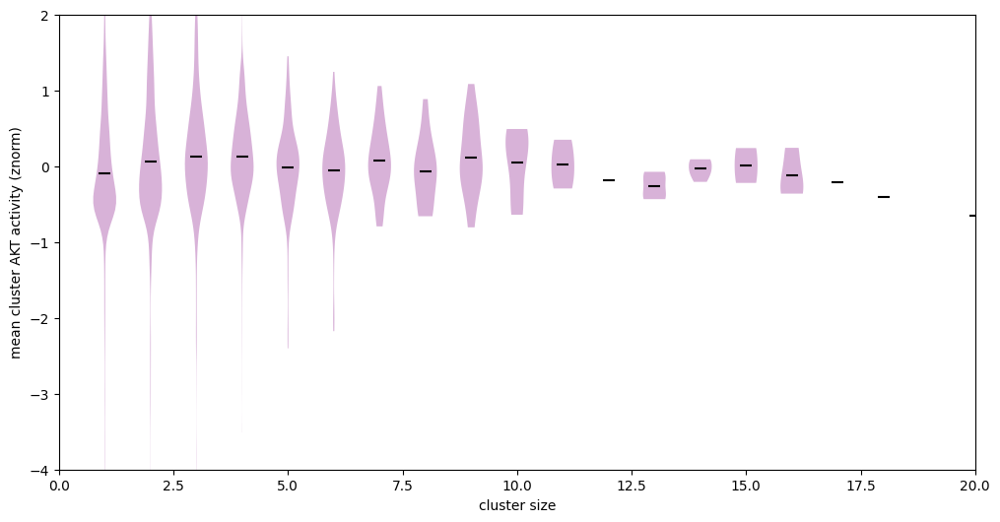

In [93]:
plt.figure(figsize=(12,6))
ax=plt.gca()
for i_size in range(np.max(csize)):
    inds=csize==i_size
    setv=Smean_csize_akt[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')    
plt.ylabel('mean cluster AKT activity (znorm)')
plt.xlabel('cluster size')
plt.ylim(-4,2)
plt.xlim(0,20)
plt.savefig(f'{date}/smeans_csize_AKT_{data_id}.png')
plt.pause(.1)

In [95]:
Smean_csize_set=[None]*nf
Smean_csize_akt_set=[None]*nf
csize_set=[None]*nf
for i_tm in range(nf):
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    Smean_csize_akt=np.array([]).astype(float)
    inds_csize_models=np.array([]).astype(int)
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    for imodel in indmodels:
        iresult=np.where(indgood_models==imodel)[0][0]
        csize=np.append(csize,results2[iresult][2])
        Smean_csize=np.append(Smean_csize,results2[iresult][0])
        Smean_csize_akt=np.append(Smean_csize_akt,results2[iresult][1])
        inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)
    Smean_csize_set[i_tm]=Smean_csize.copy()
    Smean_csize_akt_set[i_tm]=Smean_csize_akt.copy()
    csize_set[i_tm]=csize.copy()


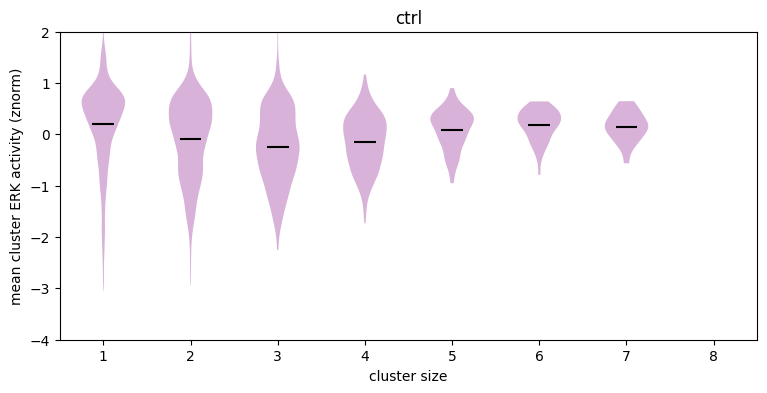

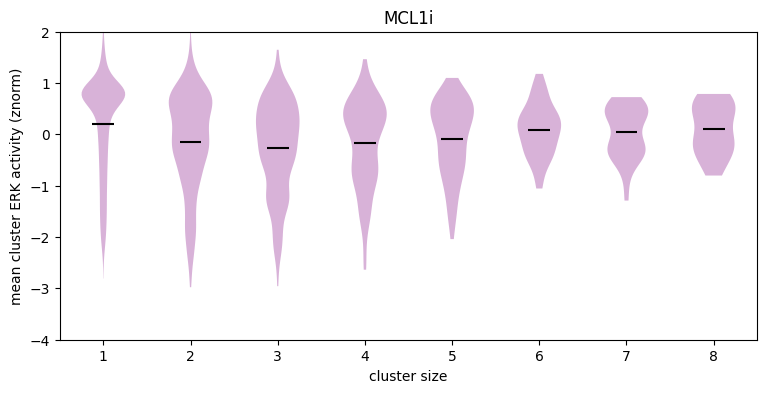

In [96]:
for i_tm in range(nf):
    Smean_csize=Smean_csize_set[i_tm]
    csize=csize_set[i_tm]
    plt.figure(figsize=(9,4))
    ax=plt.gca()
    for i_size in range(np.max(csize)):
        inds=csize==i_size
        setv=Smean_csize[inds]
        setv=setv[np.isfinite(setv)]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('purple')    
    plt.ylabel('mean cluster ERK activity (znorm)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])
    plt.ylim(-4,2)
    plt.xlim(0.5,8.5)
    plt.savefig(f'{date}/smeans_csize_erk_{data_id}_{tmSet[i_tm]}.png')
    plt.pause(.1)

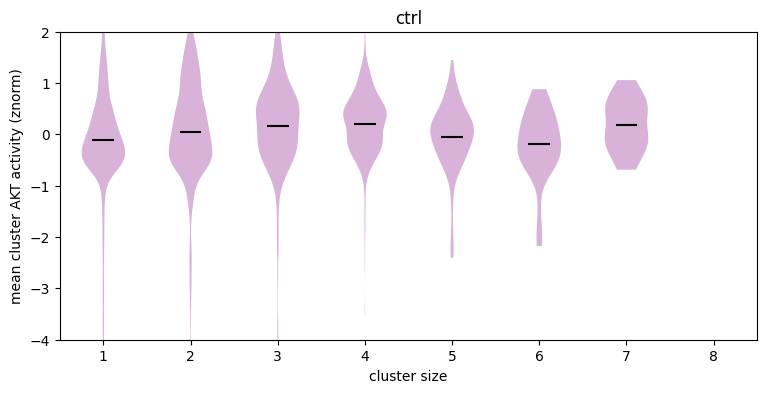

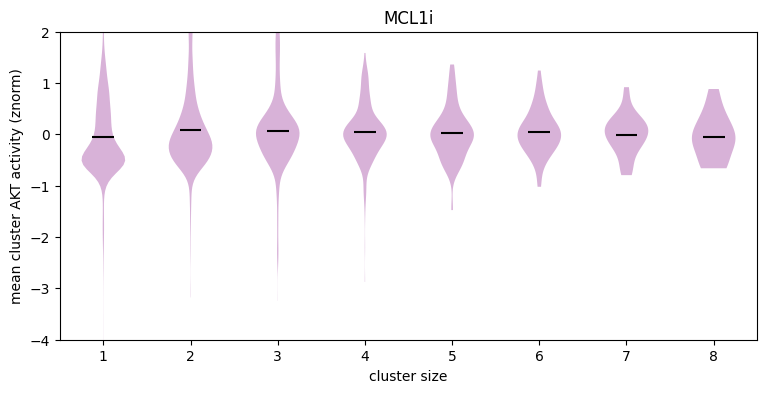

In [98]:
for i_tm in range(nf):
    Smean_csize_akt=Smean_csize_akt_set[i_tm]
    csize=csize_set[i_tm]
    plt.figure(figsize=(9,4))
    ax=plt.gca()
    for i_size in range(np.max(csize)):
        inds=csize==i_size
        setv=Smean_csize_akt[inds]
        setv=setv[np.isfinite(setv)]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('purple')    
    plt.ylabel('mean cluster AKT activity (znorm)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])
    plt.ylim(-4,2)
    plt.xlim(0.5,8.5)
    plt.savefig(f'{date}/smeans_csize_akt_{data_id}_{tmSet[i_tm]}.png')
    plt.pause(.1)

In [432]:
iresult

154

In [ ]:
plt.figure(figsize=(7,6))
ax=plt.gca()
for i_tm in range(len(tmSet)):
    indm=np.where(inds_tmSet_models==i_tm)[0]
    inds_csize=np.where(csize==1)[0]
    inds_tm=np.where(np.isin(inds_csize_models,indm))[0]
    inds=np.intersect1d(inds_tm,inds_csize)
    setv=Smean_csize[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
plt.xlabel('treatments')
plt.ylabel('mean ERK signal (z-norm)')
#plt.ylim(0,1.1)
#plt.savefig(f'{date}/smeans_csize_{data_id}.png')

In [ ]:
inds_csize

In [ ]:
iframe=0
print(f'extracting cluster data for model {i}, frame {iframe}')
msk=sctm.get_mask_data(iframe);
msk_cyto=msk[...,cyto_msk_channel];
msk_nuc=msk[...,nuc_msk_channel];
img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
fmsk=imprep.znorm(img_rep_smth)>zcut
indframe=np.where(sctm.cells_frameSet==iframe)[0]
sigS=sctm.sigState[indframe]
fmap=imprep.get_feature_map(sigS,msk_cyto)
msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
for icluster in np.unique(msk_clusters)[1:]:
    indc=np.unique(msk_cyto[msk_clusters==icluster])
    indc=indc[indc>0]-1 #indices one less than labeled mask, ignore 0
    if indc.size>0:
        Smean_csize=np.append(Smean_csize,np.mean(sigS[indc]))
        csize=np.append(csize,indc.size)
        if visual_csize and indc.size>0:
            plt.clf()
            print(np.unique(msk_clusters))         
            plt.contour(np.max(fmap,axis=0),levels=[0,1],colors='red')
            img_test=np.zeros_like(img_rep);img_test[msk_clusters==icluster]=np.mean(sigS[indc])
            plt.imshow(np.max(img_test,axis=0),clim=(0,1),cmap=plt.cm.Reds)
            plt.contour(np.max(msk_clusters,axis=0),levels=np.unique(msk_clusters),cmap=plt.cm.Greens)
            plt.pause(.1)

In [51]:
def get_tcf(self, trajectories=None, x=None, minlength=2):
    if x is None:
        x=self.Xpca
    if trajectories is None:
        trajectories = self.trajectories
    ntraj = len(trajectories)
    traj_lengths = np.zeros(ntraj)
    for itraj in range(ntraj):
        traj_lengths[itraj] = trajectories[itraj].size
    nframes = np.max(traj_lengths)
    nt = np.floor(nframes / 2).astype(int)
    dxcorr = np.zeros(nt)
    tnorm = np.zeros(nt)
    for itraj in range(ntraj):
        cell_traj = trajectories[itraj]
        traj_len = cell_traj.size
        nmax = np.floor(traj_len / 2).astype(int)
        if traj_len > minlength:
            xtraj = x[cell_traj,:]
            for it1 in range(nmax):
                for it2 in range(it1, it1 + nmax):
                    it = it2 - it1
                    #dxcorr[it] = dxcorr[it] + np.sum(np.power(xtraj[it1, :]-xtraj[it2, :],2))
                    corr=np.dot(xtraj[it1,:],xtraj[it2,:])
                    if np.isfinite(corr):
                        dxcorr[it]=dxcorr[it]+corr
                        tnorm[it] = tnorm[it] + 1
    for it in range(nt):
        dxcorr[it] = dxcorr[it] / tnorm[it]
    return dxcorr

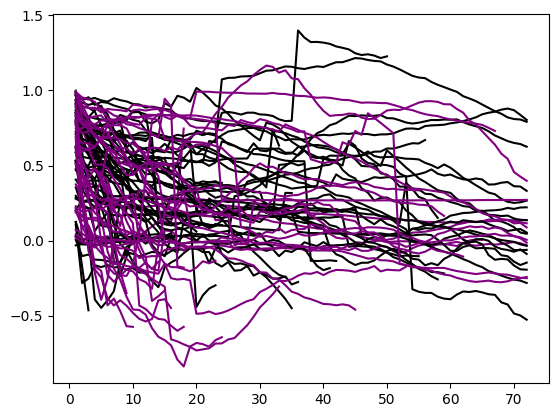

In [110]:
tcfSet=[None]*nmodels
for imodel in indgood_models:
    sctm=modelSet[imodel]
    tcf=sctm.get_tcf(x=sctm.Xpca,minlength=1)
    if tcf.size>0:
        av_sq=np.sum(np.power(np.nanmean(sctm.Xpca,axis=0),2))
        avsq=np.nanmean(np.power(np.linalg.norm(sctm.Xpca,axis=1),2))
        tcf=(tcf-av_sq)/tcf[0] #auto-correlation
        tcfSet[imodel]=tcf
        plt.plot(np.arange(1,tcf.size+1),tcf,color=colorSet[inds_tmSet_models[imodel]],label=tmSet[inds_tmSet_models[imodel]])


/tmp/ipykernel_2075/1816168791.py:11: RuntimeWarning: Mean of empty slice
  tcf_tm[i_tm]=np.nanmean(tcfs,axis=1)


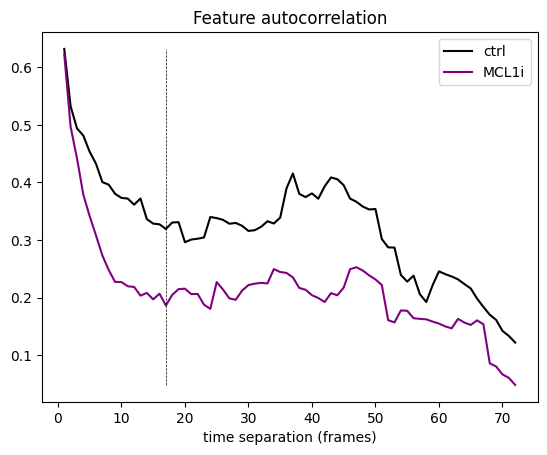

In [113]:
tcf_tm=[None]*nf
tmax=80
for i_tm in range(nf):
    ind_models=indgood_models[inds_tmSet_models[indgood_models]==i_tm]
    tcfs=np.ones((tmax,ind_models.size))*np.nan
    for ii in range(ind_models.size):
        if tcfSet[ind_models[ii]] is not None:
            tmax_model=tcfSet[ind_models[ii]].size
            tmax_model=np.min(np.array([tmax,tmax_model]))
            tcfs[0:tmax_model,ii]=tcfSet[ind_models[ii]][0:tmax_model]
    tcf_tm[i_tm]=np.nanmean(tcfs,axis=1)
    plt.plot(np.arange(1,tmax+1),tcf_tm[i_tm],color=colorSet[i_tm],label=tmSet[i_tm])

#plt.ylim(-.1,.3)
trajl=17
plt.plot([trajl,trajl],[np.nanmin(tcf_tm),np.nanmax(tcf_tm)],'k--',linewidth=.5)
plt.title('Feature autocorrelation');plt.xlabel('time separation (frames)');plt.legend(loc='upper right')
plt.savefig(f'{date}/feature_autocorrelation.png')

In [65]:
sctm.Xpca[:,0]

array([ 0.17084293,  0.11891695,  0.21667627,  0.3226894 , -0.17503034,
       -0.08679219, -0.11704893, -0.22805839, -0.11755464, -0.11376409,
       -0.40957929, -0.16972377, -0.25592696, -0.13565864,  0.08303833,
       -0.10988982,  0.04904304,  0.05354362, -0.18788386,  0.18068815,
        0.16317437,  0.17675529,  0.08878995, -0.07447307, -0.20734184,
       -0.02834856,  0.13446553, -0.03005006, -0.05955116,  0.02934457,
        0.0354108 ,  0.0735306 ,  0.13860081,  0.19470199,  0.38237569,
        0.05422065,  0.02775272, -0.24050789,  0.41505017, -0.03965284,
        0.11025513])

In [ ]:
indgood_models

In [ ]:
#trajectory embedding
trajl=17
#ind_cb=np.where(Xf_feature_list==b'featBoundaryCB-0_msk1img0_fmsk')[0][0]
ind_cbc=np.where(Xf_feature_list==b'featBoundaryCB-0_msk0cmsk0')[0][0]
pca.ndim=modelSet[indgood_models[0]].Xpca.shape[1]
Xpcat=np.zeros((0,pca.ndim*trajl))
indtreatment_traj=np.array([]).astype(int)
indstack_traj=np.array([]).astype(int)
indframes_traj=np.array([]).astype(int)
cellinds0_traj=np.array([]).astype(int)
cellinds1_traj=np.array([]).astype(int)
cbc_ratio_traj=np.array([])
#cb_ratio_traj=np.array([])
corrc_erk_traj=np.array([]).astype(float)
z_traj=np.array([]).astype(float)
corrc_erk_full_traj=np.zeros((0,trajl))
corrc_akt_traj=np.array([]).astype(float)
corrc_akt_full_traj=np.zeros((0,trajl))
cbc_ratio_full_traj=np.zeros((0,trajl))
#cb_ratio_full_traj=np.zeros((0,trajl))
dx_full_traj=np.zeros((0,trajl))
dx_traj=np.array([])
beta_traj=np.array([])
alpha_traj=np.array([])
for i in indgood_models:
    print('building trajectory data for model {}...'.format(i))
    modelSet[i].trajectories=all_trajSet[i].copy()
    modelSet[i].trajl=trajl
    modelSet[i].traj=modelSet[i].get_traj_segments(trajl)
    data=modelSet[i].Xpca[modelSet[i].traj,:]
    #datacom=modelSet[i].Xf_com[modelSet[i].traj,:]
    data=data.reshape(modelSet[i].traj.shape[0],modelSet[i].Xpca.shape[1]*trajl)
    #datacom=datacom.reshape(modelSet[i].traj.shape[0],modelSet[i].Xf_com.shape[1]*trajl)
    #data=np.append(data,datacom,axis=1)
    indgood=np.where(np.sum(np.isnan(data),axis=1)==0)[0]
    data=data[indgood,:]
    modelSet[i].traj=modelSet[i].traj[indgood,:]
    Xpcat=np.append(Xpcat,data,axis=0)
    indtreatment_traj=np.append(indtreatment_traj,i*np.ones(data.shape[0]).astype(int))
    indstacks=modelSet[i].cells_imgfileSet[modelSet[i].traj[:,0]]
    indstack_traj=np.append(indstack_traj,indstacks)
    indframes=modelSet[i].cells_frameSet[modelSet[i].traj[:,0]]
    indframes_traj=np.append(indframes_traj,indframes)
    cellinds0=modelSet[i].traj[:,0]
    cellinds0_traj=np.append(cellinds0_traj,cellinds0)
    cellinds1=modelSet[i].traj[:,-1]
    #cc_ratio=modelSet[i].cc_ratio[cellinds1]
    #cc_ratio_traj=np.append(cc_ratio_traj,cc_ratio)
    cellinds1_traj=np.append(cellinds1_traj,cellinds1)
    corrc_erk_traj=np.append(corrc_erk_traj,modelSet[i].x_signal[cellinds1])
    corrc_erk_full_traj=np.append(corrc_erk_full_traj,modelSet[i].x_signal[modelSet[i].traj],axis=0)
    corrc_akt_traj=np.append(corrc_akt_traj,modelSet[i].x_signal_akt[cellinds1])
    corrc_akt_full_traj=np.append(corrc_akt_full_traj,modelSet[i].x_signal_akt[modelSet[i].traj],axis=0)
    #cb_ratio_traj=np.append(cb_ratio_traj,modelSet[i].Xf[cellinds1,ind_cb])
    #cb_ratio_full_traj=np.append(cb_ratio_full_traj,modelSet[i].Xf[modelSet[i].traj,ind_cb],axis=0)
    cbc_ratio_traj=np.append(cbc_ratio_traj,modelSet[i].Xf[cellinds1,ind_cbc])
    cbc_ratio_full_traj=np.append(cbc_ratio_full_traj,modelSet[i].Xf[modelSet[i].traj,ind_cbc],axis=0)
    z_traj=np.append(z_traj,np.mean(modelSet[i].cellblocks[:,0],axis=1)[cellinds1])
    dx_traj=np.append(dx_traj,modelSet[i].m0_comdx_feat[cellinds1,0])
    beta_traj=np.append(beta_traj,modelSet[i].m0_comdx_feat[cellinds1,1])
    alpha_traj=np.append(alpha_traj,modelSet[i].m0_comdx_feat[cellinds1,2])
    dx_full_traj=np.append(dx_full_traj,modelSet[i].m0_comdx_feat[modelSet[i].traj,0],axis=0)

cellinds0_traj=cellinds0_traj.astype(int)
cellinds1_traj=cellinds1_traj.astype(int)

x=Xpcat #x=np.matmul(Xpcat,np.real(M)) #x=np.concatenate((np.real(np.matmul(Xpcat,M)),np.imag(np.matmul(Xpcat,M))),axis=1) #x=np.concatenate((np.real(phi_X[:,indmodes_M1]),np.imag(phi_X[:,indmodes_M1])),axis=1)
for i in indgood_models:
    modelSet[i].trajectories=all_trajSet[i].copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indtreatment_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indtreatment_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

#get transitions in the trajectory embedding space
x0set=np.zeros((0,neigen))
x1set=np.zeros((0,neigen))
inds_trajsteps_models=np.array([]).astype(int)
inds_trajsteps=np.zeros((0,2)).astype(int)
for i in indgood_models:
    print('getting flows from model: '+str(i))
    indstm=np.where(indtreatment_traj==i)[0]
    if indstm.size>0:
        modelSet[i].Xtraj=x[indstm,0:neigen]
        indstm_model=indstm-np.min(indstm) #index in model
        modelSet[i].get_trajectory_steps(inds=None,get_trajectories=False,traj=modelSet[i].traj[indstm_model,:],Xtraj=modelSet[i].Xtraj[indstm_model,:])
        x0=modelSet[i].Xtraj0
        x1=modelSet[i].Xtraj1
        x0set=np.append(x0set,x0,axis=0)
        x1set=np.append(x1set,x1,axis=0)
        inds_trajsteps_models=np.append(inds_trajsteps_models,np.ones(x0.shape[0]).astype(int)*i)
        inds_trajsteps=np.append(inds_trajsteps,modelSet[i].inds_trajp1,axis=0)

#### Data-driven modeling

In [115]:
#Analysis identifiers
#date='24may24'
figid=f'bonemodel_tl{trajl}_{date}'
#os.system(f'mkdir -p {date}')

In [398]:
import sklearn
x.shape

(12644, 34)

In [116]:
#get microstate clusters
n_clusters=150
clusters_sklearn=sklearn.cluster.KMeans(n_clusters=n_clusters,init='k-means++',n_init=10,max_iter=1000,random_state=0)
clusters_sklearn.fit(x)
clusters=coor.clustering.AssignCenters(clusters_sklearn.cluster_centers_, metric='euclidean') #for back-compatibility with celltraj.model tools

In [401]:
#check out a umap of the embedding space
#import sklearn
#reducer=umap.UMAP(n_components=2) #, metric='euclidean')
reducer=sklearn.manifold.TSNE(n_components=2)
trans = reducer.fit(x.astype(np.float32))
x_umap=trans.embedding_

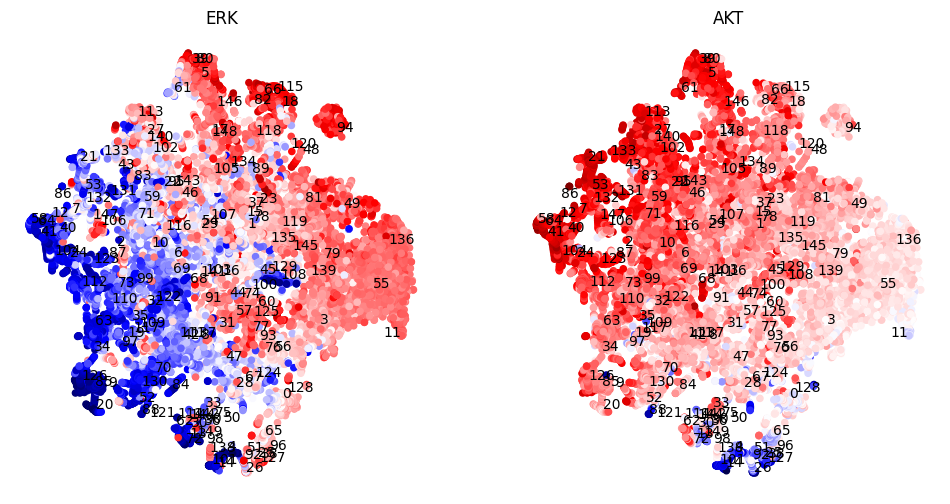

In [426]:
#plot umap of the embedding space
fig,ax=plt.subplots(1,2,figsize=(12,6))

ax[0].scatter(x_umap[:,0],x_umap[:,1],s=20,c=corrc_erk_traj,cmap=plt.cm.seismic)
ax[0].set_title('ERK')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    ax[0].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax[0].axis('off')

ax[1].scatter(x_umap[:,0],x_umap[:,1],s=20,c=corrc_akt_traj,cmap=plt.cm.seismic)
ax[1].set_title('AKT')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    ax[1].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax[1].axis('off')

plt.savefig(f'{date}/dMAP_wclusters_{figid}.png')

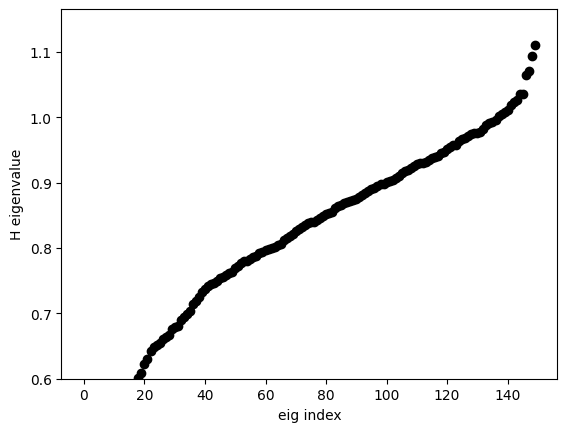

In [117]:
#Markov state model
centers_minima=clusters.clustercenters.copy()
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
graph = csr_matrix(P>0.)
n_components, labels = connected_components(csgraph=graph, directed=False, return_labels=True)
unique, counts = np.unique(labels, return_counts=True)
icc=unique[np.argmax(counts)]
indcc=np.where(labels==icc)[0]
centers_minima=centers_minima[indcc,:];stateCenters=centers_minima
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
n_clusters=indcc.size

H=.5*(P+np.transpose(P))+.5j*(P-np.transpose(P))
w,v=np.linalg.eig(H)
w=np.real(w)
indsort=np.argsort(w)
w=w[indsort]
v=v[:,indsort]

plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
plt.ylim(.6,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.pause(.1)

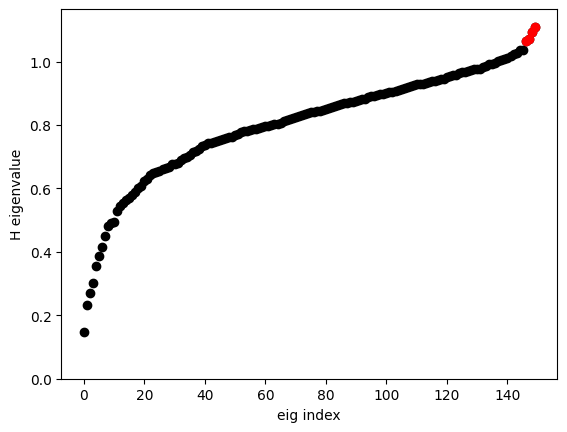

In [118]:
ncomp=4 #number of eigencomponents to keep
vr=np.multiply(w[-ncomp:],np.real(v[:,-ncomp:]))
vi=np.multiply(w[-ncomp:],np.imag(v[:,-ncomp:]))
vkin=np.append(vr,vi,axis=1)
va=np.abs(v[:,-ncomp:])
vkin=np.append(vr,vi,axis=1)
vth=np.arctan2(vr,vi)
plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
#plt.plot(dense_range,wdense,'k-',label='spline')
plt.plot(np.arange(n_clusters)[-ncomp:],w[-ncomp:],'ro')
plt.ylim(0,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.savefig(f'{date}/eigenvalues_{figid}.png')
plt.pause(.1)

In [119]:
get_cluster_embedding=False
if get_cluster_embedding:
    reducer=umap.UMAP(n_components=2) #n_neighbors=int(n_clusters),min_dist=0.1, n_components=2, metric='euclidean')
    #reducer=sklearn.manifold.TSNE(n_components=2)
    trans = reducer.fit(vkin)
    x_clusters=trans.embedding_
    np.save(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy',x_clusters)
else:
    x_clusters=np.load(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy')

ind_clusters=clusters_minima.assign(x)
x_clusters_all=x_clusters[ind_clusters,:]

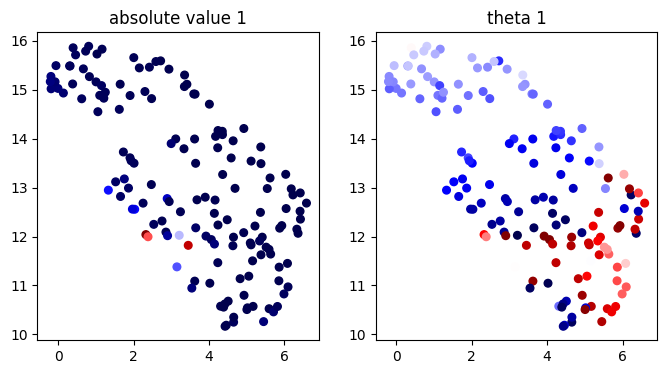

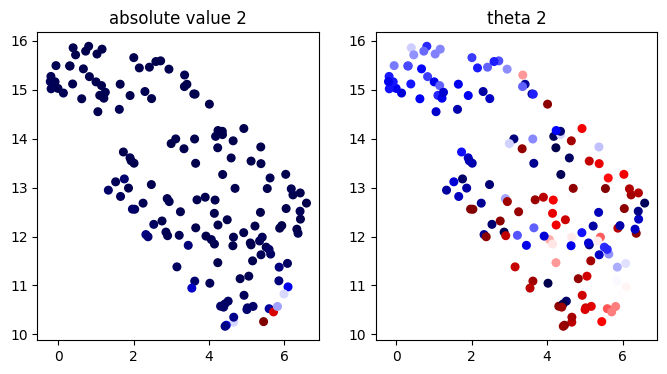

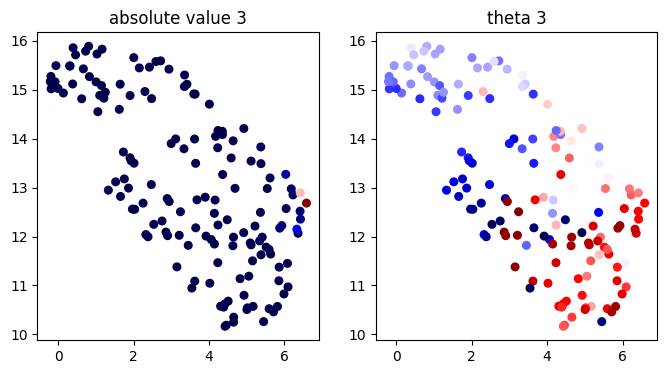

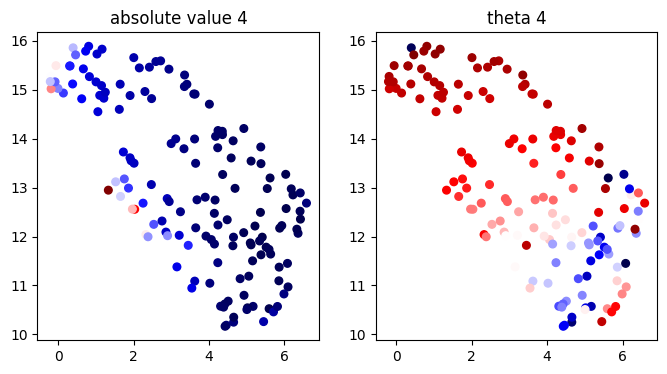

In [463]:
plt.close('all')
for icomp in range(ncomp-1,0-1,-1): #range(ncomp):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=va[:,icomp],cmap=plt.cm.seismic)
    plt.title('absolute value '+str(ncomp-icomp))
    plt.subplot(1,2,2);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=vth[:,icomp],cmap=plt.cm.seismic)
    plt.title('theta '+str(ncomp-icomp))
    plt.savefig(date+'/componentrth_'+str(ncomp-icomp)+'_H_nc'+str(n_clusters)+'_ncomp'+str(ncomp)+'_'+figid+'.png')

In [131]:
dx_clusters=np.zeros((nf,n_clusters,2))
MtSet=[None]*nf
for i in range(nf):
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix(x0,x1,clusters_minima)
    MtSet[i]=Mt.copy()
    dxmatrix=np.zeros((n_clusters,n_clusters,2))
    for ii in range(n_clusters):
        for jj in range(n_clusters):
            dxmatrix[ii,jj]=(x_clusters[jj,:]-x_clusters[ii,:])*Mt[ii,jj]
    dx_clusters[i,:,:]=np.sum(dxmatrix,axis=1)

dx_clusters_smooth=np.zeros_like(dx_clusters)
knn=20
for i in range(nf):
    for iclust in range(n_clusters):
        xc=np.array([clusters_minima.clustercenters[iclust,:]])
        dmatr=utilities.get_dmat(clusters_minima.clustercenters,xc) #get closest cells to cluster center
        indr=np.argsort(dmatr[:,0])
        indr=indr[0:knn]
        dx_clusters_smooth[i,iclust,:]=np.mean(dx_clusters[i,indr,:],axis=0)

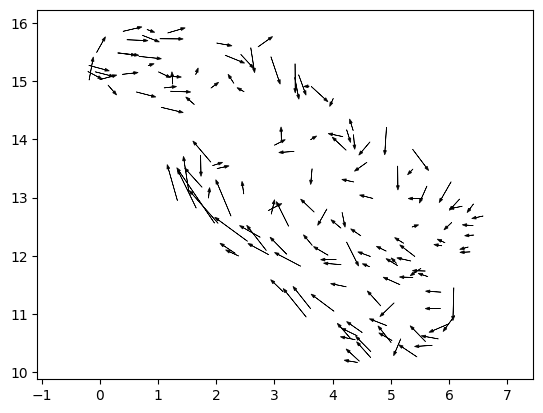

In [132]:
dxsav=np.mean(dx_clusters_smooth,axis=0)
ascale=4.0
ax=plt.gca()
for ic in range(n_clusters):
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.05,linewidth=.5,color='black',alpha=1.0)

plt.axis('equal')
plt.savefig(date+'/dx_clusters_'+figid+'.png')
plt.savefig(date+'/dx_clusters_'+figid+'.pdf')
plt.pause(.1)

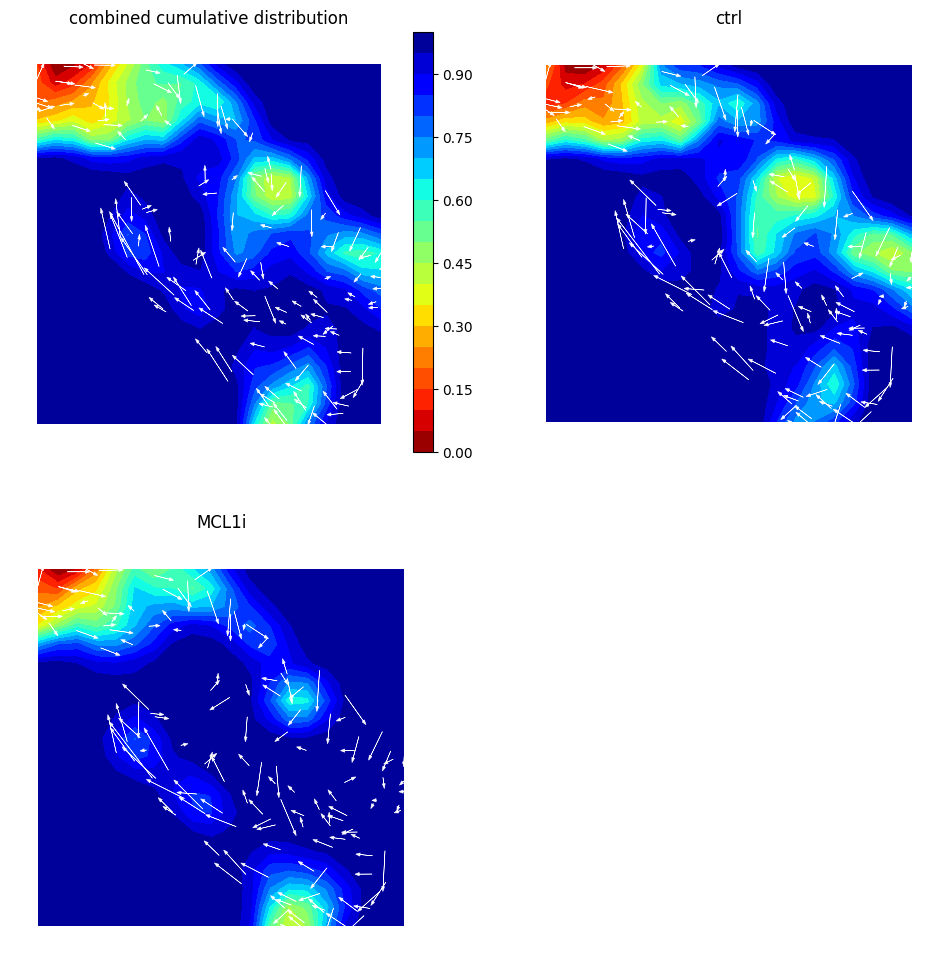

In [133]:
plt.close('all')
nbins=20
fl=100
fu=192 #frames for time window
sml=1
nplots=int(np.ceil(np.sqrt(nf+1)))
plt.figure(figsize=(12,12))
indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
probSet=[None]*nf
plt.subplot(nplots,nplots,1)
prob1,xedges1,yedges1=np.histogram2d(x_clusters_all[indstw,0],x_clusters_all[indstw,1],bins=nbins,density=True)
prob1=scipy.ndimage.gaussian_filter(prob1,sigma=sml)
prob1c=utilities.get_cdist2d(prob1)
xx,yy=np.meshgrid(.5*xedges1[1:]+.5*xedges1[0:-1],.5*yedges1[1:]+.5*yedges1[0:-1])
levels=np.linspace(0,1,21)
cs=plt.contourf(xx,yy,prob1c.T,levels=levels,cmap=plt.cm.jet_r)
cbar=utilities.colorbar(cs)
#cbar.set_label('cumulative probability')
plt.title('combined cumulative distribution')
plt.axis('off')
for ic in range(n_clusters):
    ax=plt.gca()
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.05,linewidth=.4,color='white',alpha=1.0)
    
for imf in range(nf):
    tm=tmSet[imf]
    indstm=inds_conditions[imf]
    indstwm=np.intersect1d(indstm,indstw)
    prob,xedges2,yedges2=np.histogram2d(x_clusters_all[indstwm,0],x_clusters_all[indstwm,1],bins=[xedges1,yedges1],density=True)
    #prob=prob/np.sum(prob)
    prob=scipy.ndimage.gaussian_filter(prob,sigma=sml)
    probc=utilities.get_cdist2d(prob)
    probSet[imf]=prob.copy()
    plt.subplot(nplots,nplots,imf+2)
    #levels=np.linspace(0,np.max(prob),100)
    cs=plt.contourf(xx,yy,probc.T,levels=levels,cmap=plt.cm.jet_r,extend='both')
    dxf=dx_clusters_smooth[i,:,:]
    ax=plt.gca()
    for ic in range(n_clusters):
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxf[ic,0],ascale*dxf[ic,1],head_width=.05,linewidth=.4,color='white',alpha=1.0)
    plt.title(tmSet[imf])
    cs.cmap.set_over('darkred')
    plt.axis('off')

plt.savefig(date+'/probflows_'+figid+'.png')

In [134]:
ntraj=x.shape[0]
erk_akt_crosscorr=np.zeros(ntraj)
for i in range(ntraj):
    erk_akt_crosscorr[i]=np.corrcoef(corrc_erk_full_traj[i,:],corrc_akt_full_traj[i,:])[0,1]

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


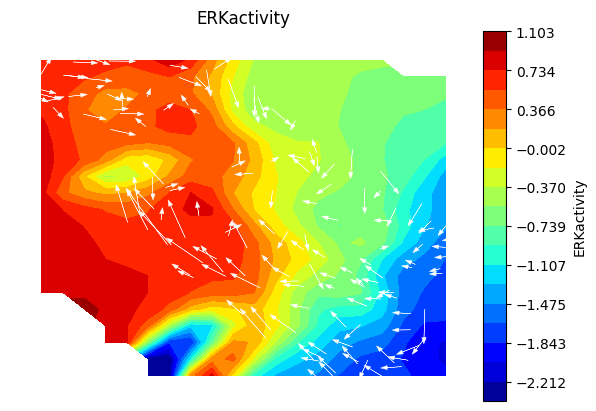

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


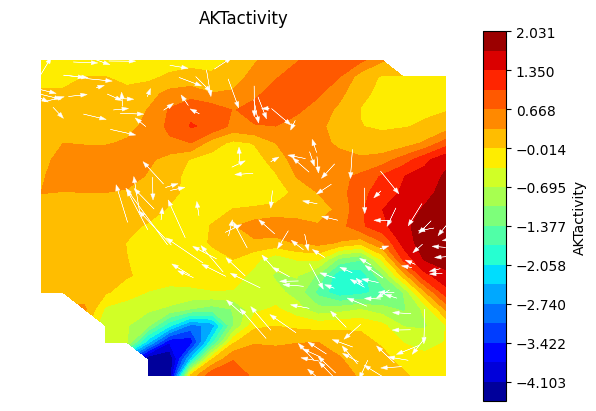

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


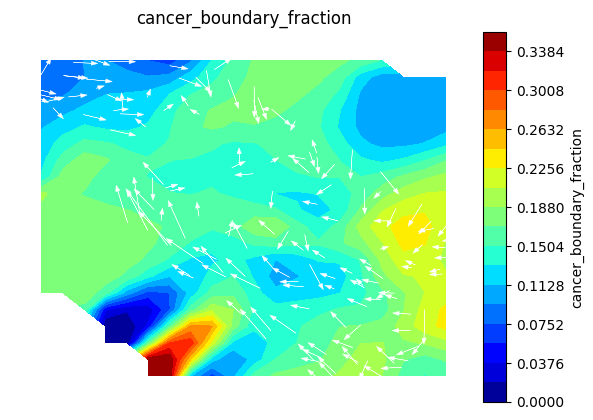

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


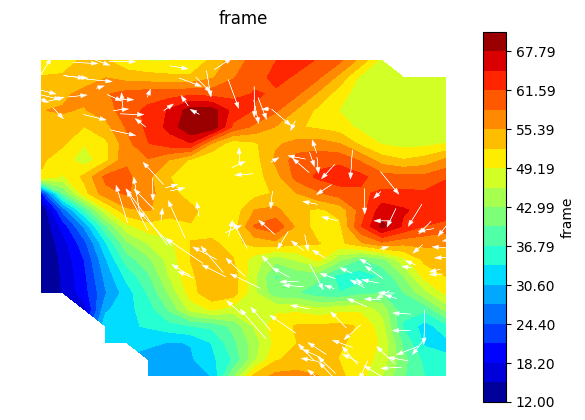

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


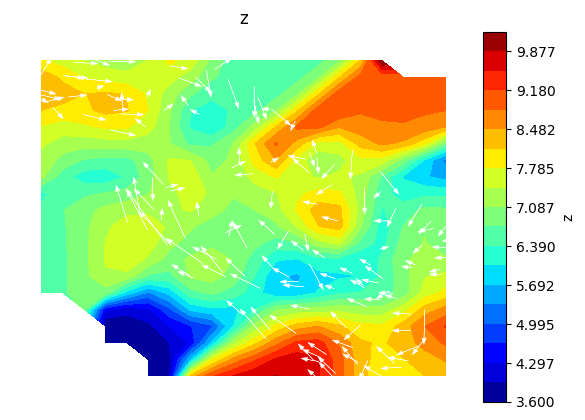

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


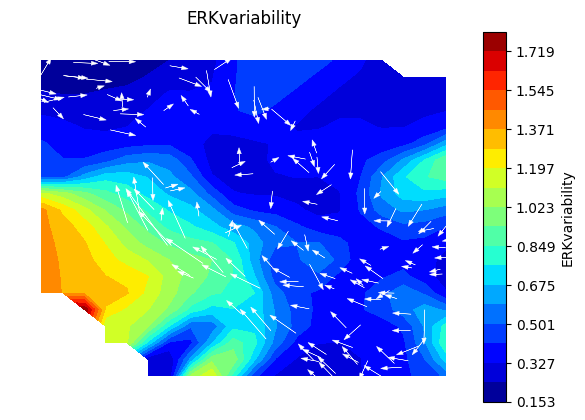

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


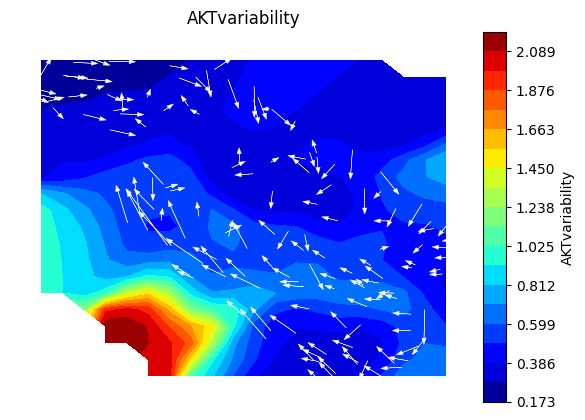

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


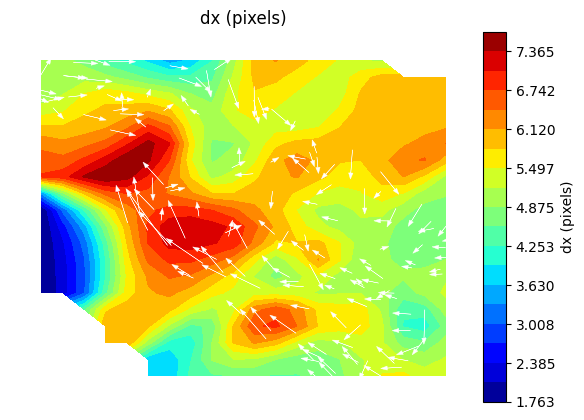

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


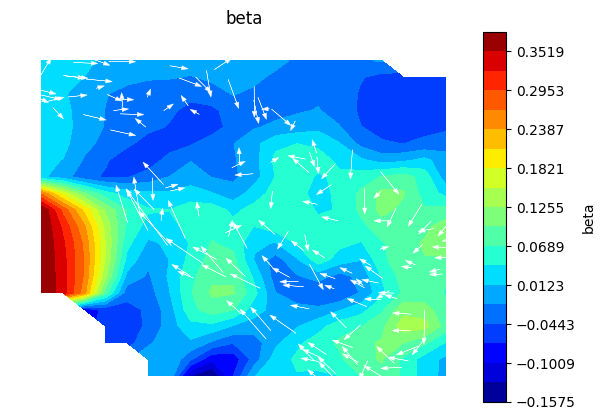

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


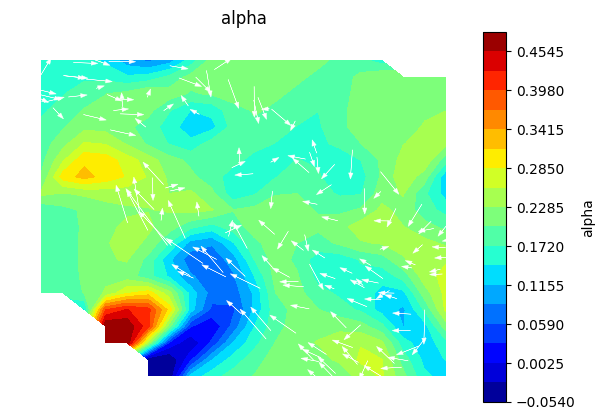

/tmp/ipykernel_22489/1031403503.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


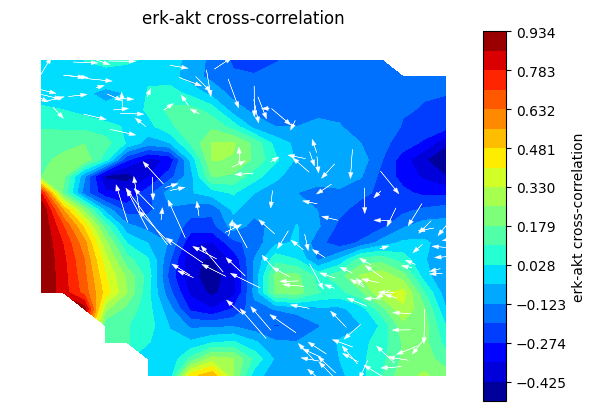

In [468]:
corrc_erk_var_traj=np.std(corrc_erk_full_traj,axis=1)
corrc_akt_var_traj=np.std(corrc_akt_full_traj,axis=1)
#vsetList=[corrc_traj,cb_ratio_traj-cbc_ratio_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_var_traj,dx_traj]
#captionset=['ERKactivity','normal_boundary_fraction','cancer_boundary_fraction','frame','z','ERKvariability','dx (pixels)']
vsetList=[corrc_erk_traj,corrc_akt_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,corrc_akt_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','cancer_boundary_fraction','frame','z','ERKvariability','AKTvariability','dx (pixels)','beta','alpha','erk-akt cross-correlation']
#vset=cb_ratio_traj
#vset=cc_ratio_traj
#vset=Xpcat[:,-3]
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
    plt.figure()
    #plt.subplot(4,4,1)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx,yy=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels)
    for ic in range(n_clusters):
        ax=plt.gca()
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.07,linewidth=.3,color='white',alpha=1.0)
    cs.cmap.set_over('darkred')
    cs.cmap.set_under('darkblue')
    cbar=utilities.colorbar(cs)
    cbar.set_label(captionset[iv])
    #cbar.set_label('cell-cell boundary fraction')
    #cbar.set_label('speed')
    #cbar.set_label('beta')
    plt.title(captionset[iv])
    plt.axis('off')
    plt.savefig(date+'/'+captionset[iv]+'_wflows_comb_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_wflows_comb_'+figid+'.pdf')
    plt.pause(.4)

[0.01333333 0.98666667]
2 states initial, 1 states final
[0.01333333 0.01333333 0.97333333]
3 states initial, 1 states final
[0.01333333 0.01333333 0.01333333 0.96      ]
4 states initial, 1 states final
[0.01333333 0.01333333 0.01333333 0.25333333 0.70666667]
5 states initial, 2 states final
building likelihood model for ctrl
building likelihood model for MCL1i
2 states
[18.02643675 19.73946223]


/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


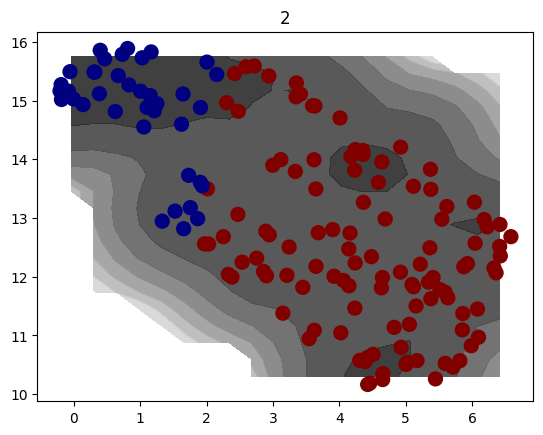

[0.01333333 0.01333333 0.01333333 0.06666667 0.2        0.69333333]
6 states initial, 3 states final
building likelihood model for ctrl
building likelihood model for MCL1i
3 states
[20.85136961 25.37810512]


/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


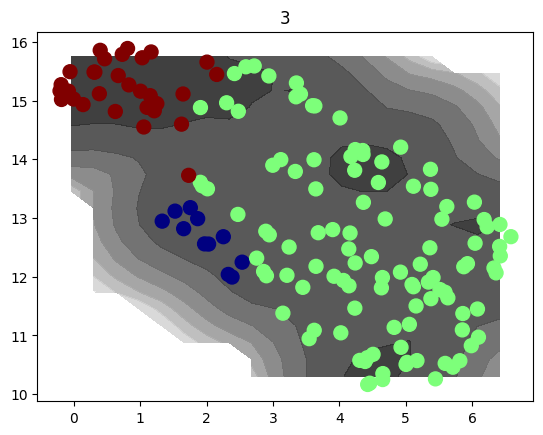

[0.00666667 0.00666667 0.01333333 0.01333333 0.04666667 0.2
 0.71333333]
7 states initial, 3 states final
[0.00666667 0.00666667 0.00666667 0.01333333 0.01333333 0.04666667
 0.2        0.70666667]
8 states initial, 3 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.02
 0.04       0.18666667 0.71333333]
9 states initial, 3 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.02       0.04666667 0.2        0.69333333]
10 states initial, 3 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.02       0.08       0.19333333 0.66      ]
11 states initial, 3 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.02       0.08       0.19333333 0.65333333]
12 states initial, 3 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.02       0.08       0.19333333
 0.64666667]
13 states initial, 3

/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


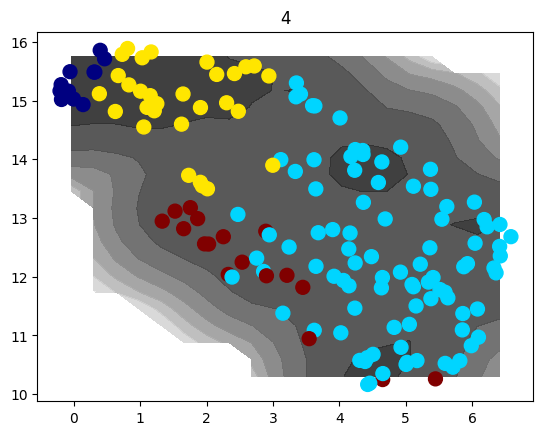

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.02
 0.06       0.07333333 0.2        0.56666667]
16 states initial, 4 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333
 0.02       0.06       0.07333333 0.2        0.56      ]
17 states initial, 4 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.01333333 0.02       0.06       0.07333333 0.2        0.55333333]
18 states initial, 4 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.01333333 0.02       0.03333333 0.04666667 0.07333333 0.2
 0.53333333]
19 states initial, 5 states final
building likelihood model for ctrl
building likelihood model for MCL1i
5 states
[37.940083

/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


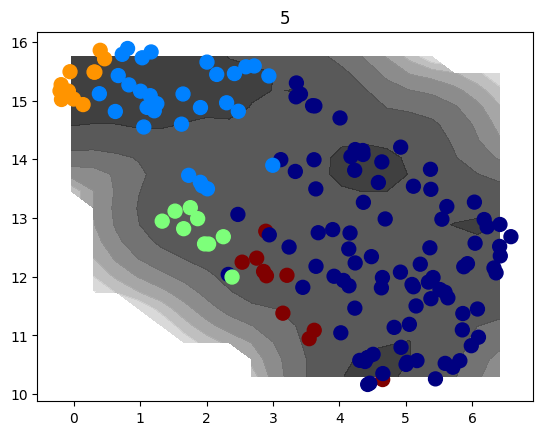

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.01333333 0.02       0.03333333 0.04666667 0.04666667 0.06666667
 0.17333333 0.52      ]
20 states initial, 6 states final
building likelihood model for ctrl
building likelihood model for MCL1i
6 states
[50.62364094 48.61592331]


/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


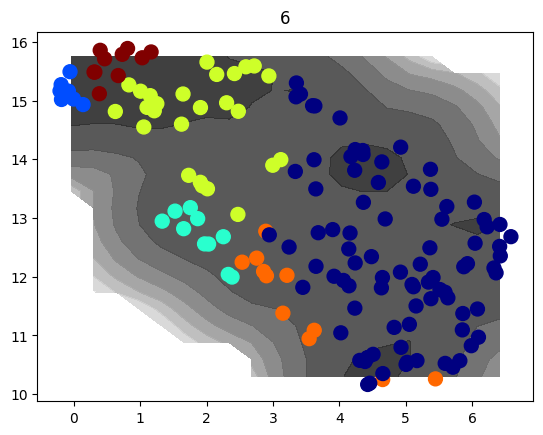

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.01333333 0.01333333 0.02666667 0.04666667 0.05333333
 0.06666667 0.19333333 0.5       ]
21 states initial, 5 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.01333333 0.01333333 0.02666667 0.04666667 0.04666667
 0.05333333 0.06666667 0.17333333 0.47333333]
22 states initial, 6 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.01333333 0.02666667 0.03333333
 0.04       0.07333333 0.08       0.17333333 0.46      ]
23 states initial, 6 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 

/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


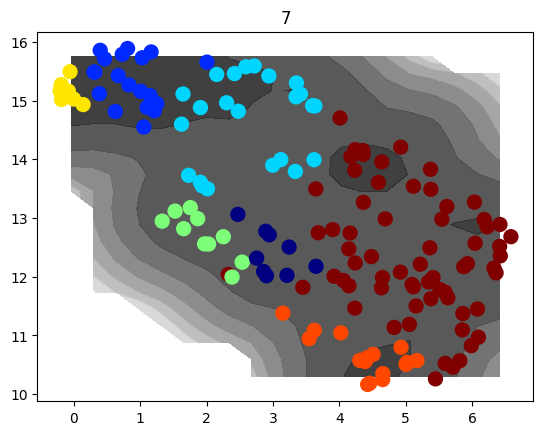

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333 0.02666667
 0.02666667 0.04       0.09333333 0.11333333 0.15333333 0.38      ]
30 states initial, 5 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333 0.02
 0.02666667 0.02666667 0.04666667 0.08       0.12       0.12666667
 0.38666667]
31 states initial, 5 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.01333333 0.013333

/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


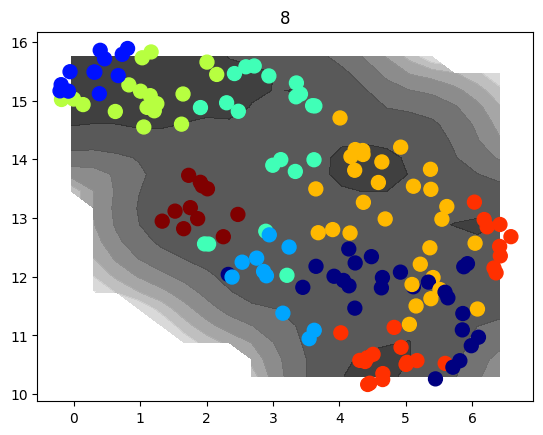

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333
 0.01333333 0.02       0.02       0.02666667 0.02666667 0.04
 0.04       0.04666667 0.06       0.08       0.1        0.1
 0.25333333]
37 states initial, 8 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.01333333 0.01333333 0.02       0.02       0.02666667 0.03333333
 0.04       0.04       0.04666667 0.06       0.06666667 0.07333333
 0.18666667 0.2       ]
38 states initial, 9 states final
building likelihood model for ctrl
building likelihood model for MCL1i
9 states
[101.67524687  99.803506

/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


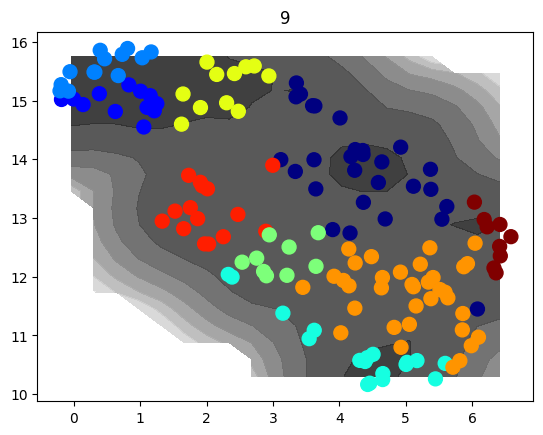

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333
 0.01333333 0.01333333 0.02       0.02       0.02       0.02666667
 0.02666667 0.03333333 0.04       0.04666667 0.06       0.06666667
 0.07333333 0.16       0.21333333]
39 states initial, 8 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.01333333 0.01333333 0.01333333 0.01333333 0.02666667 0.02666667
 0.03333333 0.03333333 0.03333333 0.03333333 0.05333333 0.05333333
 0.08666667 0.08666667 0.10666667 0.21333333]
40 states initial, 10 states final
building likelihood model for ctrl
building li

/tmp/ipykernel_22489/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


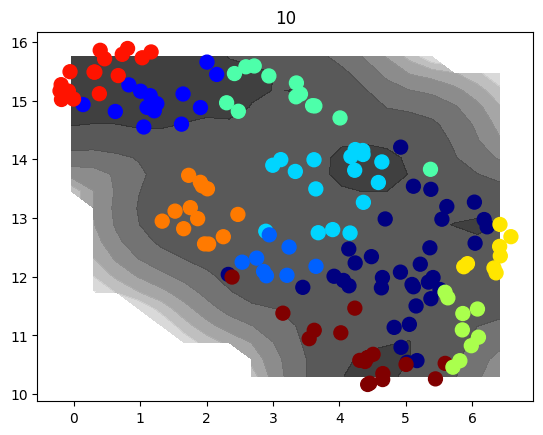

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.01333333 0.01333333 0.01333333 0.02       0.02
 0.02       0.02666667 0.02666667 0.03333333 0.04666667 0.04666667
 0.06       0.07333333 0.07333333 0.13333333 0.21333333]
41 states initial, 8 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.01333333 0.01333333 0.01333333 0.01333333 0.02
 0.02       0.02666667 0.02666667 0.03333333 0.04       0.04666667
 0.06       0.07333333 0.07333333 0.08666667 0.13333333 0.14      ]
42 states initial, 9 states final
[0.00666667 0.0

KeyboardInterrupt: 

In [469]:
plt.close('all')
plt.clf()
nstateSet=[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,20,22,24,28,30] #,30,40]
nS=len(nstateSet)
scoreSet_states=[None]*nS
nstates_initial=nstateSet[0]
pcut_final=.03
indc_x0set=clusters_minima.assign(x0set);indc_x1set=clusters_minima.assign(x1set)
for istate in range(len(nstateSet)):
    MtSet_test=[None]*nf
    nstates=nstateSet[istate]
    scoreSet=np.zeros(nf)
    #clusters_v = KMeans(n_clusters=nstates,init='k-means++',n_init=1000,max_iter=1000)
    #clusters_v.fit(vkin)
    #states=clusters_v.labels_
    states,nstates_initial=model.get_kineticstates(vkin,nstates,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=True,cluster_ninit=100)
    for imf in range(nf):
        print('building likelihood model for '+tmSet[imf])
        indmodels=np.where(inds_tmSet_models==imf)[0]
        indmodels=np.intersect1d(indmodels,indgood_models)
        indstm=np.array([]).astype(int)
        for i in indmodels: #[:-1]:
            indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
        MtSet_test[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=states)
        scoreSet[imf]=model.get_kscore(MtSet_test[imf])
        #scoreSet[imf]=model.get_path_entropy_2point(states[indc_x0set],states[indc_x1set],MtSet_test[imf])
    print(str(nstates)+' states')
    print(scoreSet)
    nstates_initial=nstates_initial+1
    #np.savetxt(f'{date}_scoreSet_{figid}_nS{nstates}.dat',scoreSet)
    scoreSet_states[istate]=scoreSet
    plt.clf()
    plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)
    plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=states,cmap=plt.cm.jet)
    plt.title(str(nstates))
    plt.pause(2)
    #plt.savefig(f'{date}/clustertest_{figid}_{nstates}.png')

/tmp/ipykernel_22489/298439866.py:15: RuntimeWarning: Mean of empty slice
  plt.plot(nstateSet,np.nanmean(scoreSet_statearray,axis=1),'o--',color='black',linewidth=2)


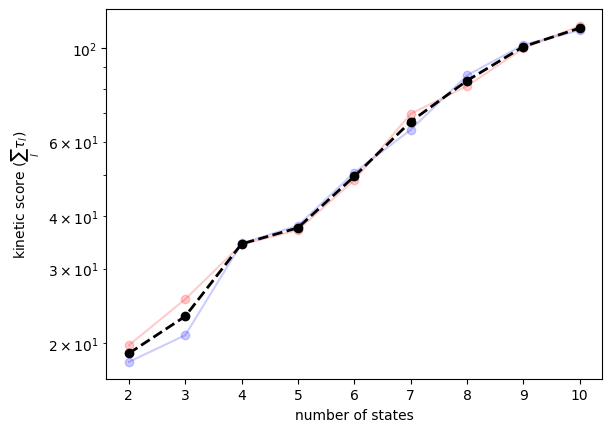

<Figure size 640x480 with 0 Axes>

In [470]:
scoreSet_statearray=np.zeros((nS,nf))
for istate in range(len(nstateSet)):
    try:
        scoreSet_statearray[istate,:]=scoreSet_states[istate]
    except:
        pass

plt.close('all')
#colorSet=['red','gold','green','blue','black','red','gold','green','blue','black','brown','orange','purple']
colorSet=['blue','red','gold','black','purple','green','orange','brown','cyan','lightgreen','magenta','darkblue','darkred','darkgray','darkgreen']
plt.clf()
for imf in range(nf):
    plt.plot(nstateSet,scoreSet_statearray[:,imf],'o-',color=colorSet[imf],label=tmSet[imf],alpha=.2)

plt.plot(nstateSet,np.nanmean(scoreSet_statearray,axis=1),'o--',color='black',linewidth=2)
plt.yscale('log')
#plt.ylabel(r'path entropy $-\langle log(p_{ij})\rangle$')
plt.ylabel(r'kinetic score ($\sum_l \tau_l$)')
plt.xlabel('number of states');plt.pause(.1)
plt.savefig(f'{date}/scoreset_{figid}.png')

In [ ]:
scoreSet

In [123]:
get_kstates=False
nstates_final=11
#nstates_final=13 #for production
pcut_final=.03 #for prediction
#pcut_final=.02 #for production
nstates_initial=nstates_final
stateCenters=x_clusters
if get_kstates:
    stateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=100)
    objFile='stateSet_'+figid+'_nS'+str(nstates_final)+'.obj'
    objFileHandler=open(objFile,'wb')
    states_object=[clusters_minima,stateSet]
    pickle.dump(states_object,objFileHandler,protocol=4)
    objFileHandler.close()
    #stateSet=get_kineticstates(wctm,nstates_final,P=MtSet[4],clusters_minima=clusters_minima,pcut_final=.01,ncomp=ncomp) #treatment specific
else:
    objFile='stateSet_'+figid+'_nS'+str(nstates_final)+'.obj'
    objFileHandler=open(objFile,'rb')
    states_object=pickle.load(objFileHandler)
    clusters_minima=states_object[0]
    stateSet=states_object[1]
    objFileHandler.close()

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,2))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)



In [125]:
#state_order=np.argsort(state_centers_minima[:,0])
#state_order=np.array([9,16,15,13,10,4,6,7,3,14,12,11,1,0,2,5,8]).astype(int)
#state_order=np.array([0,1,2,7,18,17,15,4,11,8,3,14,16,12,13,5,6,9,10])
#state_order=np.array([0,2,1,7,18,17,15,8,11,4,3,16,14,5,12,13,6,9,10])
state_order=np.array([4,5,7,8,9,6,3,2,1,0]) #19jun24
stateSet_ordered=np.ones_like(stateSet)*-1
for istate in range(nstates):
    stateSet_ordered[stateSet==state_order[istate]]=istate

stateSet=stateSet_ordered

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,2))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)

inds_states=[None]*n_states
for i in range(n_states):
    indstate=np.where(stateSet[ind_clusters]==i)[0]
    inds_states[i]=indstate

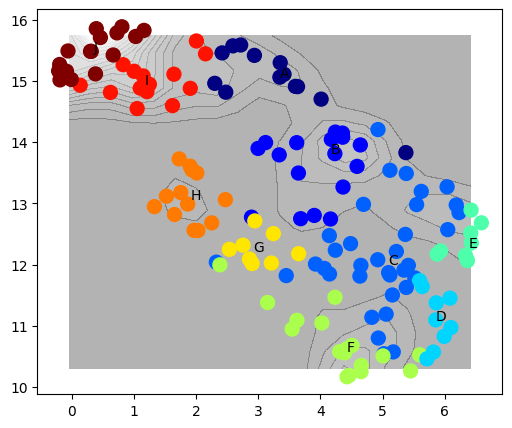

In [135]:
import string
nbins=prob1.shape[0]
state_labels=np.array(list(string.ascii_uppercase))[0:nstates]
plt.close('all');plt.figure(figsize=(6,5))
plt.clf()
pts=np.array([xx.flatten(),yy.flatten()]).T
#indpts=clusters_minima.assign(pts)
#states=stateSet[indpts]
#states=states[prob1.flatten()>np.min(prob1[prob1>0])]
#pts=pts[prob1.flatten()>np.min(prob1[prob1>0]),:]
plt.contourf(xx,yy,prob1.T,cmap=plt.cm.gray,levels=20,alpha=.3)
#plt.scatter(tateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=500)ts[:,0],pts[:,1],s=10,c=states,cmap=plt.cm.jet,marker='.',alpha=0.5)
plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=stateSet,cmap=plt.cm.jet)
#for ic in range(n_clusters):
#    ax=plt.gca()
#    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],dxsav[ic,0],dxsav[ic,1],head_width=.1,linewidth=.2,color='white',alpha=1.0)

for istate in range(nstates):
    plt.text(state_centers_minima[istate,0],state_centers_minima[istate,1],str(state_labels[istate]))


#plt.savefig(date+'/kineticstates_'+figid+'_nS_'+str(nstates)+'.png')
#plt.savefig(date+'/kineticstates_'+figid+'_nS_'+str(nstates)+'.pdf')
plt.pause(.1)

In [147]:
def show_cell_activation(self,icell,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=False,show_neighbor_signals=False):
    #plt.figure(figsize=(6,6))
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
        if rep_img_channel is None:
            rep_img_channel=self.rep_channel
        if nuc_img_channel is None:
            nuc_img_channel=self.nuc_channel
        if bf_img_channel is None:
            bf_img_channel=self.bf_channel
    if True: #try:
        imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0],boundary_expansion=[1,viewsize,viewsize])
        imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
        if not projection:
            mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
            hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
            islice=mslices[hslice]
            img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
            #img_rep=imprep.znorm(np.max(imgc[...,rep_img_channel],axis=0))
            img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
            #img_nuc=imprep.znorm(np.max(imgc[...,nuc_img_channel],axis=0))
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
            #img_bf=imprep.znorm(np.max(img_bf,axis=0))
            msk_cyto=mskc[islice,:,:,cyto_msk_channel]
            #msk_cyto=np.max(mskc[...,cyto_msk_channel],axis=0)
            msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
        else:
            img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
            img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
            msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
            msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
        if nuchigh is None:
            nuclow=np.percentile(img_nuc,5);nuchigh=np.percentile(img_nuc,95)
        #img_nuc[msk_nuc==0]=-1000.
        #img_rep[msk_cyto==0]=-1000.1
        img_bf=np.abs(img_bf)
        #img_bf[np.logical_not(msk_f)]=0
        img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
        img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
        img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
        img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
        img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
        if rephigh is None:
            replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
        if bfhigh is None:
            bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
        #img_bf=scipy.ndimage.gaussian_filter(img_bf,sigma)
        msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
        msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
        plt.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
        #csr=plt.contour(img_rep,levels=np.linspace(rep_min,rep_max,201),cmap=plt.cm.binary,extend='both')
        #csr.cmap.set_over('black')
        #csr.cmap.set_under('white')
        if show_neighbor_signals:
            plt.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        else:
            plt.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        #####plt.imshow(img_rep,cmap=plt.cm.YlOrBr,clim=(replow,3*rephigh),alpha=.3)
        #plt.contour(img_rep,levels=np.linspace(0,10,11),cmap=plt.cm.inferno,alpha=.3)
        csn=plt.contour(img_nuc,levels=np.linspace(nuclow,nuchigh,4),cmap=plt.cm.Reds,alpha=0.6,linewidths=1)
        #####csn=plt.contour(msk2_cyto>0,levels=np.unique(msk_cyto>0),colors='orange',linewidths=1.2,alpha=.4)
        csn=plt.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
        csn.cmap.set_over('darkred')
        csn.cmap.set_under('white')
        #cs.cmap.set_under('white')
        #plt.imshow(np.ma.masked_where(msk_f==0,np.ones_like(msk_f)),cmap=plt.cm.binary_r,clim=(0,1),alpha=0.15)
        #plt.xlim(viewsize*zoom/2-1*viewsize*zoom,viewsize*zoom/2+1*viewsize*zoom)
        #plt.ylim(viewsize*zoom/2-1*viewsize*zoom,viewsize*zoom/2+1.3*viewsize*zoom)
        #plt.text(zoom*npix/2,zoom*npix/4,r'central slice \textbf{YFP} \textcolor{red}{\textbf{Cy5}}')
        #plt.text(zoom*npix/2,zoom*npix/4,'central slice, YFP black, Cy5 red')
        plt.axis('off')
        return 0
    #except Exception as e:
    #    print(e)
    #    return 1

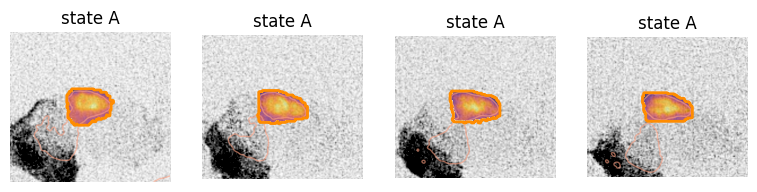

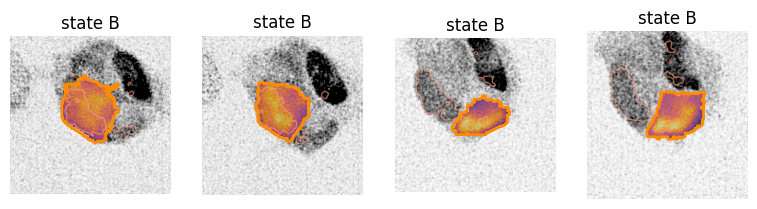

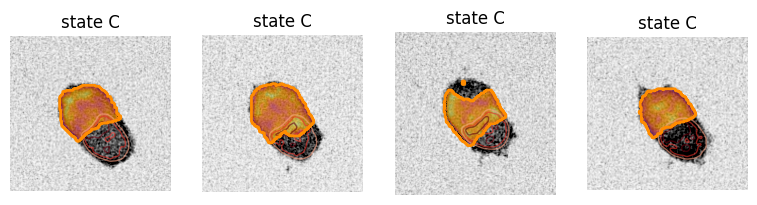

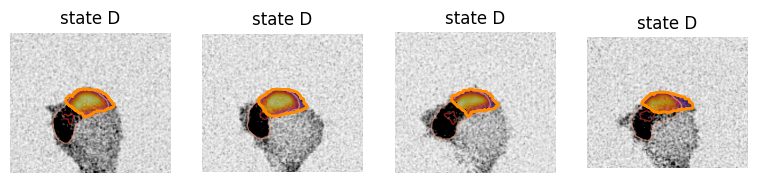

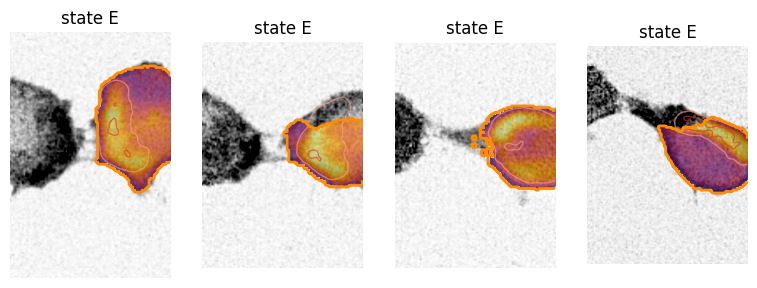

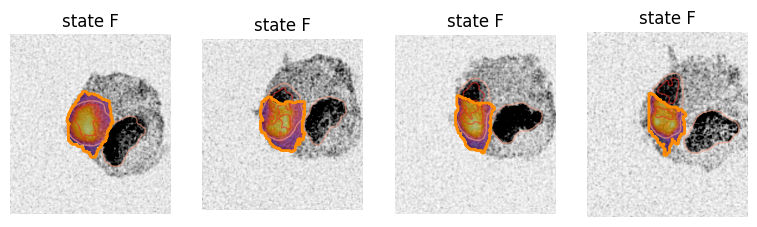

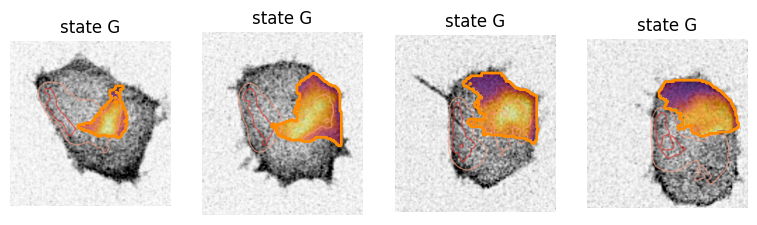

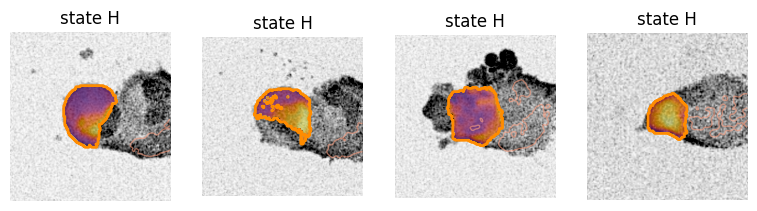

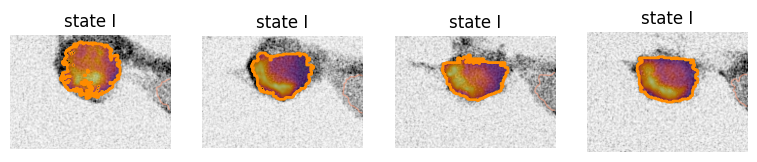

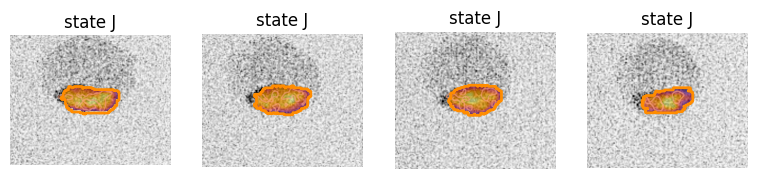

In [152]:
nrounds=1
nr=1
maxl=trajl
stordir='cellstatepics'
os.system(f'mkdir -p {date}/{stordir}')
nuclow=-1.;nuchigh=9.;replow=0.;rephigh=5.;bflow=0.;bfhigh=5.
npics=4
for iround in range(nrounds):
    plt.close('all')
    for istate in range(nstates):
        indcells_traj=inds_states[istate]
        indmodels=indtreatment_traj[indcells_traj]
        indcells_model=cellinds1_traj[indcells_traj]
        indr=np.random.choice(indcells_model.size,nr,replace=False)
        for ic in indr: #range(indcells_traj.size):
            plt.figure(figsize=(12,4))
            model_sctm=modelSet[indmodels[ic]]
            celltraj=model_sctm.get_cell_trajectory(indcells_model[ic])
            if celltraj.size>maxl:
                celltraj=celltraj[-maxl:]
            iplot=0
            for icell in np.linspace(0,celltraj.size-1,npics).astype(int):
                indcell=celltraj[icell]
                plt.subplot(1,npics+1,iplot+1)
                show_cell_activation(model_sctm,indcell,projection=True,bf_img_channel=erk_img_channel,nuclow=nuclow,nuchigh=nuchigh,replow=replow,rephigh=rephigh,bflow=bflow,bfhigh=bfhigh)
                iplot=iplot+1
                plt.title(f'state {state_labels[istate]}')
            plt.savefig(f'{date}/{stordir}/state{state_labels[istate]}_cell{ic}_model{indmodels[ic]}_{figid}.png')
            plt.pause(.1)

In [194]:
MtSet=[None]*nf
MtSetCG=[None]*nf
for imf in range(nf):
    print('building likelihood model for '+tmSet[imf])
    indmodels=np.where(inds_tmSet_models==imf)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    indstm=np.array([]).astype(int)
    for i in indmodels: #[:-1]:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
    MtSet[imf]=model.get_transition_matrix(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima);
    MtSetCG[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=stateSet);

building likelihood model for ctrl
building likelihood model for MCL1i


In [195]:
nf=len(tmSet)
state_probs=np.zeros((nf,n_states))
nwindow=24
itimes=0
time_inds=np.arange(nwindow,modelSet[0].nt,nwindow).astype(int)
state_probs_times=np.zeros((nf,n_states,time_inds.size))
ntimes=time_inds.size
for itt in time_inds:
    fl=itt-nwindow
    fu=itt+nwindow
    indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
    for i in range(nf):
        indstm=inds_conditions[i]
        indstwm=np.intersect1d(indstm,indstw)
        x0=x[indstwm,:]
        indc0=stateSet[clusters_minima.assign(x0)]
        statesc,counts=np.unique(indc0,return_counts=True)
        state_probs[i,statesc]=counts/np.sum(counts)
    state_probs_times[:,:,itimes]=state_probs
    itimes=itimes+1

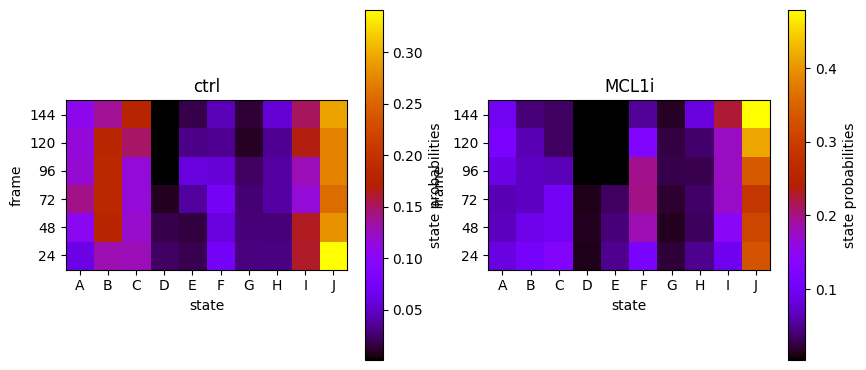

In [196]:
nplots=int(np.ceil(np.sqrt(nf)))
plt.figure(figsize=(10,10))
for i_tm in range(nf):
    plt.subplot(nplots,nplots,i_tm+1)
    plt.imshow(state_probs_times[i_tm,:,:].T,origin='lower',cmap=plt.cm.gnuplot)
    ax=plt.gca()
    ax.set_yticks(np.arange(time_inds.size))
    ax.set_xticks(np.arange(nstates))
    ax.set_xticklabels(np.array(state_labels))
    ax.set_yticklabels(time_inds)
    plt.xlabel('state');plt.ylabel('frame')
    cbar=plt.colorbar()
    cbar.set_label('state probabilities')
    plt.title(tmSet[i_tm])

plt.savefig(date+f'/stateprobs_times_{figid}_nS{n_states}.png')

In [ ]:
nstates

[Text(0, 0, 'ctrl'), Text(0, 1, 'MCL1i')]

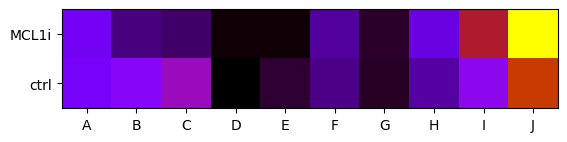

In [197]:
plt.clf()
plt.imshow(state_probs_times[:,:,-1],origin='lower',cmap=plt.cm.gnuplot)
ax=plt.gca()
ax.set_yticks(np.arange(nf))
ax.set_xticks(np.arange(nstates))
ax.set_xticklabels(np.array(state_labels))
ax.set_yticklabels(tmSet)

In [94]:
corrc_akt_var_traj

array([0.15306943, 0.16124308, 0.1727005 , ..., 0.18693786, 0.17162009,
       0.17387734])

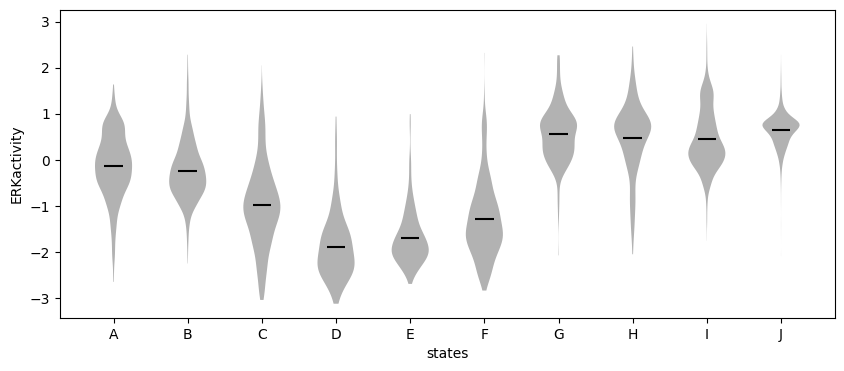

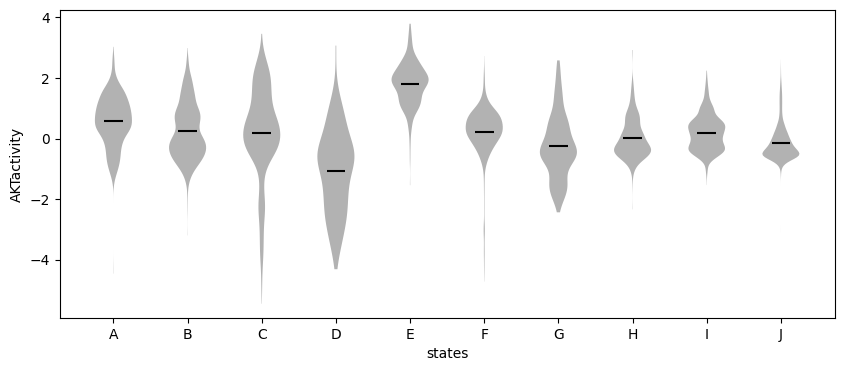

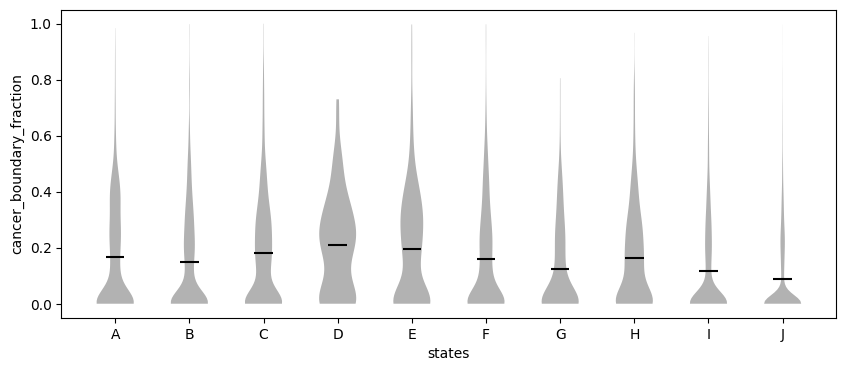

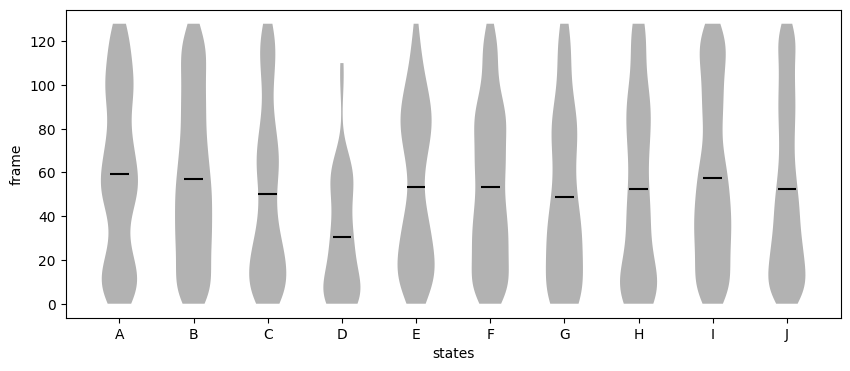

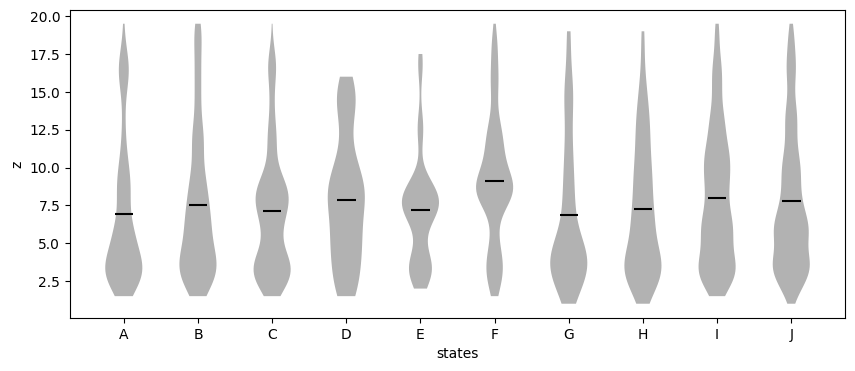

...

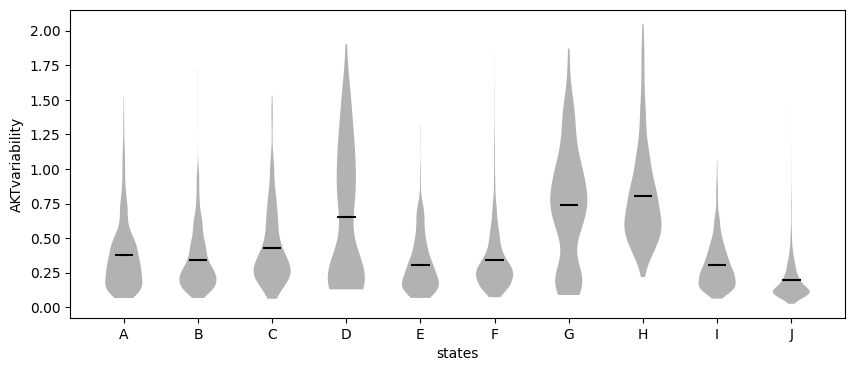

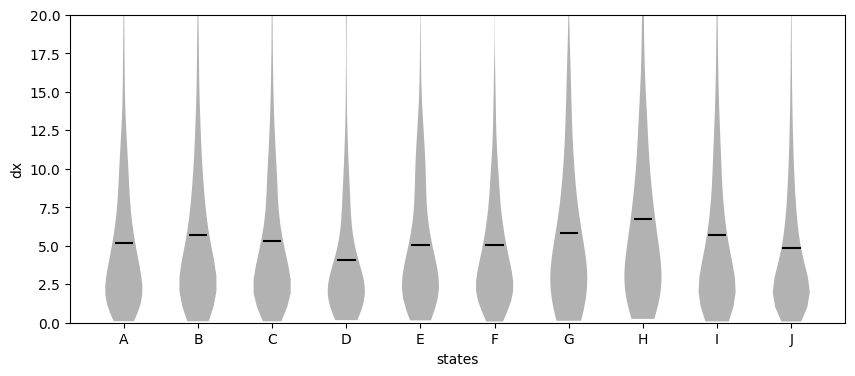

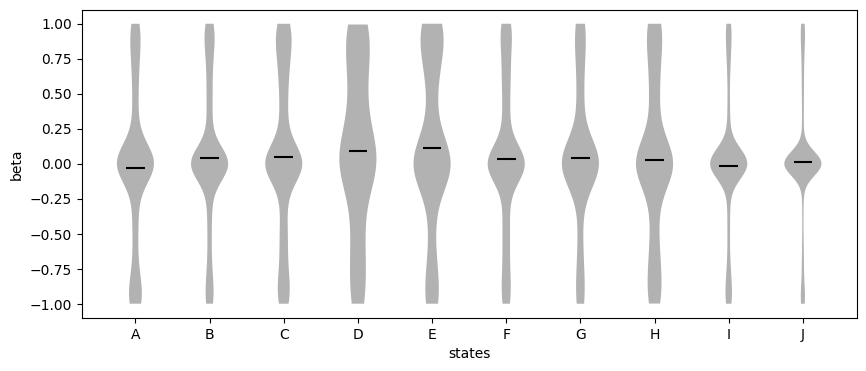

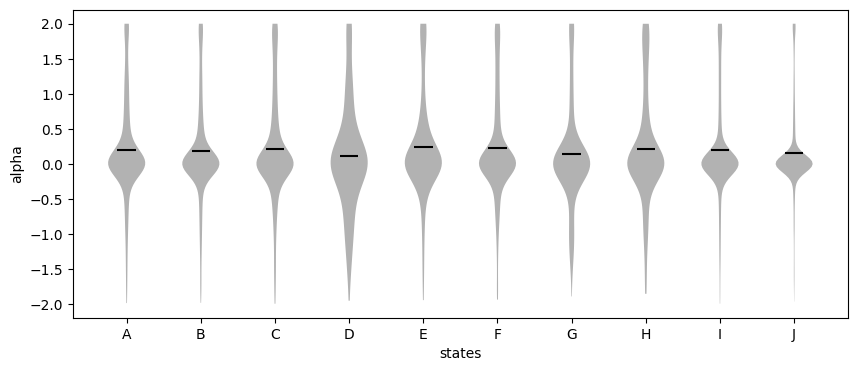

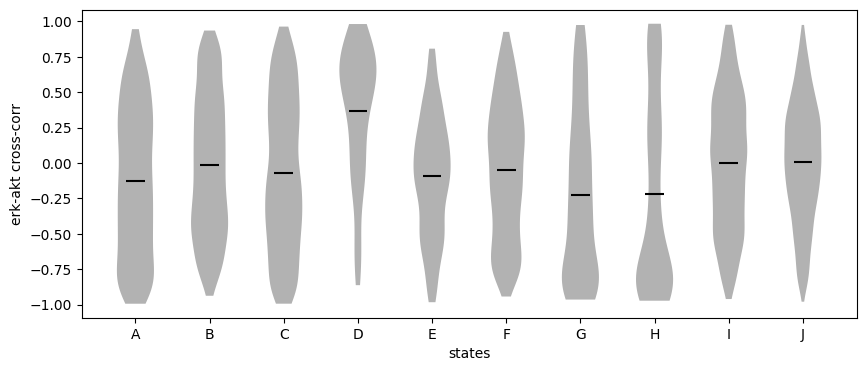

In [499]:
plt.clf()
plt.close('all')
vsetList=[corrc_erk_traj,corrc_akt_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,corrc_erk_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','cancer_boundary_fraction','frame','z','ERKvariability','AKTvariability','dx','beta','alpha','erk-akt cross-corr']
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    plt.figure(figsize=(10,4))
    ax=plt.gca()
    for i in range(n_states):
        setv=vset[inds_states[i]]
        setv=setv[np.isfinite(setv)]
        vplot=ax.violinplot(setv,positions=[i+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('black')
            #pc.set_edgecolor('black')
            #pc.set_alpha(1)
    ax.set_xticks(range(1,n_states+1))
    ax.set_xticklabels(state_labels)
    #plt.ylabel('log2(nuc/cyto cc-ratio)')
    #plt.ylabel(r'cell-cell local alignment $\langle \hat{v}_1 \cdot \hat{v}_2 \rangle$')
    #plt.ylabel('speed (z-score)')
    #plt.ylabel('nuc/cyt cc-ratio')
    plt.ylabel(captionset[iv])
    plt.xlabel('states')
    if captionset[iv]=='dx':
        plt.ylim(0,20)
    #plt.savefig(date+'/'+captionSet[iv]+'_tearplot_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_tearplot_'+figid+'.pdf')
    plt.pause(.5)


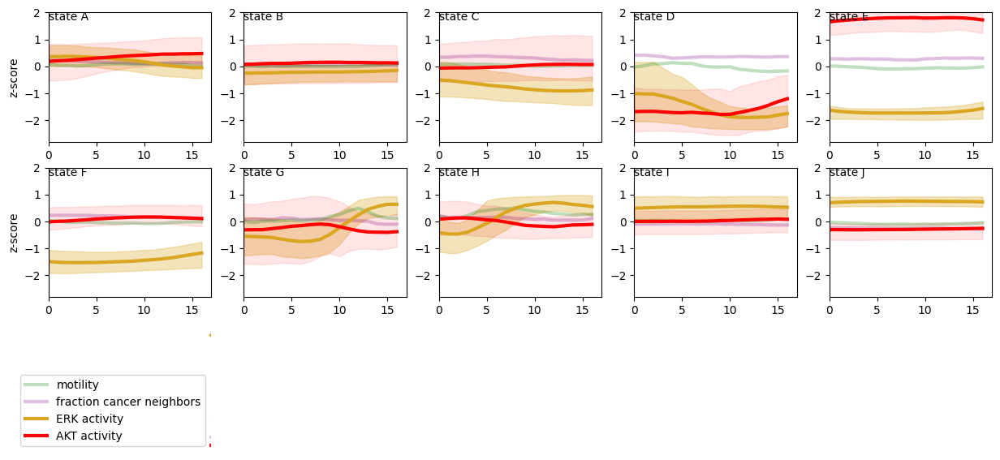

In [507]:
plt.figure(figsize=(15,12))
frames=np.arange(trajl)
#cb_ratio_full_traj=imprep.znorm(cb_ratio_full_traj-cbc_ratio_full_traj)
cbc_ratio_full_traj=imprep.znorm(cbc_ratio_full_traj)
erk_traj=imprep.znorm(corrc_erk_full_traj)
akt_traj=imprep.znorm(corrc_akt_full_traj)
dx_full_traj=imprep.znorm(dx_full_traj)
hplots=5;vplots=5;
for istate in range(nstates):
    plt.subplot(vplots,hplots,istate+1)
    ax=plt.gca()
    #plt.plot(frames,np.mean(cb_ratio_full_traj[inds_states[istate],:],axis=0),color='blue',alpha=.25,linewidth=3,label='fraction neighbors')
    #ulim=np.percentile(cb_ratio_full_traj[inds_states[istate],:],75,axis=0)
    #llim=np.percentile(cb_ratio_full_traj[inds_states[istate],:],25,axis=0)
    #ax.fill_between(frames,llim,ulim,color='blue',alpha=.3)
    plt.plot(frames,np.mean(cbc_ratio_full_traj[inds_states[istate],:],axis=0),color='purple',alpha=.25,linewidth=3,label='fraction cancer neighbors')
    ulim=np.percentile(cbc_ratio_full_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(cbc_ratio_full_traj[inds_states[istate],:],25,axis=0)
    plt.plot(frames,np.nanmean(dx_full_traj[inds_states[istate],:],axis=0),color='green',alpha=.25,linewidth=3,label='motility')
    plt.plot(frames,np.mean(erk_traj[inds_states[istate],:],axis=0),color='goldenrod',linewidth=3,label='ERK activity')
    ulim=np.percentile(erk_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(erk_traj[inds_states[istate],:],25,axis=0)
    ax.fill_between(frames,llim,ulim,color='goldenrod',alpha=.3)
    plt.plot(frames,np.mean(akt_traj[inds_states[istate],:],axis=0),color='red',linewidth=3,label='AKT activity')
    ulim=np.percentile(akt_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(akt_traj[inds_states[istate],:],25,axis=0)
    ax.fill_between(frames,llim,ulim,color='red',alpha=.1)
    plt.ylim(-2.8,2);
    plt.xlim(0,trajl)
    plt.text(0,1.7,f'state {state_labels[istate]}')
    if (istate+1)%hplots==1:
        plt.ylabel('z-score')
    if istate+1>(hplots*(hplots-1)):
        plt.xlabel('frame')
    if istate+1==nstates:
        plt.subplot(vplots,hplots,istate+2)
        plt.plot(frames,np.mean(dx_full_traj[inds_states[istate],:],axis=0),color='green',alpha=.25,linewidth=3,label='motility')
        #plt.plot(frames,np.mean(cb_ratio_full_traj[inds_states[istate],:],axis=0),color='blue',alpha=.25,linewidth=3,label='fraction neighbors')
        plt.plot(frames,np.mean(cbc_ratio_full_traj[inds_states[istate],:],axis=0),color='purple',alpha=.25,linewidth=3,label='fraction cancer neighbors')
        plt.plot(frames,np.mean(erk_traj[inds_states[istate],:],axis=0),color='goldenrod',linewidth=3,label='ERK activity')
        plt.plot(frames,np.mean(akt_traj[inds_states[istate],:],axis=0),color='red',linewidth=3,label='AKT activity')
        plt.xlim(-100,0)
        plt.legend(loc='lower right')
        plt.axis('off')

plt.savefig(date+'/signaling_neighbors_'+figid+'.png')
plt.savefig(date+'/signaling_neighbors_'+figid+'.pdf')
plt.pause(.1)

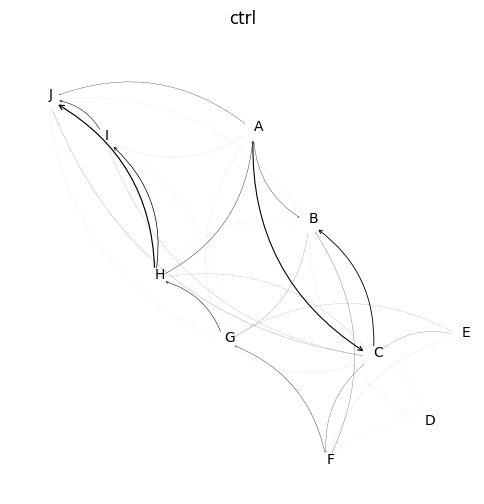

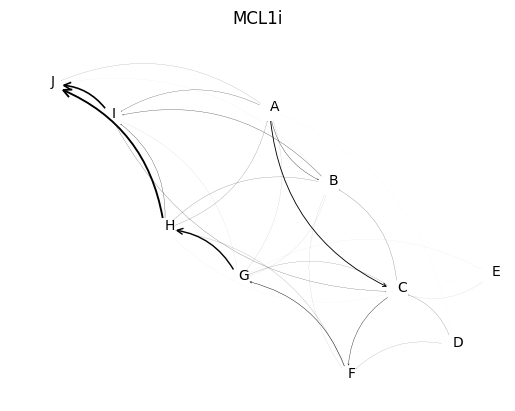

In [501]:
state_probs=np.mean(state_probs_times[:,:,-3:],axis=2)
pcut=.0001
fcut=.00001
rad=.3
mscale=2200
arrowstyle='->'
lws=200.
sh=8
state_centers=state_centers_minima
fl=0
fu=180
indstw_all=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
#MtSet=[None]*nf
plt.figure(figsize=(6,6))
for i in range(nf):
    #plt.subplot(4,4,i+2)
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix_CG(x0,x1,clusters_minima,stateSet)
    #MtSet[i]=Mt.copy()
    #Mt=MtSet[i]
    ax=plt.gca()
    for j in range(n_states):
        for k in range(n_states):
            fluxjk=state_probs[i,j]*Mt[j,k]
            fluxkj=state_probs[i,j]*Mt[k,j]
            flux=fluxjk-fluxkj
            if j<k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt') #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
            if j>k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt')
                ax.add_patch(arrow)
        plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',ma='center')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax+.5)
    plt.axis('off')
    plt.title(tmSet[i])
    plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.png')
    plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.pdf')
    plt.pause(.1)

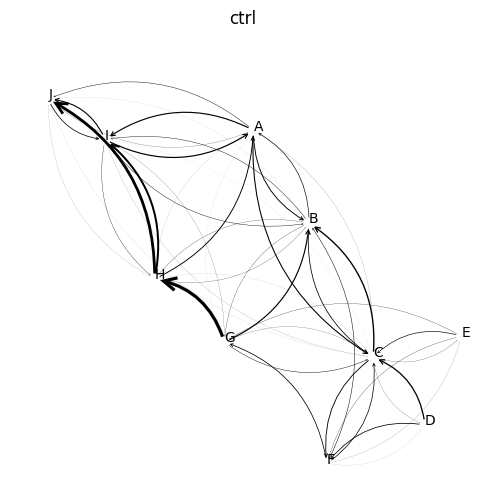

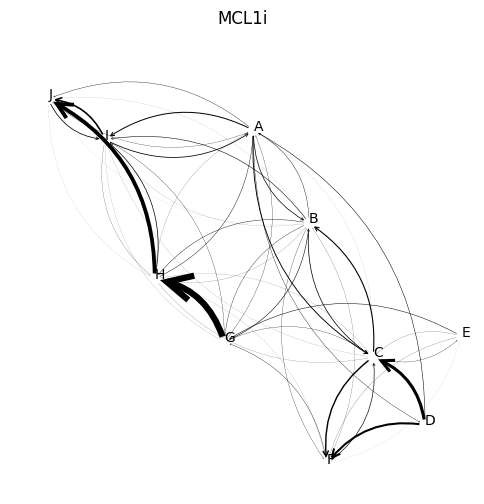

In [502]:
pcut=.001
fcut=.001
rad=.3
mscale=200
arrowstyle='->'
lws=20.
sh=4
state_centers=state_centers_minima
fl=0
fu=180
indstw_all=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
#MtSet=[None]*nf
for i in range(nf):
    plt.figure(figsize=(6,6))
    #plt.subplot(4,4,i+2)
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix_CG(x0,x1,clusters_minima,stateSet)
    #MtSet[i]=Mt.copy()
    #Mt=MtSet[i]
    ax=plt.gca()
    for j in range(n_states):
        for k in range(n_states):
            #fluxjk=state_probs[i,j]*Mt[j,k]
            fluxjk=Mt[j,k]
            #fluxkj=state_probs[i,k]*Mt[k,j]
            #flux=fluxjk-fluxkj
            flux=fluxjk
            if j<k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt') #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
            if j>k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt')
                ax.add_patch(arrow)
        plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',ma='center')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax+.5)
    plt.axis('off')
    plt.title(tmSet[i])
    plt.savefig(date+'/networktrans_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.png')
    plt.savefig(date+'/networktrans_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.pdf')
    plt.pause(.1)

/tmp/ipykernel_22489/3841394091.py:1: RuntimeWarning: divide by zero encountered in log
  plt.subplot(1,2,1);plt.imshow(-np.log(MtSetCG[0]),origin='lower');plt.subplot(1,2,2);plt.imshow(-np.log(MtSetCG[1]),origin='lower')


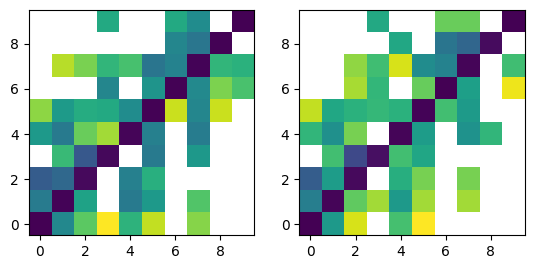

In [486]:
plt.subplot(1,2,1);plt.imshow(-np.log(MtSetCG[0]),origin='lower');plt.subplot(1,2,2);plt.imshow(-np.log(MtSetCG[1]),origin='lower')

In [457]:
print(MtSetCG[0][-1,:])
print(MtSetCG[1][-1,:])

[0.01607717 0.01607717 0.01768489 0.         0.         0.
 0.         0.         0.         0.         0.02090032 0.92926045]
[0.01217039 0.00811359 0.01014199 0.         0.         0.
 0.         0.         0.         0.         0.03853955 0.93103448]


/tmp/ipykernel_22489/1400035987.py:41: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


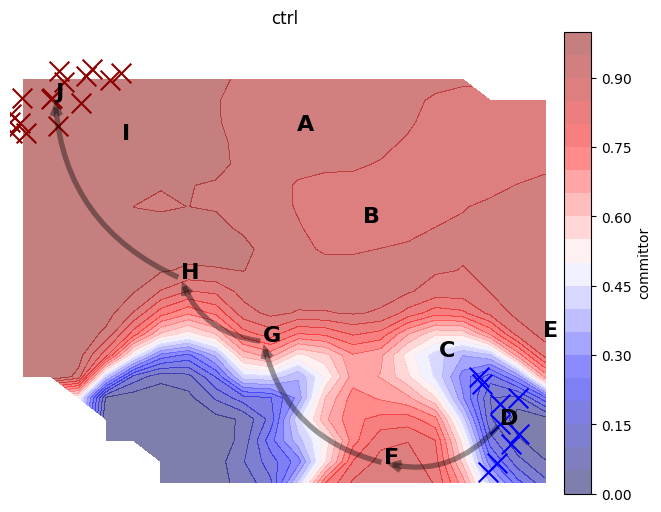

/tmp/ipykernel_22489/1400035987.py:41: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


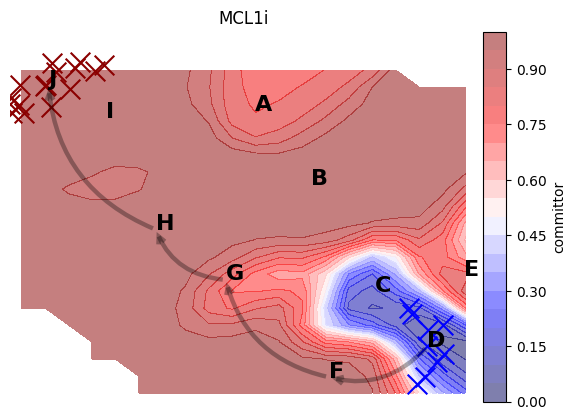

In [508]:
pcut=.05
fcut=0.
rad=.3
mscale=40.
arrowstyle='<-'
lws=10.
sh=2
state_centers=state_centers_minima
commsize=100
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
plt.figure(figsize=(7.5,6))
stateA=[3]; stateB=[9]
indSource=np.array([]).astype(int)
for isource in stateA:
    inds=np.where(stateSet==isource)[0]
    indSource=np.append(indSource,inds)

indTargets=np.array([]).astype(int)
for itargets in stateB:
    inds=np.where(stateSet==itargets)[0]
    indTargets=np.append(indTargets,inds)

for i in range(nf):
    #plt.subplot(4,4,i+2)
    plt.clf()
    Tmatrix=MtSet[i]
    indNotTargets=np.setdiff1d(range(Tmatrix.shape[0]),indTargets)
    indNotSource=np.setdiff1d(range(Tmatrix.shape[0]),indSource)
    prob=prob1
    levels=np.linspace(np.min(prob[prob>0]),np.max(prob),20)
    #plt.contourf(xx,yy,prob.T,levels=levels,cmap=plt.cm.gray_r,alpha=0.8)
    q=model.get_committor(Tmatrix,indTargets,indSource,conv=1.e-5)
    #plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=q,cmap=plt.cm.gist_heat,marker='o',vmin=0.,vmax=1.)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters[:,0],x_clusters[:,1],bins=nbins,weights=q.flatten())
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters[:,0],x_clusters[:,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx1,yy1=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(0,1,21) #np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.seismic,levels=levels,alpha=0.5)
    cbar=utilities.colorbar(cs)
    cbar.set_label('committor')
    plt.scatter(x_clusters[indTargets,0],x_clusters[indTargets,1],s=200,c='darkred',marker='x')
    plt.scatter(x_clusters[indSource,0],x_clusters[indSource,1],s=200,c='blue',marker='x')
    #pts=np.array([xx1.flatten(),yy1.flatten()]).T
    #indpts=clusters_2d.assign(pts)
    #states=stateSet[indpts]
    #plt.contour(xx,yy,states.reshape(nbins,nbins),levels=np.arange(nstates),colors='black')
    try:
        tpt=msmtools.flux.tpt(MtSetCG[i],stateA,stateB)
        pathways=tpt.pathways()
        paths=pathways[0]
        capacities=pathways[1]
        ax=plt.gca()
        for ipath in [0]: #range(-1,-len(paths)-1,-1):
            statepath=paths[ipath]
            colorpath=capacities[ipath]/np.sum(capacities)
            for ipath in range(statepath.size-1):
                j=statepath[ipath]
                k=statepath[ipath+1]
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[k,0], state_centers[k,1]), (state_centers[j,0], state_centers[j,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*colorpath,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*colorpath,joinstyle='miter',capstyle='butt',alpha=colorpath) #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
        for j in range(n_states):
            scolor=tpt.committor[j]+.01
            #plt.scatter(state_centers[j,0],state_centers[j,1],s=commsize,c=plt.cm.gist_heat(scolor),alpha=0.3)
            plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',weight='bold',fontsize=16,ma='center')
        plt.xlim(xmin,xmax)
        plt.ylim(ymin,ymax+.5)
        plt.axis('off')
        plt.title(tmSet[i])
        plt.savefig(f'{date}/pathways_sadtohappy_{figid}_{tmSet[i]}_nS{nstates}.png')
        plt.savefig(f'{date}/pathways_sadtohappy_{figid}_{tmSet[i]}_nS{nstates}.pdf')
        plt.pause(5)
    except:
        pass

q_states=np.zeros(nstates)
for istate in range(nstates):
    indstate=np.where(stateSet==istate)[0]
    q_states[istate]=np.mean(q[indstate,0])

state_order=np.argsort(q_states)

In [ ]:
#lets do some manual cell death annotation


In [66]:
def manual_death_validation(self,indcells,trajl=2,rep_channel=2,bf_channel=0,nuc_channel=1,msk_channel=0,pathto='./',save_pic=False,boundary_expansion=[1,40,40]):
    nc=indcells.size
    inds_death=np.array([]).astype(int)
    vals_death=np.array([]).astype(int)
    colors=['red']+['black']*(trajl-1)
    cblocks=np.zeros((indcells.size,self.ndim,2)).astype(int)
    for icb in range(nc):
        icell=indcells[icb]
        cblock=self.cellblocks[icell,...].copy()
        if boundary_expansion is not None:
            cblock[:,0]=cblock[:,0]-boundary_expansion
            cblock[:,0][cblock[:,0]<0]=0
            cblock[:,1]=cblock[:,1]+boundary_expansion
            indreplace=np.where(cblock[:,1]>self.image_shape)[0]
            cblock[:,1][indreplace]=self.image_shape[indreplace]
        cblocks[icb,...]=cblock
    for iic in range(nc):
        ic=indcells[iic]
        n_frame=self.cells_indimgSet[ic]
        img=self.get_image_data(n_frame)
        msk=self.get_mask_data(n_frame)
        cblock=cblocks[iic,...]
        imgc_test,mskc_relabeled=self.get_cell_data(ic,boundary_expansion=boundary_expansion,relabel_mskchannels=[msk_channel]) #get first cell image
        if self.ndim==3:
            imgc=img[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],cblock[2,0]:cblock[2,1],...]
            mskc=msk[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],cblock[2,0]:cblock[2,1],...]
            imgc=np.flip(imgc,axis=0);mskc=np.flip(mskc,axis=0);mskc_relabeled=np.flip(mskc_relabeled,axis=0);
        if self.ndim==2:
            imgc=img[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],...]
            mskc=msk[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],...]
        imgs=[None]*trajl
        msks=[None]*trajl
        imgs[0]=imgc
        msks[0]=mskc
        nzset=[imgs[0].shape[0]]
        for ifuture in range(1,trajl):
            img=self.get_image_data(n_frame+ifuture)
            msk=self.get_mask_data(n_frame+ifuture)
            cblock=cblocks[iic,...]
            if self.ndim==3:
                imgc=img[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],cblock[2,0]:cblock[2,1],...]
                mskc=msk[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],cblock[2,0]:cblock[2,1],...]
                imgc=np.flip(imgc,axis=0);mskc=np.flip(mskc,axis=0);
            if self.ndim==2:
                imgc=img[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],...]
                mskc=msk[cblock[0,0]:cblock[0,1],cblock[1,0]:cblock[1,1],...]
            imgs[ifuture]=imgc
            msks[ifuture]=mskc
            nzset.append(imgs[ifuture].shape[0])
        nzmax=np.max(nzset)
        if nzmax<3:
            nz_plots=3
        else:
            nz_plots=nzmax
        vertsize=3*nz_plots
        ny_plots=trajl
        hsize=3*ny_plots
        #fig=plt.figure(figsize=(12,vertsize))
        fig,ax=plt.subplots(nz_plots,ny_plots,figsize=(hsize,vertsize))
        for iz in range(nz_plots):
            for iy in range(ny_plots):
                ax[iz,iy].axis('off')
        for il in range(trajl):
            print(f'trajl: {trajl} il: {il}')
            nz=imgs[il].shape[0]
            for iz in range(nz):
                img_rep=imprep.znorm(imgs[il][iz,:,:,rep_channel])
                img_bf=imprep.znorm(imgs[il][iz,:,:,bf_channel])
                img_nuc=imprep.znorm(imgs[il][iz,:,:,nuc_channel])
                msk_cyto=mskc_relabeled[iz,:,:,msk_channel]==ic
                ax[iz,il].imshow(img_bf,cmap=plt.cm.binary,clim=(-3,3))
                if np.percentile(img_nuc,99)>1:
                    cs=ax[iz,il].contour(img_nuc,cmap=plt.cm.BuPu,levels=np.linspace(1,np.percentile(img_nuc,99),4),alpha=.2)
                    cs.cmap.set_over('purple')
                #if np.percentile(img_rep,99)>1:
                #    cs=ax[iz,il].contour(img_rep,cmap=plt.cm.YlOrBr_r,levels=np.linspace(1,np.percentile(img_rep,99),4),alpha=.2)
                #    cs.cmap.set_over('yellow')
                #ax[iz,il].contour(msk_cyto_all,levels=np.unique(msk_cyto_all),colors='black',linewidths=.4)
                ax[iz,il].contour(msk_cyto,colors=colors[il])
                ax[iz,il].axis('off')
                ax[iz,il].set_title('cell '+str(iic)+' of '+str(nc))
            #plt.pause(.5)
            titlestr='death validation: '
        imgfile=pathto+"cell%06d.png" % iic
        if save_pic:
            plt.savefig(imgfile)
        plt.show()
        inpstatus=True
        while inpstatus:
            vdeath = input("death validation (q to quit, -1 can't tell, 0 not death, 1 is death):\n")
            if vdeath=='q':
                return inds_death
            try:
                vdeath=int(vdeath)
                inpstatus=False
            except:
                print('invalid input')
        vals_death=np.append(vals_death,vdeath)
        if vdeath==1:
            inds_death=np.append(inds_death,ic)
        titlestr=titlestr+' '+str(vdeath)
        clear_output(wait=True)
        np.savetxt(f'{pathto}inds_death.dat',inds_death)
    return vals_death,inds_death

In [177]:
vals_death_set

[array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64),
 array([0]),
 array([0]),
 array([], dtype=int64),
 array([1]),
 array([0]),
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

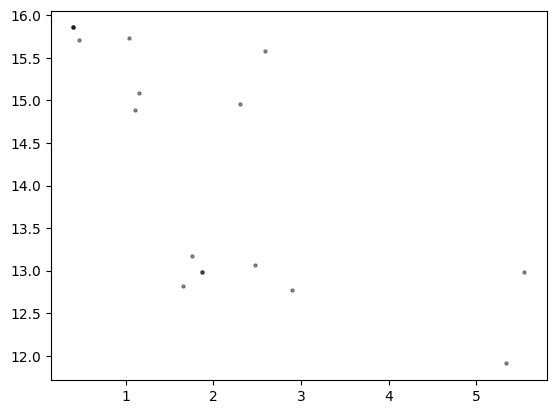

In [178]:
fu=30
fl=15
indmodels=np.where(inds_tmSet_models==1)[0]
indmodels=np.intersect1d(indmodels,indgood_models)
x_clusters_maybedeath=np.zeros((0,2)).astype(int)
vals_death_set=[None]*indmodels.size
inds_death_set=[None]*indmodels.size
for iimodel in range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm=modelSet[imodel]
    inds_last=np.array([]).astype(int)
    inds_xtraj=np.where(indtreatment_traj==imodel)[0]
    for itraj in range(len(sctm.trajectories)):
        ic_last=sctm.trajectories[itraj][-1]
        if sctm.cells_frameSet[ic_last] != np.max(sctm.cells_frameSet):
            inds_last=np.append(inds_last,ic_last)
    indstw=np.where(np.logical_and(sctm.cells_frameSet[inds_last]<fu,sctm.cells_frameSet[inds_last]>fl))[0]
    inds_last=inds_last[indstw]
    print(inds_last)
    inds_last_model,inds_common_xtraj,inds_common_last=np.intersect1d(cellinds1_traj[inds_xtraj],inds_last,return_indices=True)
    inds_last=inds_last[inds_common_last]
    print(sctm.cells_frameSet[inds_last])
    deathval_dir=f'./{date}/death_val/m{imodel}/'
    os.system(f'mkdir {deathval_dir}')
    vals_death_set[iimodel],inds_death_set[iimodel]=manual_death_validation(sctm,inds_last,trajl=4,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,msk_channel=cyto_msk_channel,pathto=deathval_dir,save_pic=True,boundary_expansion=[1,50,50])
    inds_common_xtraj=inds_common_xtraj[np.where(vals_death_set[iimodel]==1)[0]]
    x_clusters_maybedeath=np.append(x_clusters_maybedeath,x_clusters_all[inds_xtraj[inds_common_xtraj],:],axis=0)    

plt.scatter(x_clusters_maybedeath[:,0],x_clusters_maybedeath[:,1],s=20,color='black',marker='.',alpha=.4)

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


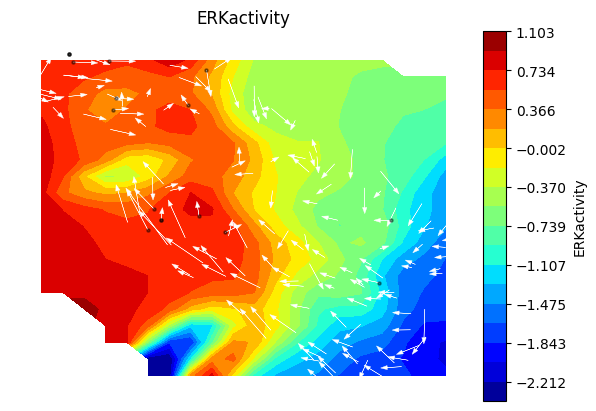

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


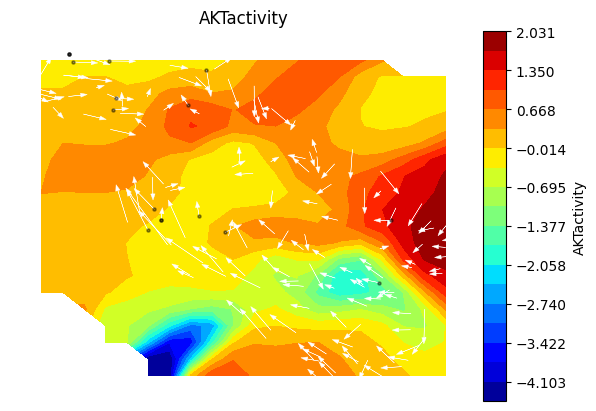

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


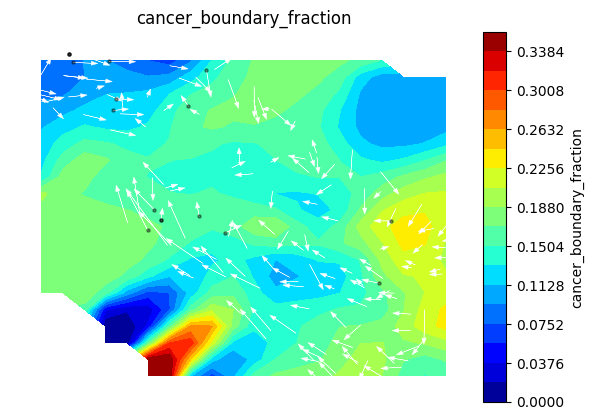

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


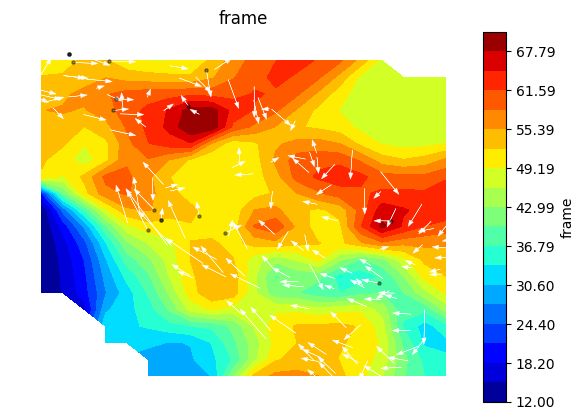

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


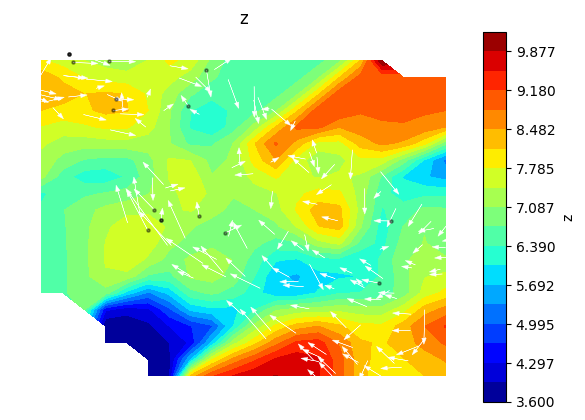

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


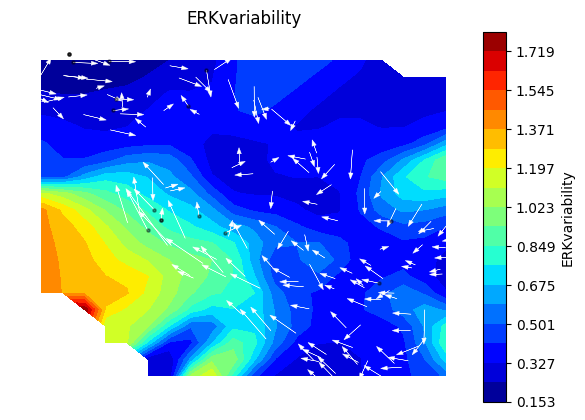

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


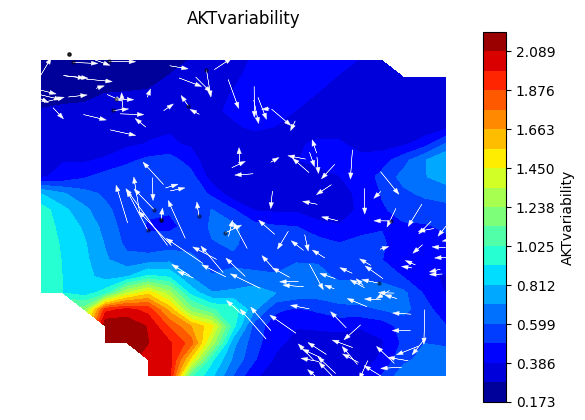

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


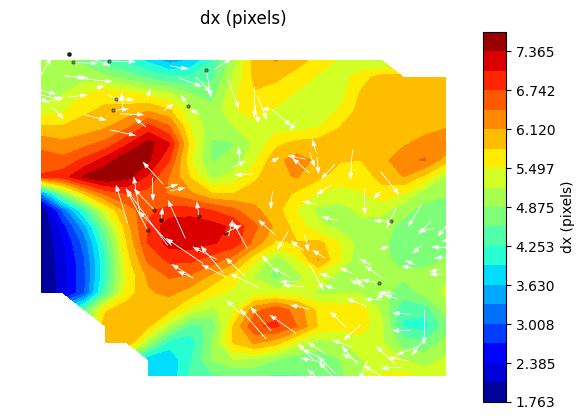

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


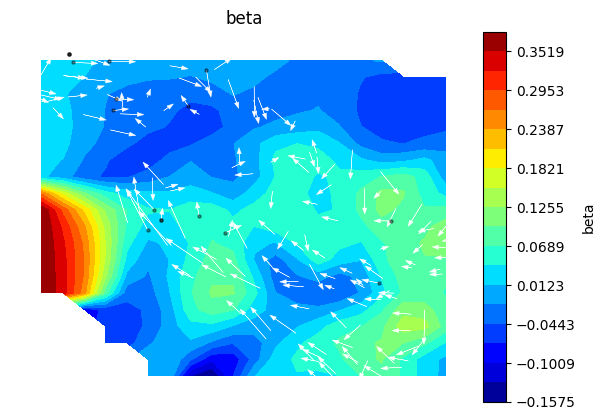

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


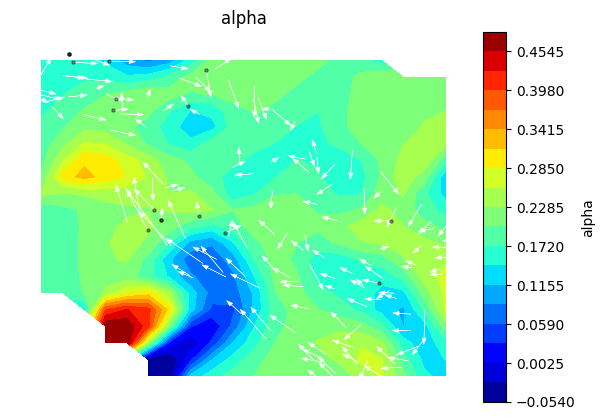

/tmp/ipykernel_2075/1761426138.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


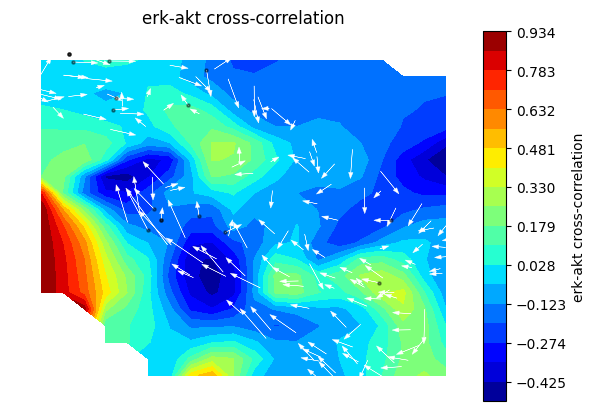

In [180]:
corrc_erk_var_traj=np.std(corrc_erk_full_traj,axis=1)
corrc_akt_var_traj=np.std(corrc_akt_full_traj,axis=1)
#vsetList=[corrc_traj,cb_ratio_traj-cbc_ratio_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_var_traj,dx_traj]
#captionset=['ERKactivity','normal_boundary_fraction','cancer_boundary_fraction','frame','z','ERKvariability','dx (pixels)']
vsetList=[corrc_erk_traj,corrc_akt_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,corrc_akt_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','cancer_boundary_fraction','frame','z','ERKvariability','AKTvariability','dx (pixels)','beta','alpha','erk-akt cross-correlation']
#vset=cb_ratio_traj
#vset=cc_ratio_traj
#vset=Xpcat[:,-3]
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
    plt.figure()
    #plt.subplot(4,4,1)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx,yy=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels)
    for ic in range(n_clusters):
        ax=plt.gca()
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.07,linewidth=.3,color='white',alpha=1.0)
    cs.cmap.set_over('darkred')
    cs.cmap.set_under('darkblue')
    cbar=utilities.colorbar(cs)
    cbar.set_label(captionset[iv])
    plt.scatter(x_clusters_maybedeath[:,0],x_clusters_maybedeath[:,1],s=20,color='black',marker='.',alpha=.4)
    #cbar.set_label('cell-cell boundary fraction')
    #cbar.set_label('speed')
    #cbar.set_label('beta')
    plt.title(captionset[iv])
    plt.axis('off')
    plt.savefig(date+'/'+captionset[iv]+'_maybedeathscatter_wflows_comb_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_maybedeathscatter_wflows_comb_'+figid+'.pdf')
    plt.pause(.4)

In [200]:
clusters_states=coor.clustering.AssignCenters(state_centers_minima, metric='euclidean')
inds_states=clusters_states.assign(x_clusters_maybedeath)
print(inds_states)
dstates,dcounts=np.unique(inds_states,return_counts=True)
print(dcounts)
rel_counts=np.divide(dcounts,state_probs_times[1,dstates,0])
print(rel_counts)
for istate in range(rel_counts.size):
    print(f'state {dstates[istate]}, counts: {rel_counts[istate]}')

[9 7 7 9 9 9 0 2 7 6 2 8 0 7 8 7 9]
[2 2 1 5 2 5]
[ 23.12612613  15.18934911  47.53703704 103.50806452  20.536
  15.1       ]
state 0, counts: 23.126126126126124
state 2, counts: 15.189349112426036
state 6, counts: 47.53703703703704
state 7, counts: 103.50806451612902
state 8, counts: 20.536
state 9, counts: 15.1


In [201]:
state_probs_times[1,:,0]

array([0.08648228, 0.1094663 , 0.13167121, 0.01168679, 0.04830541,
       0.11453058, 0.02103623, 0.04830541, 0.09738995, 0.33112583])

trajl: 4 il: 0
trajl: 4 il: 1
trajl: 4 il: 2
trajl: 4 il: 3


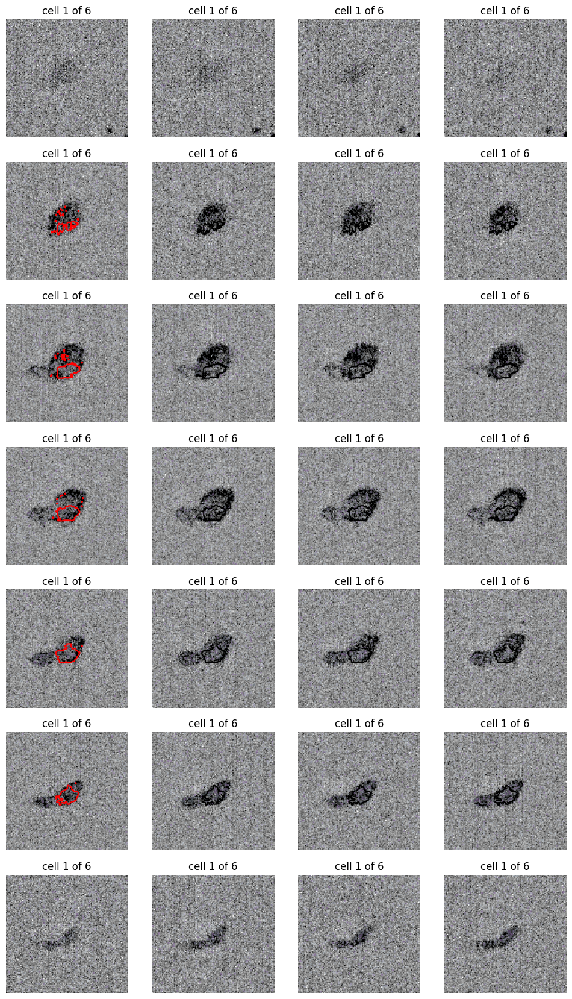

death validation (q to quit, -1 can't tell, 0 not death, 1 is death):
 q


ValueError: not enough values to unpack (expected 2, got 1)

In [80]:
fu=30
fl=15
indmodels=np.where(inds_tmSet_models==1)[0]
indmodels=np.intersect1d(indmodels,indgood_models)
vals_death_set=[None]*indmodels.size
inds_death_set=[None]*indmodels.size
for iimodel in range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm=modelSet[imodel]
    inds_last=np.array([]).astype(int)
    for itraj in range(len(sctm.trajectories)):
        ic_last=sctm.trajectories[itraj][-1]
        if sctm.cells_frameSet[ic_last] != np.max(sctm.cells_frameSet):
            inds_last=np.append(inds_last,ic_last)
    print(sctm.cells_frameSet[inds_last])
    indstw=np.where(np.logical_and(sctm.cells_frameSet[inds_last]<fu,sctm.cells_frameSet[inds_last]>fl))[0]
    inds_last=inds_last[indstw]
    print(inds_last)
    deathval_dir=f'./{date}/death_val/m{imodel}/'
    os.system(f'mkdir {deathval_dir}')
    vals_death_set[iimodel],inds_death_set[imodel]=manual_death_validation(sctm,inds_last,trajl=4,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,msk_channel=cyto_msk_channel,pathto=deathval_dir,save_pic=True,boundary_expansion=[1,50,50])


#### KMD

In [ ]:
test_start_frame=142
#testing_models=np.random.choice(indgood_models.size,ntest,replace=False)
testing_models=np.arange(indgood_models.size).astype(int)
#testing_models=np.arange(8).astype(int)
training_models=np.setdiff1d(np.arange(indgood_models.size).astype(int),testing_models)
testing_models=indgood_models[testing_models]
training_models=indgood_models[training_models]
inds_trajset_training=np.array([]).astype(int)
for imodel in training_models:
    indmodel=np.where(inds_trajsteps_models==imodel)[0]
    inds_trajset_training=np.append(inds_trajset_training,indmodel)

inds_trajset_testing=np.array([]).astype(int)
inds_trajset_testing_cellinds=np.array([]).astype(int)
for imodel in testing_models:
    indmodel=np.where(inds_trajsteps_models==imodel)[0]
    cellinds_model=modelSet[imodel].traj[inds_trajsteps[indmodel,1],-1]
    frames_model=modelSet[imodel].cells_frameSet[cellinds_model]
    inds_trajset_training=np.append(inds_trajset_training,indmodel[frames_model<=test_start_frame])
    inds_trajset_testing=np.append(inds_trajset_testing,indmodel[frames_model==test_start_frame])
    inds_trajset_testing_cellinds=np.append(inds_trajset_testing_cellinds,cellinds_model[frames_model==test_start_frame])

ntest_traj=inds_trajset_testing_cellinds.size
test_trajectories=[None]*ntest_traj
for itest in range(ntest_traj):
    indcell=inds_trajset_testing_cellinds[itest]
    imodel=inds_trajsteps_models[inds_trajset_testing[itest]]
    for itraj in range(len(modelSet[imodel].trajectories)):
        if np.sum(np.where(modelSet[imodel].trajectories[itraj]==indcell)[0])>0:
            cell_traj=modelSet[imodel].trajectories[itraj]
            start=np.where(cell_traj==indcell)[0]
            test_trajectories[itest]=cell_traj[start[0]:]

nplots=int(np.ceil(np.sqrt(ntest_traj)))
test_stds=np.zeros(ntest_traj)
ind_obs_pred=modelSet[0].Xpca.shape[1]-1 #ERK was the last one
#plt.clf()
for itraj in range(ntest_traj):
    imodel=inds_trajsteps_models[inds_trajset_testing[itraj]]
    #plt.subplot(nplots,nplots,itraj+1)
    obs_test=modelSet[imodel].Xpca[test_trajectories[itraj],ind_obs_pred]
    test_stds[itraj]=np.std(obs_test)

In [ ]:
feature_list

In [ ]:
def get_primary_frequency(series):
    rtha=np.abs(np.fft.fft(series))
    freq=np.fft.fftfreq(series.size)
    indf=freq>=0
    freq=freq[indf]
    rtha=rtha[indf]
    indsort=np.argsort(freq)
    freq=freq[indsort]
    rtha=rtha[indsort]
    rtha=rtha/np.sum(rtha)
    #mean_freq=np.sum(np.multiply(rtha,freq))
    mfreq=freq[np.argmax(rtha)]
    return mfreq

def average_delays_test(X_pred,trajl):
    test_steps=X_pred.shape[0]
    ncopies=int(X_pred.shape[1]/trajl)
    obs_pred_all=np.ones((ncopies,test_steps+trajl-1,trajl))*np.nan
    for icopy in range(ncopies):
        for itt in range(trajl):
            inds=np.arange(itt,itt+test_steps).astype(int)
            obs_pred_all[icopy,inds,itt]=X_pred[:,itt+icopy*trajl]
    obs_pred=np.nanmean(obs_pred_all,axis=(0,2))[(trajl-1):]
    return obs_pred

def organize_modes(wam):
    nmodes=wam.size
    mode_index=[]
    mode_absj=np.array([]).astype('complex128')
    wam_orig=wam.copy()
    while wam.size>0:
        w=wam[0]
        imode=np.where(wam_orig==w)[0][0]
        modeset=np.array([imode]).astype(int)
        imode_conj=np.where(wam_orig==np.conj(w))[0]
        if imode_conj.size>0 and imode_conj!=imode:
            modeset=np.append(modeset,imode_conj)
        mode_index.append(modeset)
        mode_absj=np.append(mode_absj,complex(np.real(w),np.abs(np.imag(w))))
        inds_leftover=np.setdiff1d(np.arange(wam.size).astype(int),np.arange(modeset.size))
        wam=wam[inds_leftover]
    return mode_index,mode_absj

def load_koopman_fromdict(koopman_dict): #koopman_dict = {"K":K, "M":M, "Xi":Xi, "Lam":Lam, "W":W, "phi_X":phi_X, "V":V}
    K=koopman_dict["K"]; M=koopman_dict["M"]; Xi=koopman_dict["Xi"]; Lam=koopman_dict["Lam"];
    W=koopman_dict["W"]; phi_X=koopman_dict["phi_X"]; V=koopman_dict["V"]
    return K,M,Xi,Lam,W,phi_X,V

In [ ]:
nplot_traj=inds_trajset_testing.size
#inds_plot=np.array([0,1,3,5,6,8,10,11,23,25,26,29,38,41,45,52]).astype(int);nplots=4
inds_plot=np.argsort(test_stds)[-nplot_traj:];nplots=int(np.ceil(np.sqrt(nplot_traj)));
ind_obs_pred=modelSet[0].Xpca.shape[1]-1 #ERK was the last one
ntraining_transitions=inds_trajset_training.size
inds_train=inds_trajset_training
#ntraining_transitions=1500
#inds_train=np.random.choice(inds_trajset_training,ntraining_transitions,replace=False)
inds_train=np.append(inds_train,inds_trajset_testing)
inds_test_starts=np.arange(ntraining_transitions,ntraining_transitions+ntest_traj).astype(int)
X=x0set[inds_train,:]
Y=x1set[inds_train,:]
#apply boundary conditions
#Acut=-2.;Bcut=2.
#indsA_X=np.where(X[:,-1]<Acut)[0]
#indsA_Y=np.where(Y[:,-1]<Acut)[0]
#indsB_X=np.where(X[:,-1]>Bcut)[0]
#indsB_Y=np.where(Y[:,-1]>Bcut)[0]
#Y[indsA_X,:]=1.e6 #anything in A goes to cemetery after one step
#Y[indsB_X,:]=-1.e6 #X[indsB_X,:] #anything in B stays in B
kname=f'koopman_trajl{trajl}_ERKonly1D_ntrain{ntraining_transitions}'
#1D-ification X=X[:,-1][:,np.newaxis]; Y=Y[:,-1][:,np.newaxis]
n_iterations=10
koopman_models=[None]*n_iterations
s=.1
#lamcut=0. #ntraining_transitions+inds_trajset_test.size
#lamcut_M=.9
M=np.eye(X.shape[1])
test_steps=48 #modelSet[0].nt-test_start_frame
test_frames=np.arange(test_start_frame,test_start_frame+test_steps).astype(int)
#nplots=int(np.ceil(np.sqrt(nplot_traj))); inds_plot=np.random.choice(np.arange(ntest_traj).astype(int),nplot_traj,replace=False)
rmse_iters=np.zeros(n_iterations)
corr_iters=np.zeros(n_iterations)
plt.close('all')
fig4=plt.figure(4,figsize=(14,12))
fig1=plt.figure(1,figsize=(14,12))
fig2=plt.figure(2,figsize=(8,6))
fig3=plt.figure(3,figsize=(9.4,4.5))
realcut=-0.05;imagcut=np.pi/16. #np.inf
X_orig=X.copy();Y_orig=Y.copy()
betaM=.001
for i_iter in range(n_iterations):
    M=(1.-betaM)*M+betaM*np.eye(X.shape[1])
    #dmat=scipy.spatial.distance.cdist(np.matmul(X,M),np.matmul(Y,M));plt.figure(3);plt.clf();sigma=get_scaled_sigma(dmat,visual=True);plt.pause(.1);h=np.ones(X.shape[0])*sigma
    XX=np.matlib.repmat(X,1,int(M.shape[1]/X.shape[1]));YY=np.matlib.repmat(Y,1,int(M.shape[1]/Y.shape[1]))
    h=model.get_kernel_sigmas(XX,M,s=s)
    psi_X=model.get_gaussianKernelM(XX,XX,M,h)
    psi_Y=model.get_gaussianKernelM(XX,YY,M,h)
    #K,Xi,Lam,W=model.get_koopman_eig(XX,YY,M=M.astype('float64'),h=h.astype('float64'),psi_X=psi_X.astype('float64'),psi_Y=psi_Y.astype('float64'))
    K,Xi,Lam,W=model.get_koopman_eig(XX,YY,M=M,h=h,psi_X=psi_X,psi_Y=psi_Y)
    wam=np.log(np.diag(Lam))
    lam=np.diag(Lam)
    indmodes=np.where(np.logical_and(np.real(wam)<0.15,np.abs(np.imag(wam))<np.pi/3.))[0]
    #indmodes=np.where(np.logical_and(np.real(wam)<np.inf,np.abs(np.imag(wam))<np.inf))[0]
    if indmodes.size==0:
        indmodes=np.array([0]).astype(int)
    phi_X,V=model.get_koopman_modes(psi_X,Xi[:,indmodes],W[:,indmodes],XX)
    spatial_frequencies=np.zeros(indmodes.size)
    for imode in range(indmodes.size):
        spatial_frequencies[imode]=get_primary_frequency(V[:,imode])
    indspatial=np.where(spatial_frequencies<.1)[0]
    wam_reconstr=wam[indmodes]
    lam_reconstr=lam[indmodes]
    indmodes_M1=np.where(np.logical_and(np.real(wam_reconstr)>realcut,np.abs(np.imag(wam_reconstr))<imagcut))[0];indmodes_M1=np.intersect1d(indmodes_M1,indspatial)
    indmodes_noimaginary=np.where(np.sum(np.abs(np.imag(phi_X)),axis=0)==0.)[0]; indmodes_M2=indmodes_noimaginary[np.logical_and(np.real(wam[indmodes_noimaginary])>realcut,np.abs(np.imag(wam_reconstr[indmodes_noimaginary]))<imagcut)];
    #indmodes_M2=np.array([indmodes_noimaginary[np.argmin(np.abs(lam_reconstr[indmodes_noimaginary]-(1.+0.j)))]]).astype(int)
    #indmodes_M2=np.array([indmodes_noimaginary[np.argmin(np.abs(lam_reconstr[indmodes_noimaginary]-(1.+0.j)))]]).astype(int)
    indmodes_M1=np.setdiff1d(indmodes_M1,indmodes_M2) #indmodes_M=np.array([indmodes_M1[0],indmodes_M2[0]])
    if indmodes_M1.size==0:
        indmodes_M1=np.array([np.setdiff1d(indmodes,indmodes_M2)[0]])
    plt.figure(4);plt.clf()
    for i in range(81):
        imode=indmodes[i];vim=np.zeros((test_steps,XX.shape[1])).astype('complex128');vim[0,:]=V[:,i];nm=48
        for inm in range(1,test_steps):
            vim[inm,:]=vim[inm-1,:]*lam[imode]
        plt.subplot(9,9,i+1);plt.imshow(np.real(vim),cmap=plt.cm.seismic,origin='lower');plt.axis('off')
        if np.isin(imode,indmodes[indmodes_M1]):
            plt.title(f'{wam[imode]:.2f}',color='red',fontweight='bold')
        elif np.isin(imode,indmodes[indmodes_M2]):
            plt.title(f'{wam[imode]:.2f}',color='green',fontweight='bold')
        else:
            plt.title(f'{wam[imode]:.2f}',color='gray')
    plt.savefig(f'{date}/{kname}_modeselectionlines_iter{i_iter}_{figid}.png');plt.pause(.1)
    print(f'iteration {i_iter} using {indmodes.size} koopman modes...')
    X_preds=model.get_koopman_inference_multiple(inds_test_starts,test_steps,phi_X,V,Lam,nmodes=indmodes)
    test_obs_trajectories=[None]*ntest_traj; pred_obs_trajectories=[None]*ntest_traj
    rmses=[];corrs=[];traj_lengths=np.zeros(ntest_traj).astype(int);
    for itraj in range(ntest_traj):
        X_pred=X_preds[itraj,...]
        obs_pred=obs_pred=X_pred[:,ind_obs_pred-pca.ndim]
        #obs_pred=average_delays_test(X_pred,trajl) #obs_pred=X_pred[:,-1]
        imodel=inds_trajsteps_models[inds_trajset_testing[itraj]]
        obs_test=modelSet[imodel].Xpca[test_trajectories[itraj],ind_obs_pred]
        nobs=np.min([obs_test.size,obs_pred.size])
        test_obs_trajectories[itraj]=obs_test;pred_obs_trajectories[itraj]=obs_pred
        rmse=np.linalg.norm(obs_test[0:nobs]-obs_pred[0:nobs])/np.linalg.norm(obs_test[0:nobs])
        corr=np.corrcoef(obs_test[0:nobs],obs_pred[0:nobs])[0,1]
        rmses.append(rmse);corrs.append(corr);traj_lengths[itraj]=nobs
    plt.figure(1);plt.clf();#inds_plot=np.random.choice(np.arange(ntest_traj).astype(int),nplot_traj,replace=False)
    for iplot in range(nplot_traj):
        itraj=inds_plot[iplot]
        if test_trajectories[itraj] is not None:
            obs_pred=pred_obs_trajectories[itraj];obs_test=test_obs_trajectories[itraj];nobs=np.min([obs_test.size,obs_pred.size])
            plt.subplot(nplots,nplots,iplot+1)
            plt.plot(test_frames[0:nobs],obs_pred[0:nobs],'k--');plt.plot(test_frames[0:nobs],obs_test[0:nobs],'k-');plt.ylim(-3.5,2.6);
            plt.title(f'e: {rmses[itraj]:.2f} c: {corrs[itraj]:.2f}');ax=plt.gca();#ax.set_yticklabels([None]*len(ax.get_yticklabels()))
            ax.spines['bottom'].set_position('zero');ax.spines['right'].set_color('none');ax.spines['top'].set_color('none');ax.xaxis.set_ticks_position('bottom');ax.yaxis.set_ticks_position('left')
            ax.spines['left'].set_color('none');ax.set_xticklabels([None]*len(ax.get_xticklabels()));plt.pause(.05)
    plt.savefig(f'{date}/{kname}_test_iter{i_iter}_{figid}.png');plt.pause(.1);
    plt.figure(3);plt.clf()
    rmse_tests=np.zeros(test_steps);corr_tests=np.zeros(test_steps);xset_test=np.ones((ntest_traj,test_steps));xset_pred=np.ones((ntest_traj,test_steps))
    for istep in range(test_steps):
        indtraj=np.where(traj_lengths>istep)[0]
        for itraj in range(ntest_traj):
            if traj_lengths[itraj]>istep:
                xset_test[itraj,istep]=test_obs_trajectories[itraj][istep]
                xset_pred[itraj,istep]=pred_obs_trajectories[itraj][istep]
        rmse_tests[istep]=np.linalg.norm(xset_test[indtraj,istep]-xset_pred[indtraj,istep])/np.linalg.norm(xset_test[indtraj,istep])
        corr_tests[istep]=np.corrcoef(xset_test[indtraj,istep],xset_pred[indtraj,istep])[0,1]
    plt.subplot(1,2,1);plt.plot(rmse_tests,'ko-');plt.xlabel('test frame');plt.ylabel('RMSE');plt.yscale('log');plt.ylim(.3,5.)
    plt.subplot(1,2,2);plt.plot(corr_tests,'ko-');plt.xlabel('test frame');plt.ylabel('correlation');plt.ylim(-.2,1);
    plt.savefig(f'{date}/{kname}_errortime_iter{i_iter}_{figid}.png');plt.pause(.1);
    koopman_dict = {"inds_train":inds_train, "K":K, "M":M, "Xi":Xi, "Lam":Lam, "W":W, "phi_X":phi_X, "V":V, "pred_obs_trajectories":pred_obs_trajectories, "rmse_tests":rmse_tests, "corr_tests":corr_tests}
    koopman_models[i_iter]=koopman_dict
    corr_iters[i_iter]=np.mean(corrs);rmse_iters[i_iter]=np.mean(rmses);
    Mprev=M.copy()
    print(f'iteration {i_iter} updating M with {indmodes_M1.size} flux modes and {indmodes_M2.size} stationary modes...')
    #M=model.update_mahalanobis_matrix_grad(Mprev,X,phi_X[:,indmodes_M2],h=h,s=s)
    #M=model.update_mahalanobis_matrix_flux(Mprev,X,phi_X[:,indmodes_M1],V[:,indmodes_M1],Lam[indmodes[indmodes_M1],:][:,indmodes[indmodes_M1]],h=h,s=s)
    #M=model.update_mahalanobis_matrix_J(Mprev,X,phi_X[:,indmodes_M],V[:,indmodes_M],Lam[indmodes[indmodes_M],:][:,indmodes[indmodes_M]],h=h,s=s)
    #plt.figure(2);plt.clf();plt.imshow(M,origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2))
    #plt.xlabel('feature (delay time)');plt.ylabel('feature (delay time)');plt.pause(.5);plt.savefig(f'{date}/{kname}_M_iter{i_iter+1}_{figid}.png')
    #mode_index,mode_absj=organize_modes(wam_reconstr);Mset=[]
    #for imode in range(mode_absj.size):
    #    if np.isin(mode_index[imode],indmodes_M1).any():
    #        indM=np.append(indM,mode_index[imode])
    #        M_one=model.update_mahalanobis_matrix_grad(Mprev,XX,phi_X[:,indM],h=h,s=s);Mset.append(M_one)
            #M_one=model.update_mahalanobis_matrix_J(Mprev,XX,phi_X[:,indM],V[:,indM],Lam[indmodes[indM],:][:,indmodes[indM]],h=h,s=s);Mset.append(M_one)
            #M_one=M=model.update_mahalanobis_matrix_flux(Mprev,XX,phi_X[:,indM],V[:,indM],Lam[indmodes[indM],:][:,indmodes[indM]],h=h,s=s);Mset.append(M_one)
    Mset=[];#indmodes_M2=np.append(indmodes_M1,indmodes_M2)
    #M2=model.update_mahalanobis_matrix_grad(Mprev,XX,phi_X[:,indmodes_M2],h=h,s=s);Mset.append(M2)
    indmodes_M2=np.append(indmodes_M2,indmodes_M1)
    M2=model.update_mahalanobis_matrix_J(Mprev,XX,Xi[:,indmodes[indmodes_M2]],V[:,indmodes_M2],lam_reconstr[indmodes_M2],h=h,s=s);Mset.append(M2)
    plt.figure(2);plt.clf();plt.imshow(np.abs(M2),origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2));plt.pause(2);
    #indmodes_M1=np.arange(10).astype(int)
    #M1=model.update_mahalanobis_matrix_J(Mprev,XX,phi_X[:,indmodes_M1],V[:,indmodes_M1],Lam[indmodes[indmodes_M1],:][:,indmodes[indmodes_M1]],h=h,s=s);Mset.append(M1)
    #M1=model.update_mahalanobis_matrix_J(Mprev,XX,Xi[:,indmodes[indmodes_M1]],V[:,indmodes_M1],lam_reconstr[indmodes_M1],h=h,s=s);Mset.append(M1)
    #plt.figure(2);plt.clf();plt.imshow(np.abs(M1),origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2));plt.pause(2);
    M=scipy.linalg.block_diag(*Mset)
    plt.figure(2);plt.clf();plt.imshow(np.real(M),origin='lower',cmap=plt.cm.Blues,clim=(-0.02,.2));
    if np.sum(np.imag(M))/np.sum(np.real(M))>1.e-10:
        plt.imshow(np.ma.masked_where(np.abs(np.imag(M))<np.mean(np.imag(M))+2*np.std(np.imag(M)),np.imag(M)),origin='lower',cmap=plt.cm.Reds,clim=(-.02,.02),alpha=.4);
    plt.xlabel('feature (delay time)');plt.ylabel('feature (delay time)');plt.savefig(f'{date}/{kname}_M_iter{i_iter+1}_{figid}.png');plt.pause(.5);

In [ ]:
inds_trajset_testing.shape

In [ ]:
np.histogram(corrc,bins=100)

In [ ]:
chist,cbins=np.histogram(corrc,bins=100)

In [ ]:
plt.plot(cbins[1:],chist)

In [ ]:
plt.scatter(np.mean(corrc_full_traj,axis=1),np.mean(d_f,axis=1),s=5,c='black',marker='.')

In [ ]:
np.corrcoef(np.mean(cs_full_traj.astype(float),axis=1),np.nanmean(cb_ratio_full_traj,axis=1))

In [ ]:
cs_full_traj=corrc_full_traj>np.mean(corrc_full_traj)

In [ ]:
x.shape

In [ ]:
cs_full_traj